In [1]:
# ---------------- Imports ----------------
import os
import random
import math
import numpy as np
import pandas as pd
from PIL import Image
from tqdm import tqdm
import matplotlib.pyplot as plt
from collections import Counter

import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
import timm

Detected 10 classes: ['backpack', 'comb', 'cup', 'earphones', 'pen', 'sneakers', 'suitcase', 'wallet', 'water_bottle', 'wrist_watch']
Train size: 482 | Val size: 124 | Batch size: 32
Model mobilevit_s prepared. Params to train: 4944042


Train Epoch [1/15]: 100%|███| 16/16 [01:01<00:00,  3.86s/it, train_loss=2.25]


Epoch [1/15] Train Loss: 2.2524 | Val Loss: 2.2324 | Val Acc: 0.2097
New best model saved: checkpoints/mobilevit_s_best.pth (val_acc=0.2097)


Train Epoch [2/15]: 100%|███| 16/16 [00:52<00:00,  3.29s/it, train_loss=2.09]


Epoch [2/15] Train Loss: 2.0869 | Val Loss: 2.1295 | Val Acc: 0.4516
New best model saved: checkpoints/mobilevit_s_best.pth (val_acc=0.4516)


Train Epoch [3/15]: 100%|████| 16/16 [00:52<00:00,  3.27s/it, train_loss=1.9]


Epoch [3/15] Train Loss: 1.9047 | Val Loss: 1.9908 | Val Acc: 0.6694
New best model saved: checkpoints/mobilevit_s_best.pth (val_acc=0.6694)


Train Epoch [4/15]: 100%|███| 16/16 [00:52<00:00,  3.28s/it, train_loss=1.69]


Epoch [4/15] Train Loss: 1.6889 | Val Loss: 1.7932 | Val Acc: 0.7823
New best model saved: checkpoints/mobilevit_s_best.pth (val_acc=0.7823)


Train Epoch [5/15]: 100%|███| 16/16 [00:52<00:00,  3.29s/it, train_loss=1.49]


Epoch [5/15] Train Loss: 1.4881 | Val Loss: 1.5864 | Val Acc: 0.8226
Saved checkpoint: checkpoints/mobilevit_s_epoch5.pth
New best model saved: checkpoints/mobilevit_s_best.pth (val_acc=0.8226)


Train Epoch [6/15]: 100%|███| 16/16 [00:52<00:00,  3.29s/it, train_loss=1.27]


Epoch [6/15] Train Loss: 1.2665 | Val Loss: 1.4274 | Val Acc: 0.8387
New best model saved: checkpoints/mobilevit_s_best.pth (val_acc=0.8387)


Train Epoch [7/15]: 100%|███| 16/16 [00:52<00:00,  3.29s/it, train_loss=1.08]


Epoch [7/15] Train Loss: 1.0832 | Val Loss: 1.2648 | Val Acc: 0.8710
New best model saved: checkpoints/mobilevit_s_best.pth (val_acc=0.8710)


Train Epoch [8/15]: 100%|██| 16/16 [00:52<00:00,  3.29s/it, train_loss=0.928]


Epoch [8/15] Train Loss: 0.9282 | Val Loss: 1.1367 | Val Acc: 0.8710


Train Epoch [9/15]: 100%|██| 16/16 [00:52<00:00,  3.30s/it, train_loss=0.847]


Epoch [9/15] Train Loss: 0.8473 | Val Loss: 1.1091 | Val Acc: 0.8548


Train Epoch [10/15]: 100%|█| 16/16 [00:52<00:00,  3.29s/it, train_loss=0.771]


Epoch [10/15] Train Loss: 0.7713 | Val Loss: 1.0397 | Val Acc: 0.8952
Saved checkpoint: checkpoints/mobilevit_s_epoch10.pth
New best model saved: checkpoints/mobilevit_s_best.pth (val_acc=0.8952)


Train Epoch [11/15]: 100%|█| 16/16 [00:52<00:00,  3.28s/it, train_loss=0.715]


Epoch [11/15] Train Loss: 0.7149 | Val Loss: 0.9645 | Val Acc: 0.8952


Train Epoch [12/15]: 100%|█| 16/16 [00:52<00:00,  3.29s/it, train_loss=0.727]


Epoch [12/15] Train Loss: 0.7272 | Val Loss: 0.9800 | Val Acc: 0.8952


Train Epoch [13/15]: 100%|█| 16/16 [00:52<00:00,  3.29s/it, train_loss=0.649]


Epoch [13/15] Train Loss: 0.6485 | Val Loss: 0.9284 | Val Acc: 0.9113
New best model saved: checkpoints/mobilevit_s_best.pth (val_acc=0.9113)


Train Epoch [14/15]: 100%|█| 16/16 [00:52<00:00,  3.29s/it, train_loss=0.651]


Epoch [14/15] Train Loss: 0.6514 | Val Loss: 0.9401 | Val Acc: 0.9194
New best model saved: checkpoints/mobilevit_s_best.pth (val_acc=0.9194)


Train Epoch [15/15]: 100%|██| 16/16 [00:52<00:00,  3.29s/it, train_loss=0.62]


Epoch [15/15] Train Loss: 0.6196 | Val Loss: 0.9320 | Val Acc: 0.9032
Saved checkpoint: checkpoints/mobilevit_s_epoch15.pth
Training finished. Best val acc: 0.9194. Final checkpoint: checkpoints/mobilevit_s_final.pth


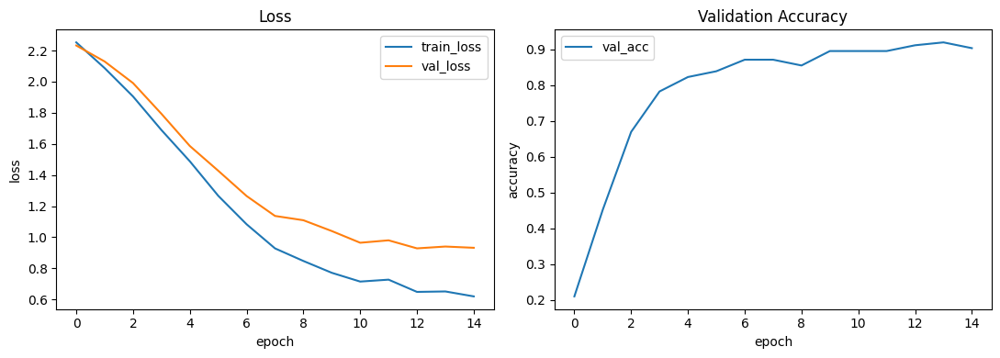

In [3]:
"""
Dataset-agnostic MobileViT training pipeline with checkpointing and GPU support.

Expectations:
- labels.csv contains columns: image_path, class_label, split (train/val), ...
- images referenced in image_path must be reachable relative to IMG_DIR or as absolute path.

Usage:
- Edit CONFIG section below for paths / hyperparams / model name.
- Run. Checkpoints saved to CKPT_DIR (contains model+optimizer+scheduler).
"""

# ---------------- CONFIG ----------------
CSV_PATH = "data/labels.csv"
IMG_DIR = "data"            # base folder for image files
MODEL_NAME = "mobilevit_s"         # timm model string; change to "deit_tiny_patch16_224" to compare
BATCH_SIZE = 32
EPOCHS = 15
LR = 1e-4
WEIGHT_DECAY = 1e-4
DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
NUM_WORKERS = 4 if torch.cuda.is_available() else 0
PIN_MEMORY = True if torch.cuda.is_available() else False

CKPT_DIR = "checkpoints_mobileViT_ourData"
os.makedirs(CKPT_DIR, exist_ok=True)
SAVE_EVERY_K_EPOCHS = 5           # save intermediate checkpoints every k epochs
SEED = 42

# ---------------- REPRODUCIBILITY ----------------
torch.manual_seed(SEED)
np.random.seed(SEED)
random.seed(SEED)
if DEVICE == "cuda":
    torch.cuda.manual_seed_all(SEED)
    torch.backends.cudnn.benchmark = True

# ---------------- Utilities ----------------
def infer_classes_from_csv(csv_path):
    df = pd.read_csv(csv_path)
    if "class_label" not in df.columns:
        raise ValueError("CSV must contain 'class_label' column.")
    class_names = sorted(df["class_label"].dropna().unique().tolist())
    if len(class_names) == 0:
        raise ValueError("No classes found in CSV 'class_label' column.")
    class_to_idx = {c: i for i, c in enumerate(class_names)}
    return class_names, class_to_idx

# ---------------- Dataset ----------------
class EverydayObjectsDataset(Dataset):
    def __init__(self, csv_path, img_dir, split=None, transform=None, class_to_idx=None):
        """
        csv_path: csv file path
        img_dir: base directory to prepend if image_path is relative
        split: "train" or "val" (if None, don't filter)
        transform: torchvision transforms to apply
        class_to_idx: mapping from class name to index (inferred externally)
        """
        self.df = pd.read_csv(csv_path)
        if split is not None:
            if "split" not in self.df.columns:
                raise ValueError("CSV has no 'split' column but split argument provided.")
            self.df = self.df[self.df["split"] == split].reset_index(drop=True)

        if len(self.df) == 0:
            raise ValueError(f"No rows left in CSV for split='{split}'. Check your CSV split column.")

        self.img_dir = img_dir
        self.transform = transform

        if class_to_idx is None:
            # infer classes from the subset dataframe
            class_names = sorted(self.df["class_label"].dropna().unique().tolist())
            self.class_to_idx = {c: i for i, c in enumerate(class_names)}
        else:
            self.class_to_idx = class_to_idx

        # ensure all labels are in mapping
        missing = set(self.df["class_label"].unique()) - set(self.class_to_idx.keys())
        if missing:
            raise ValueError(f"Found labels not in class_to_idx mapping: {missing}")

    def __len__(self):
        return len(self.df)

    def _resolve_path(self, p):
        # If path is absolute or already contains IMG_DIR prefix, keep; else join with IMG_DIR
        if os.path.isabs(p):
            return p
        # remove leading './' if any
        p_clean = p.lstrip("./")
        candidate = os.path.join(self.img_dir, p_clean)
        if os.path.exists(candidate):
            return candidate
        # fallback: if csv image path already contains 'images/...' and IMG_DIR contains same, try direct
        if os.path.exists(p):
            return p
        # as last resort, return candidate (it will error later)
        return candidate

    def __getitem__(self, idx):
        row = self.df.iloc[idx]
        img_path = row["image_path"]
        full_path = self._resolve_path(img_path)
        img = Image.open(full_path).convert("RGB")
        if self.transform:
            img = self.transform(img)
        label = self.class_to_idx[row["class_label"]]
        return img, label

# ---------------- Prepare data + class mapping ----------------
class_names, class_to_idx = infer_classes_from_csv(CSV_PATH)
NUM_CLASSES = len(class_names)
print(f"Detected {NUM_CLASSES} classes: {class_names}")

train_tfms = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.RandomHorizontalFlip(),
    transforms.RandomRotation(10),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])

val_tfms = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])

train_ds = EverydayObjectsDataset(CSV_PATH, IMG_DIR, split="train", transform=train_tfms, class_to_idx=class_to_idx)
val_ds   = EverydayObjectsDataset(CSV_PATH, IMG_DIR, split="val",   transform=val_tfms,   class_to_idx=class_to_idx)

train_dl = DataLoader(train_ds, batch_size=BATCH_SIZE, shuffle=True, num_workers=NUM_WORKERS, pin_memory=PIN_MEMORY)
val_dl   = DataLoader(val_ds, batch_size=BATCH_SIZE, shuffle=False, num_workers=NUM_WORKERS, pin_memory=PIN_MEMORY)

print(f"Train size: {len(train_ds)} | Val size: {len(val_ds)} | Batch size: {BATCH_SIZE}")

# ---------------- Build model ----------------
model = timm.create_model(MODEL_NAME, pretrained=True)
# replace classifier head to match dynamic NUM_CLASSES
try:
    in_feats = model.get_classifier().in_features
    model.reset_classifier(NUM_CLASSES)
except Exception:
    # fallback: try common alternatives
    if hasattr(model, "head"):
        in_feats = model.head.in_features
        model.head = nn.Linear(in_feats, NUM_CLASSES)
    elif hasattr(model, "classifier"):
        in_feats = model.classifier.in_features
        model.classifier = nn.Linear(in_feats, NUM_CLASSES)
    else:
        raise RuntimeError("Couldn't find classifier head on model; inspect model structure.")

model = model.to(DEVICE)
print(f"Model {MODEL_NAME} prepared. Params to train: {sum(p.numel() for p in model.parameters())}")

# ---------------- Optimizer / Loss / Scheduler ----------------
criterion = nn.CrossEntropyLoss()
optimizer = optim.AdamW(model.parameters(), lr=LR, weight_decay=WEIGHT_DECAY)
scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=EPOCHS)

# ---------------- Checkpoint helpers ----------------
def save_checkpoint(path, model, optimizer, scheduler, epoch, best_acc):
    ckpt = {
        "epoch": epoch,
        "model_state": model.state_dict(),
        "optimizer_state": optimizer.state_dict(),
        "scheduler_state": scheduler.state_dict(),
        "best_acc": best_acc,
        "class_names": class_names,
        "class_to_idx": class_to_idx,
    }
    torch.save(ckpt, path)

def load_checkpoint(path, model, optimizer=None, scheduler=None, map_location=None):
    ckpt = torch.load(path, map_location=map_location)
    model.load_state_dict(ckpt["model_state"])
    if optimizer is not None:
        optimizer.load_state_dict(ckpt["optimizer_state"])
    if scheduler is not None and "scheduler_state" in ckpt:
        scheduler.load_state_dict(ckpt["scheduler_state"])
    epoch = ckpt.get("epoch", 0)
    best_acc = ckpt.get("best_acc", 0.0)
    return epoch, best_acc

# Optional: resume from a checkpoint by uncommenting and editing this line
#resume_path = "checkpoints_mobileViT_ourData/mobilevit_best.pth"
# if os.path.exists(resume_path):
#     start_epoch, best_acc = load_checkpoint(resume_path, model, optimizer, scheduler, map_location=DEVICE)
# else:
start_epoch, best_acc = 0, 0.0

# ---------------- Training loop ----------------
train_losses, val_losses, val_accs = [], [], []

for epoch in range(start_epoch, EPOCHS):
    model.train()
    running_loss = 0.0
    loop = tqdm(train_dl, desc=f"Train Epoch [{epoch+1}/{EPOCHS}]")
    for imgs, labels in loop:
        imgs = imgs.to(DEVICE, non_blocking=True)
        labels = labels.to(DEVICE, non_blocking=True)

        optimizer.zero_grad()
        outputs = model(imgs)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        running_loss += loss.item()
        loop.set_postfix(train_loss=running_loss / (loop.n + 1))

    train_loss = running_loss / len(train_dl)
    train_losses.append(train_loss)

    # Validation
    model.eval()
    val_loss = 0.0
    correct = 0
    total = 0
    with torch.no_grad():
        for imgs, labels in val_dl:
            imgs = imgs.to(DEVICE, non_blocking=True)
            labels = labels.to(DEVICE, non_blocking=True)
            outputs = model(imgs)
            loss = criterion(outputs, labels)
            val_loss += loss.item()
            preds = torch.argmax(outputs, dim=1)
            correct += (preds == labels).sum().item()
            total += labels.size(0)

    val_loss = val_loss / len(val_dl)
    val_acc = correct / total
    val_losses.append(val_loss)
    val_accs.append(val_acc)

    print(f"Epoch [{epoch+1}/{EPOCHS}] Train Loss: {train_loss:.4f} | Val Loss: {val_loss:.4f} | Val Acc: {val_acc:.4f}")

    scheduler.step()

    # Checkpointing:
    # 1) intermediate periodic checkpoints
    if (epoch + 1) % SAVE_EVERY_K_EPOCHS == 0:
        ckpt_path = os.path.join(CKPT_DIR, f"{MODEL_NAME}_epoch{epoch+1}.pth")
        save_checkpoint(ckpt_path, model, optimizer, scheduler, epoch+1, best_acc)
        print(f"Saved checkpoint: {ckpt_path}")

    # 2) best validation accuracy
    if val_acc > best_acc:
        best_acc = val_acc
        best_path = os.path.join(CKPT_DIR, f"{MODEL_NAME}_best.pth")
        save_checkpoint(best_path, model, optimizer, scheduler, epoch+1, best_acc)
        print(f"New best model saved: {best_path} (val_acc={best_acc:.4f})")

# final save
final_path = os.path.join(CKPT_DIR, f"{MODEL_NAME}_final.pth")
save_checkpoint(final_path, model, optimizer, scheduler, EPOCHS, best_acc)
print(f"Training finished. Best val acc: {best_acc:.4f}. Final checkpoint: {final_path}")

# ---------------- Plotting ----------------
plt.figure(figsize=(11,4))
plt.subplot(1,2,1)
plt.plot(train_losses, label="train_loss")
plt.plot(val_losses, label="val_loss")
plt.xlabel("epoch")
plt.ylabel("loss")
plt.legend(); plt.title("Loss")

plt.subplot(1,2,2)
plt.plot(val_accs, label="val_acc")
plt.xlabel("epoch")
plt.ylabel("accuracy")
plt.legend(); plt.title("Validation Accuracy")
plt.tight_layout()
plt.show()

🔹 Loading model checkpoint...


/tmp/ipykernel_2763684/3530103406.py:31: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load(CKPT_PATH, map_location=DEVICE)


✅ Using class mapping from checkpoint: ['backpack', 'comb', 'cup', 'earphones', 'pen', 'sneakers', 'suitcase', 'wallet', 'water_bottle', 'wrist_watch']
✅ Loaded model from checkpoints_mobileViT_ourData/mobilevit_s_best.pth


Evaluating: 100%|█████████████████████████████████████████████████████████████████████████| 4/4 [00:07<00:00,  1.98s/it]
/home/f20220596/.local/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/f20220596/.local/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/f20220596/.local/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this


📊 Classification Report:
              precision    recall  f1-score   support

    backpack      0.933     1.000     0.966        14
        comb      0.000     0.000     0.000         0
         cup      1.000     0.923     0.960        13
   earphones      0.950     0.864     0.905        22
         pen      0.933     0.933     0.933        15
    sneakers      0.909     1.000     0.952        10
    suitcase      1.000     0.950     0.974        20
      wallet      0.714     1.000     0.833         5
water_bottle      0.882     1.000     0.938        15
 wrist_watch      0.857     0.600     0.706        10

    accuracy                          0.919       124
   macro avg      0.818     0.827     0.817       124
weighted avg      0.931     0.919     0.921       124


✅ Overall Accuracy: 91.94%


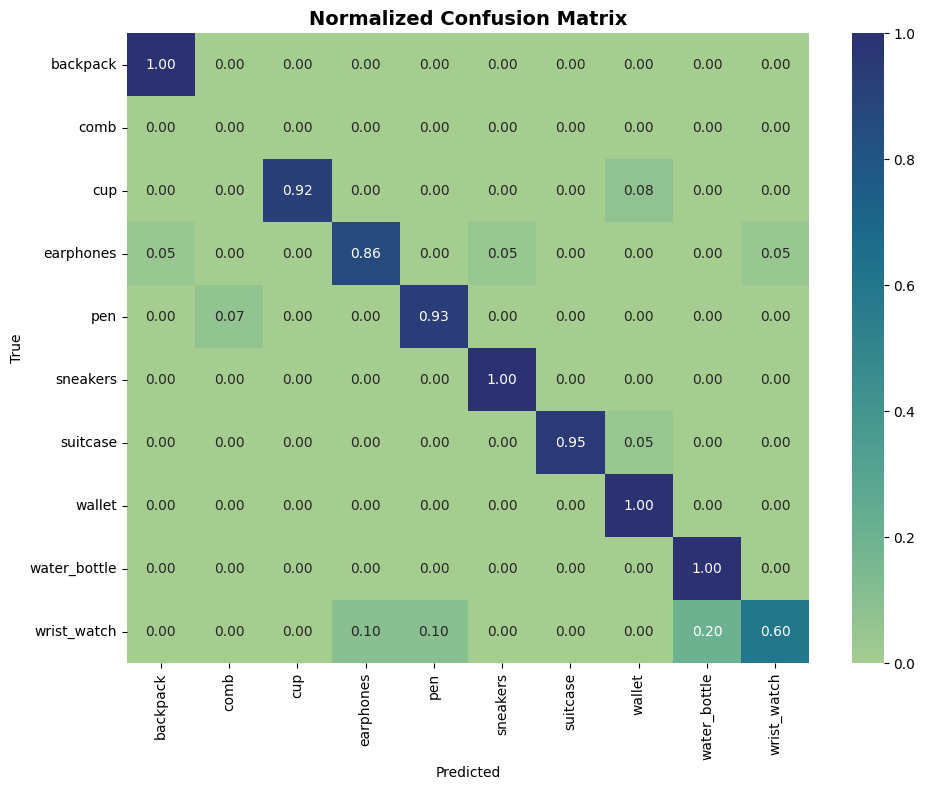


🔍 Extracting embeddings for t-SNE...


Extracting Embeddings: 100%|██████████████████████████████████████████████████████████████| 4/4 [00:08<00:00,  2.15s/it]


✅ Extracted embeddings shape: (124, 640)
✅ Labels shape: (124,)

⚙️ Running PCA (50D) → t-SNE (2D)...


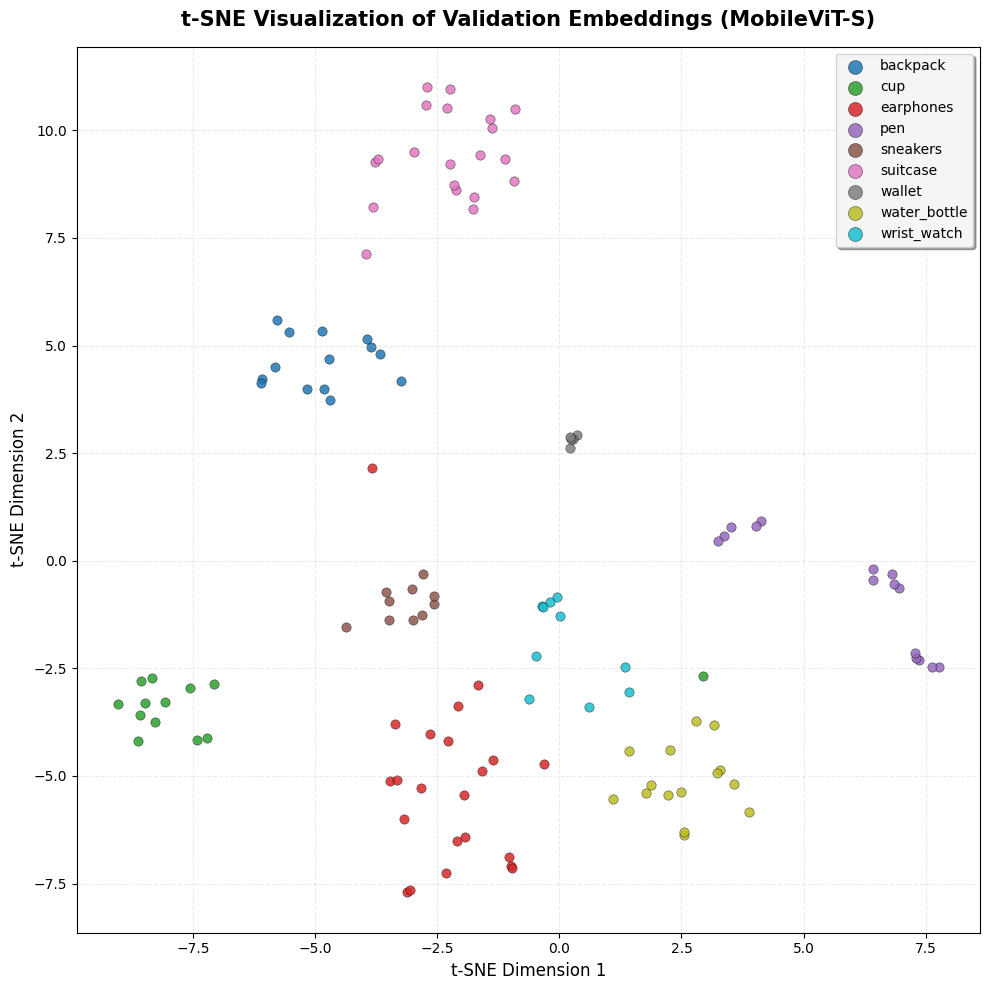

In [ ]:
import os
import torch
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import timm
from tqdm import tqdm
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA
from torchvision import transforms
from torch.utils.data import DataLoader, Dataset
from PIL import Image

# ---------------- CONFIG ----------------
CSV_PATH = "data/labels.csv"
CKPT_PATH = "checkpoints_mobileViT_ourData/mobilevit_s_best.pth"
MODEL_NAME = "mobilevit_s"
DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
SEED = 42
torch.manual_seed(SEED)
np.random.seed(SEED)

# ---------------- LOAD CHECKPOINT ----------------
print("Loading model checkpoint...")
checkpoint = torch.load(CKPT_PATH, map_location=DEVICE)

# Exact mapping from training
class_names = checkpoint["class_names"]
class_to_idx = checkpoint["class_to_idx"]
idx_to_class = {v: k for k, v in class_to_idx.items()}
NUM_CLASSES = len(class_names)
print(f"Using class mapping from checkpoint: {class_names}")

# ---------------- LOAD MODEL ----------------
model = timm.create_model(MODEL_NAME, pretrained=False, num_classes=NUM_CLASSES)
model.load_state_dict(checkpoint["model_state"])
model.to(DEVICE).eval()
print(f"Loaded model from {CKPT_PATH}")

# ---------------- DATASET ----------------
class EverydayObjectsDataset(Dataset):
    def __init__(self, csv_path, img_dir, split, transform, class_to_idx):
        self.df = pd.read_csv(csv_path)
        self.df = self.df[self.df["split"] == split].reset_index(drop=True)
        self.img_dir = img_dir
        self.transform = transform
        self.class_to_idx = class_to_idx

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        row = self.df.iloc[idx]
        img_path = os.path.join(self.img_dir, row["image_path"])
        img = Image.open(img_path).convert("RGB")
        if self.transform:
            img = self.transform(img)
        label = self.class_to_idx[row["class_label"]]
        return img, label

# ---------------- TRANSFORMS & DATALOADER ----------------
val_tfms = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])

val_ds = EverydayObjectsDataset(CSV_PATH, "data", "val", val_tfms, class_to_idx)
val_dl = DataLoader(val_ds, batch_size=32, shuffle=False)

# ================================================================
# MODEL EVALUATION
# ================================================================
all_preds, all_labels = [], []

with torch.no_grad():
    for imgs, labels in tqdm(val_dl, desc="Evaluating"):
        imgs, labels = imgs.to(DEVICE), labels.to(DEVICE)
        outputs = model(imgs)
        preds = torch.argmax(outputs, dim=1)
        all_preds.extend(preds.cpu().numpy())
        all_labels.extend(labels.cpu().numpy())

all_preds = np.array(all_preds)
all_labels = np.array(all_labels)

# ---------------- METRICS ----------------
print("\n Classification Report:")
report = classification_report(all_labels, all_preds, target_names=class_names, digits=3)
print(report)

acc = np.mean(all_preds == all_labels)
print(f"\n Overall Accuracy: {acc*100:.2f}%")

# ---------------- CONFUSION MATRIX ----------------
cm = confusion_matrix(all_labels, all_preds, normalize='true')
plt.figure(figsize=(10, 8))
sns.heatmap(cm, annot=True, fmt=".2f", xticklabels=class_names,
            yticklabels=class_names, cmap="crest")
plt.title("Normalized Confusion Matrix", fontsize=14, weight='bold')
plt.xlabel("Predicted")
plt.ylabel("True")
plt.tight_layout()
plt.show()

# ================================================================
# FEATURE SPACE VISUALIZATION (t-SNE)
# ================================================================
print("\n Extracting embeddings for t-SNE...")

embeddings, labels_list = [], []
with torch.no_grad():
    for imgs, labels in tqdm(val_dl, desc="Extracting Embeddings"):
        imgs = imgs.to(DEVICE)
        feats = model.forward_features(imgs)
        feats = feats.mean(dim=[2, 3])  # global average pooling
        embeddings.append(feats.cpu().numpy())

        labels_np = np.array(labels.cpu().numpy()).ravel()[:imgs.size(0)]
        labels_list.extend(labels_np)

embeddings = np.concatenate(embeddings, axis=0)
labels_list = np.array(labels_list)[:embeddings.shape[0]]

print(f"Extracted embeddings shape: {embeddings.shape}")
print(f"Labels shape: {labels_list.shape}")

# ---------------- PCA → t-SNE ----------------
print("\n Running PCA (50D) → t-SNE (2D)...")
pca_50 = PCA(n_components=50, random_state=SEED).fit_transform(embeddings)
tsne_2d = TSNE(
    n_components=2,
    perplexity=30,
    init='pca',
    random_state=SEED,
    learning_rate='auto',
    n_iter=1000
).fit_transform(pca_50)

# ---------------- PLOT ----------------
plt.figure(figsize=(10, 10))
palette = sns.color_palette("tab10", NUM_CLASSES)

for i, cls in enumerate(class_names):
    idx = labels_list == i
    if np.sum(idx) == 0:
        continue
    plt.scatter(
        tsne_2d[idx, 0],
        tsne_2d[idx, 1],
        s=45,
        color=palette[i],
        label=cls,
        alpha=0.85,
        linewidths=0.3,
        edgecolors='black'
    )

plt.title("t-SNE Visualization of Validation Embeddings (MobileViT-S)",
          fontsize=15, weight='bold', pad=15)
plt.xlabel("t-SNE Dimension 1", fontsize=12)
plt.ylabel("t-SNE Dimension 2", fontsize=12)
plt.legend(markerscale=1.5, fontsize=10, loc="best",
           frameon=True, fancybox=True, framealpha=0.9, shadow=True)
plt.grid(alpha=0.25, linestyle='--')
plt.tight_layout()
plt.show()

In [ ]:
"""
Multi-Attribute MobileViT fine-tuning pipeline.
Parses 'attributes' column (format: color:black;material:metal;pattern:plain;...) 
and trains a 3-headed classifier for top 3 attributes.
Handles 'unknown' gracefully, masks them during evaluation, and supports checkpoint resume.
"""

import os, random, math, pickle
import numpy as np, pandas as pd
from PIL import Image
from tqdm import tqdm
import matplotlib.pyplot as plt

import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
import timm
from collections import Counter

# ---------------- CONFIG ----------------
CSV_PATH = "data/labels.csv"
IMG_DIR = "data"
MODEL_NAME = "mobilevit_s"
BATCH_SIZE = 32
EPOCHS = 500
LR = 1e-4
WEIGHT_DECAY = 1e-4
DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
NUM_WORKERS = 4 if torch.cuda.is_available() else 0
PIN_MEMORY = torch.cuda.is_available()
CKPT_DIR = "checkpoints_mobileViT_ourData_attr"
os.makedirs(CKPT_DIR, exist_ok=True)
SAVE_EVERY_K_EPOCHS = 5
SEED = 42
# RESUME_PATH = os.path.join(CKPT_DIR, f"{MODEL_NAME}_epoch50.pth")
RESUME_PATH = ""
METRICS_PATH = os.path.join(CKPT_DIR, "metrics_attr.pkl")

# ---------------- REPRODUCIBILITY ----------------
torch.manual_seed(SEED)
np.random.seed(SEED)
random.seed(SEED)
if DEVICE == "cuda":
    torch.cuda.manual_seed_all(SEED)
    torch.backends.cudnn.benchmark = True

# ---------------- Parse 'attributes' column ----------------
df = pd.read_csv(CSV_PATH)
if "attributes" not in df.columns:
    raise ValueError("CSV must contain 'attributes' column.")

def parse_attributes(attr_str):
    result = {}
    if pd.isna(attr_str):
        return result
    for part in str(attr_str).split(";"):
        if ":" in part:
            k, v = part.split(":", 1)
            result[k.strip()] = v.strip()
    return result

df["parsed_attr"] = df["attributes"].apply(parse_attributes)

# Count all attribute keys
attr_counter = Counter()
for d in df["parsed_attr"]:
    attr_counter.update(d.keys())

# pick top 3 by frequency
top_attrs = [k for k, _ in attr_counter.most_common(3)]
print(f"Top 3 attributes selected: {top_attrs}")

# Build value sets and add 'unknown' token
attr_values = {attr: set() for attr in top_attrs}
for d in df["parsed_attr"]:
    for a in top_attrs:
        attr_values[a].add(d.get(a, "unknown"))
for a in top_attrs:
    attr_values[a].add("unknown")

attr_mappings = {a: {v: i for i, v in enumerate(sorted(vals))} for a, vals in attr_values.items()}

print("\nAttribute class mappings:")
for k, v in attr_mappings.items():
    print(f" - {k} ({len(v)} classes): {list(v.keys())}")

# ---------------- Dataset ----------------
class MultiAttributeDataset(Dataset):
    def __init__(self, df, img_dir, split=None, transform=None, attr_mappings=None):
        if split is not None and "split" in df.columns:
            df = df[df["split"] == split].reset_index(drop=True)
        self.df = df
        self.img_dir = img_dir
        self.transform = transform
        self.attr_mappings = attr_mappings

    def __len__(self):
        return len(self.df)

    def _resolve_path(self, p):
        if os.path.isabs(p):
            return p
        p_clean = p.lstrip("./")
        candidate = os.path.join(self.img_dir, p_clean)
        return candidate if os.path.exists(candidate) else p

    def __getitem__(self, idx):
        row = self.df.iloc[idx]
        img = Image.open(self._resolve_path(row["image_path"])).convert("RGB")
        if self.transform:
            img = self.transform(img)

        parsed = row["parsed_attr"]
        targets = []
        for a in top_attrs:
            val = parsed.get(a, "unknown")
            val_idx = self.attr_mappings[a].get(val, self.attr_mappings[a]["unknown"])
            targets.append(val_idx)
        return img, torch.tensor(targets, dtype=torch.long)

# ---------------- Transforms ----------------
train_tfms = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.RandomHorizontalFlip(),
    transforms.RandomRotation(10),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])
val_tfms = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])

train_ds = MultiAttributeDataset(df, IMG_DIR, split="train", transform=train_tfms, attr_mappings=attr_mappings)
val_ds   = MultiAttributeDataset(df, IMG_DIR, split="val",   transform=val_tfms,   attr_mappings=attr_mappings)

train_dl = DataLoader(train_ds, batch_size=BATCH_SIZE, shuffle=True, num_workers=NUM_WORKERS, pin_memory=PIN_MEMORY)
val_dl   = DataLoader(val_ds, batch_size=BATCH_SIZE, shuffle=False, num_workers=NUM_WORKERS, pin_memory=PIN_MEMORY)

print(f"\nTrain size: {len(train_ds)} | Val size: {len(val_ds)} | Batch size: {BATCH_SIZE}")

# ---------------- Model ----------------
class MultiHeadMobileViT(nn.Module):
    def __init__(self, base_model_name, num_classes_per_attr):
        super().__init__()
        self.backbone = timm.create_model(base_model_name, pretrained=True, num_classes=0)
        in_feats = self.backbone.num_features
        self.heads = nn.ModuleList([nn.Linear(in_feats, n) for n in num_classes_per_attr])
    def forward(self, x):
        feats = self.backbone(x)
        return [head(feats) for head in self.heads]

num_classes_per_attr = [len(attr_mappings[a]) for a in top_attrs]
model = MultiHeadMobileViT(MODEL_NAME, num_classes_per_attr).to(DEVICE)
print(f"\nModel with {len(top_attrs)} heads created: {dict(zip(top_attrs, num_classes_per_attr))}")

# ---------------- Optimizer / Loss / Scheduler ----------------
criterion = nn.CrossEntropyLoss()
optimizer = optim.AdamW(model.parameters(), lr=LR, weight_decay=WEIGHT_DECAY)
scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=EPOCHS)

# ---------------- Resume Support ----------------
start_epoch, best_acc = 0, 0.0
train_losses, val_losses, val_accs_per_attr = [], [], [[] for _ in top_attrs]

# Load previous metrics if available
if os.path.exists(METRICS_PATH):
    with open(METRICS_PATH, "rb") as f:
        train_losses, val_losses, val_accs_per_attr = pickle.load(f)
    print(f"Loaded previous metrics ({len(train_losses)} epochs).")

# Load checkpoint if available
if os.path.exists(RESUME_PATH):
    print(f"Resuming from checkpoint: {RESUME_PATH}")
    ckpt = torch.load(RESUME_PATH, map_location=DEVICE)
    model.load_state_dict(ckpt["model_state"])
    if "optimizer_state" in ckpt: optimizer.load_state_dict(ckpt["optimizer_state"])
    if "scheduler_state" in ckpt: scheduler.load_state_dict(ckpt["scheduler_state"])
    start_epoch = ckpt.get("epoch", 0)
    best_acc = ckpt.get("best_acc", 0.0)
    print(f"Resumed at epoch {start_epoch} with best_acc={best_acc:.4f}")
else:
    print("No checkpoint found. Starting fresh training.")

# ---------------- Training Loop ----------------
for epoch in range(start_epoch, start_epoch + EPOCHS):
    model.train()
    running_loss = 0.0
    loop = tqdm(train_dl, desc=f"Train Epoch [{epoch+1}]")
    for imgs, targets in loop:
        imgs, targets = imgs.to(DEVICE), targets.to(DEVICE)
        optimizer.zero_grad()
        outputs = model(imgs)
        losses = [criterion(out, targets[:, i]) for i, out in enumerate(outputs)]
        loss = sum(losses)
        loss.backward()
        optimizer.step()
        running_loss += loss.item()
        loop.set_postfix(loss=running_loss / (loop.n + 1))
    train_losses.append(running_loss / len(train_dl))

    # Validation
    model.eval()
    val_loss, corrects, totals = 0.0, [0]*len(top_attrs), [0]*len(top_attrs)
    with torch.no_grad():
        for imgs, targets in val_dl:
            imgs, targets = imgs.to(DEVICE), targets.to(DEVICE)
            outputs = model(imgs)
            losses = [criterion(out, targets[:, i]) for i, out in enumerate(outputs)]
            val_loss += sum(losses).item()
            for i, (out, attr) in enumerate(zip(outputs, top_attrs)):
                preds = torch.argmax(out, dim=1)
                unknown_idx = attr_mappings[attr]["unknown"]
                mask = targets[:, i] != unknown_idx
                corrects[i] += ((preds == targets[:, i]) & mask).sum().item()
                totals[i] += mask.sum().item()

    val_loss /= len(val_dl)
    val_losses.append(val_loss)
    accs = [(c/t if t > 0 else 0) for c, t in zip(corrects, totals)]
    mean_acc = np.mean(accs)
    for i, a in enumerate(accs):
        val_accs_per_attr[i].append(a)

    print(f"Epoch {epoch+1}: Val Loss={val_loss:.4f} | Mean Acc={mean_acc:.4f} | {dict(zip(top_attrs, [f'{x:.3f}' for x in accs]))}")
    scheduler.step()

    # Save metrics every epoch
    with open(METRICS_PATH, "wb") as f:
        pickle.dump((train_losses, val_losses, val_accs_per_attr), f)

    # Periodic checkpoint
    if (epoch + 1) % SAVE_EVERY_K_EPOCHS == 0:
        ckpt_path = os.path.join(CKPT_DIR, f"{MODEL_NAME}_epoch{epoch+1}.pth")
        torch.save({
            "epoch": epoch + 1,
            "model_state": model.state_dict(),
            "optimizer_state": optimizer.state_dict(),
            "scheduler_state": scheduler.state_dict(),
            "attr_mappings": attr_mappings,
            "best_acc": best_acc,
            "top_attrs": top_attrs
        }, ckpt_path)
        print(f" Saved checkpoint: {ckpt_path}")

    # Save best model
    if mean_acc > best_acc:
        best_acc = mean_acc
        best_ckpt_path = os.path.join(CKPT_DIR, f"{MODEL_NAME}_attr_best.pth")
        torch.save({
            "epoch": epoch + 1,
            "model_state": model.state_dict(),
            "optimizer_state": optimizer.state_dict(),
            "scheduler_state": scheduler.state_dict(),
            "attr_mappings": attr_mappings,
            "best_acc": best_acc,
            "top_attrs": top_attrs
        }, best_ckpt_path)
        print(f"🏆 Saved best model (Acc={best_acc:.4f}): {best_ckpt_path}")

Top 3 attributes selected: ['color', 'material', 'pattern']

Attribute class mappings:
 - color (14 classes): ['black', 'blue', 'brown', 'green', 'grey', 'orange', 'pink', 'purple', 'red', 'silver', 'transparent', 'unknown', 'white', 'yellow']
 - material (8 classes): ['ceramic', 'fabric', 'leather', 'metal', 'nylon', 'plastic', 'rubber', 'unknown']
 - pattern (5 classes): ['patterned', 'plain', 'striped', 'textured', 'unknown']

Train size: 482 | Val size: 124 | Batch size: 32

Model with 3 heads created: {'color': 14, 'material': 8, 'pattern': 5}
⚠️ No checkpoint found. Starting fresh training.


Train Epoch [1]: 100%|███████████████████████████████████████████████████████| 16/16 [02:11<00:00,  8.24s/it, loss=6.27]


Epoch 1: Val Loss=6.2502 | Mean Acc=0.1958 | {'color': '0.177', 'material': '0.242', 'pattern': '0.168'}
🏆 Saved best model (Acc=0.1958): checkpoints_attr/mobilevit_s_attr_best.pth


Train Epoch [2]: 100%|███████████████████████████████████████████████████████| 16/16 [01:06<00:00,  4.15s/it, loss=6.03]


Epoch 2: Val Loss=6.1411 | Mean Acc=0.2965 | {'color': '0.177', 'material': '0.411', 'pattern': '0.301'}
🏆 Saved best model (Acc=0.2965): checkpoints_attr/mobilevit_s_attr_best.pth


Train Epoch [3]: 100%|███████████████████████████████████████████████████████| 16/16 [01:02<00:00,  3.93s/it, loss=5.79]


Epoch 3: Val Loss=6.0214 | Mean Acc=0.4093 | {'color': '0.234', 'material': '0.516', 'pattern': '0.478'}
🏆 Saved best model (Acc=0.4093): checkpoints_attr/mobilevit_s_attr_best.pth


Train Epoch [4]: 100%|███████████████████████████████████████████████████████| 16/16 [00:53<00:00,  3.35s/it, loss=5.51]


Epoch 4: Val Loss=5.8357 | Mean Acc=0.5073 | {'color': '0.315', 'material': '0.597', 'pattern': '0.611'}
🏆 Saved best model (Acc=0.5073): checkpoints_attr/mobilevit_s_attr_best.pth


Train Epoch [5]: 100%|███████████████████████████████████████████████████████| 16/16 [00:53<00:00,  3.35s/it, loss=5.18]


Epoch 5: Val Loss=5.6644 | Mean Acc=0.5325 | {'color': '0.339', 'material': '0.613', 'pattern': '0.646'}
💾 Saved checkpoint: checkpoints_attr/mobilevit_s_epoch5.pth
🏆 Saved best model (Acc=0.5325): checkpoints_attr/mobilevit_s_attr_best.pth


Train Epoch [6]: 100%|███████████████████████████████████████████████████████| 16/16 [00:53<00:00,  3.35s/it, loss=4.79]


Epoch 6: Val Loss=5.4907 | Mean Acc=0.5487 | {'color': '0.363', 'material': '0.637', 'pattern': '0.646'}
🏆 Saved best model (Acc=0.5487): checkpoints_attr/mobilevit_s_attr_best.pth


Train Epoch [7]: 100%|███████████████████████████████████████████████████████| 16/16 [00:53<00:00,  3.33s/it, loss=4.47]


Epoch 7: Val Loss=5.3600 | Mean Acc=0.5379 | {'color': '0.331', 'material': '0.637', 'pattern': '0.646'}


Train Epoch [8]: 100%|███████████████████████████████████████████████████████| 16/16 [00:53<00:00,  3.35s/it, loss=4.14]


Epoch 8: Val Loss=5.3352 | Mean Acc=0.5371 | {'color': '0.395', 'material': '0.597', 'pattern': '0.619'}


Train Epoch [9]: 100%|███████████████████████████████████████████████████████| 16/16 [00:53<00:00,  3.35s/it, loss=3.87]


Epoch 9: Val Loss=5.1131 | Mean Acc=0.5374 | {'color': '0.339', 'material': '0.645', 'pattern': '0.628'}


Train Epoch [10]: 100%|███████████████████████████████████████████████████████| 16/16 [00:53<00:00,  3.35s/it, loss=3.6]


Epoch 10: Val Loss=5.3169 | Mean Acc=0.5087 | {'color': '0.347', 'material': '0.613', 'pattern': '0.566'}
💾 Saved checkpoint: checkpoints_attr/mobilevit_s_epoch10.pth


Train Epoch [11]: 100%|██████████████████████████████████████████████████████| 16/16 [00:53<00:00,  3.35s/it, loss=3.34]


Epoch 11: Val Loss=5.3253 | Mean Acc=0.5028 | {'color': '0.355', 'material': '0.605', 'pattern': '0.549'}


Train Epoch [12]: 100%|██████████████████████████████████████████████████████| 16/16 [00:53<00:00,  3.32s/it, loss=3.22]


Epoch 12: Val Loss=5.0623 | Mean Acc=0.5167 | {'color': '0.371', 'material': '0.613', 'pattern': '0.566'}


Train Epoch [13]: 100%|██████████████████████████████████████████████████████| 16/16 [00:53<00:00,  3.35s/it, loss=3.01]


Epoch 13: Val Loss=5.0194 | Mean Acc=0.5307 | {'color': '0.395', 'material': '0.613', 'pattern': '0.584'}


Train Epoch [14]: 100%|██████████████████████████████████████████████████████| 16/16 [00:53<00:00,  3.35s/it, loss=2.85]


Epoch 14: Val Loss=5.1113 | Mean Acc=0.5243 | {'color': '0.427', 'material': '0.597', 'pattern': '0.549'}


Train Epoch [15]: 100%|██████████████████████████████████████████████████████| 16/16 [00:53<00:00,  3.35s/it, loss=2.56]


Epoch 15: Val Loss=5.0650 | Mean Acc=0.5154 | {'color': '0.435', 'material': '0.589', 'pattern': '0.522'}
💾 Saved checkpoint: checkpoints_attr/mobilevit_s_epoch15.pth


Train Epoch [16]: 100%|██████████████████████████████████████████████████████| 16/16 [00:53<00:00,  3.35s/it, loss=2.43]


Epoch 16: Val Loss=5.1634 | Mean Acc=0.4988 | {'color': '0.435', 'material': '0.556', 'pattern': '0.504'}


Train Epoch [17]: 100%|██████████████████████████████████████████████████████| 16/16 [00:53<00:00,  3.35s/it, loss=2.34]


Epoch 17: Val Loss=5.1131 | Mean Acc=0.4985 | {'color': '0.435', 'material': '0.565', 'pattern': '0.496'}


Train Epoch [18]: 100%|██████████████████████████████████████████████████████| 16/16 [00:53<00:00,  3.34s/it, loss=2.23]


Epoch 18: Val Loss=5.1260 | Mean Acc=0.5017 | {'color': '0.427', 'material': '0.565', 'pattern': '0.513'}


Train Epoch [19]: 100%|██████████████████████████████████████████████████████| 16/16 [00:53<00:00,  3.34s/it, loss=1.96]


Epoch 19: Val Loss=5.0923 | Mean Acc=0.4934 | {'color': '0.444', 'material': '0.532', 'pattern': '0.504'}


Train Epoch [20]: 100%|██████████████████████████████████████████████████████| 16/16 [00:53<00:00,  3.33s/it, loss=1.84]


Epoch 20: Val Loss=4.9991 | Mean Acc=0.4939 | {'color': '0.419', 'material': '0.540', 'pattern': '0.522'}
💾 Saved checkpoint: checkpoints_attr/mobilevit_s_epoch20.pth


Train Epoch [21]: 100%|██████████████████████████████████████████████████████| 16/16 [00:53<00:00,  3.35s/it, loss=1.83]


Epoch 21: Val Loss=5.1806 | Mean Acc=0.5200 | {'color': '0.468', 'material': '0.597', 'pattern': '0.496'}


Train Epoch [22]: 100%|██████████████████████████████████████████████████████| 16/16 [00:53<00:00,  3.35s/it, loss=1.67]


Epoch 22: Val Loss=5.4554 | Mean Acc=0.4838 | {'color': '0.468', 'material': '0.532', 'pattern': '0.451'}


Train Epoch [23]: 100%|██████████████████████████████████████████████████████| 16/16 [00:53<00:00,  3.35s/it, loss=1.57]


Epoch 23: Val Loss=5.5308 | Mean Acc=0.4728 | {'color': '0.435', 'material': '0.540', 'pattern': '0.442'}


Train Epoch [24]: 100%|██████████████████████████████████████████████████████| 16/16 [00:53<00:00,  3.35s/it, loss=1.42]


Epoch 24: Val Loss=5.3501 | Mean Acc=0.4846 | {'color': '0.444', 'material': '0.532', 'pattern': '0.478'}


Train Epoch [25]: 100%|██████████████████████████████████████████████████████| 16/16 [00:53<00:00,  3.34s/it, loss=1.43]


Epoch 25: Val Loss=5.5536 | Mean Acc=0.4905 | {'color': '0.468', 'material': '0.508', 'pattern': '0.496'}
💾 Saved checkpoint: checkpoints_attr/mobilevit_s_epoch25.pth


Train Epoch [26]: 100%|██████████████████████████████████████████████████████| 16/16 [00:53<00:00,  3.35s/it, loss=1.34]


Epoch 26: Val Loss=5.4190 | Mean Acc=0.5128 | {'color': '0.476', 'material': '0.540', 'pattern': '0.522'}


Train Epoch [27]: 100%|██████████████████████████████████████████████████████| 16/16 [00:53<00:00,  3.35s/it, loss=1.33]


Epoch 27: Val Loss=5.3785 | Mean Acc=0.5120 | {'color': '0.484', 'material': '0.556', 'pattern': '0.496'}


Train Epoch [28]: 100%|██████████████████████████████████████████████████████| 16/16 [00:53<00:00,  3.35s/it, loss=1.22]


Epoch 28: Val Loss=5.9116 | Mean Acc=0.4943 | {'color': '0.484', 'material': '0.556', 'pattern': '0.442'}


Train Epoch [29]: 100%|██████████████████████████████████████████████████████| 16/16 [00:53<00:00,  3.35s/it, loss=1.17]


Epoch 29: Val Loss=5.5127 | Mean Acc=0.4897 | {'color': '0.468', 'material': '0.532', 'pattern': '0.469'}


Train Epoch [30]: 100%|██████████████████████████████████████████████████████| 16/16 [00:53<00:00,  3.35s/it, loss=1.14]


Epoch 30: Val Loss=5.6693 | Mean Acc=0.5144 | {'color': '0.500', 'material': '0.556', 'pattern': '0.487'}
💾 Saved checkpoint: checkpoints_attr/mobilevit_s_epoch30.pth


Train Epoch [31]: 100%|██████████████████████████████████████████████████████| 16/16 [00:53<00:00,  3.35s/it, loss=1.07]


Epoch 31: Val Loss=5.8573 | Mean Acc=0.4930 | {'color': '0.492', 'material': '0.589', 'pattern': '0.398'}


Train Epoch [32]: 100%|█████████████████████████████████████████████████████| 16/16 [00:53<00:00,  3.35s/it, loss=0.973]


Epoch 32: Val Loss=5.2306 | Mean Acc=0.5439 | {'color': '0.492', 'material': '0.565', 'pattern': '0.575'}


Train Epoch [33]: 100%|██████████████████████████████████████████████████████| 16/16 [00:53<00:00,  3.34s/it, loss=1.03]


Epoch 33: Val Loss=5.5211 | Mean Acc=0.5074 | {'color': '0.468', 'material': '0.532', 'pattern': '0.522'}


Train Epoch [34]: 100%|█████████████████████████████████████████████████████| 16/16 [00:53<00:00,  3.35s/it, loss=0.964]


Epoch 34: Val Loss=5.7754 | Mean Acc=0.5088 | {'color': '0.500', 'material': '0.548', 'pattern': '0.478'}


Train Epoch [35]: 100%|█████████████████████████████████████████████████████| 16/16 [00:53<00:00,  3.35s/it, loss=0.842]


Epoch 35: Val Loss=5.7108 | Mean Acc=0.5208 | {'color': '0.468', 'material': '0.573', 'pattern': '0.522'}
💾 Saved checkpoint: checkpoints_attr/mobilevit_s_epoch35.pth


Train Epoch [36]: 100%|█████████████████████████████████████████████████████| 16/16 [00:53<00:00,  3.35s/it, loss=0.974]


Epoch 36: Val Loss=5.8225 | Mean Acc=0.4929 | {'color': '0.484', 'material': '0.508', 'pattern': '0.487'}


Train Epoch [37]: 100%|█████████████████████████████████████████████████████| 16/16 [00:53<00:00,  3.35s/it, loss=0.821]


Epoch 37: Val Loss=5.6650 | Mean Acc=0.5120 | {'color': '0.476', 'material': '0.565', 'pattern': '0.496'}


Train Epoch [38]: 100%|██████████████████████████████████████████████████████| 16/16 [00:53<00:00,  3.36s/it, loss=0.91]


Epoch 38: Val Loss=5.8325 | Mean Acc=0.5058 | {'color': '0.484', 'material': '0.565', 'pattern': '0.469'}


Train Epoch [39]: 100%|█████████████████████████████████████████████████████| 16/16 [00:55<00:00,  3.45s/it, loss=0.747]


Epoch 39: Val Loss=5.8914 | Mean Acc=0.4996 | {'color': '0.484', 'material': '0.573', 'pattern': '0.442'}


Train Epoch [40]: 100%|█████████████████████████████████████████████████████| 16/16 [00:59<00:00,  3.69s/it, loss=0.758]


Epoch 40: Val Loss=6.4052 | Mean Acc=0.5080 | {'color': '0.508', 'material': '0.565', 'pattern': '0.451'}
💾 Saved checkpoint: checkpoints_attr/mobilevit_s_epoch40.pth


Train Epoch [41]: 100%|█████████████████████████████████████████████████████| 16/16 [01:04<00:00,  4.04s/it, loss=0.851]


Epoch 41: Val Loss=6.2850 | Mean Acc=0.4918 | {'color': '0.492', 'material': '0.532', 'pattern': '0.451'}


Train Epoch [42]: 100%|█████████████████████████████████████████████████████| 16/16 [01:05<00:00,  4.07s/it, loss=0.805]


Epoch 42: Val Loss=6.4858 | Mean Acc=0.5082 | {'color': '0.492', 'material': '0.573', 'pattern': '0.460'}


Train Epoch [43]: 100%|█████████████████████████████████████████████████████| 16/16 [01:05<00:00,  4.10s/it, loss=0.743]


Epoch 43: Val Loss=6.6700 | Mean Acc=0.4913 | {'color': '0.492', 'material': '0.548', 'pattern': '0.434'}


Train Epoch [44]: 100%|█████████████████████████████████████████████████████| 16/16 [01:04<00:00,  4.03s/it, loss=0.728]


Epoch 44: Val Loss=6.8625 | Mean Acc=0.4800 | {'color': '0.476', 'material': '0.548', 'pattern': '0.416'}


Train Epoch [45]: 100%|█████████████████████████████████████████████████████| 16/16 [01:04<00:00,  4.03s/it, loss=0.644]


Epoch 45: Val Loss=6.7922 | Mean Acc=0.4999 | {'color': '0.508', 'material': '0.540', 'pattern': '0.451'}
💾 Saved checkpoint: checkpoints_attr/mobilevit_s_epoch45.pth


Train Epoch [46]: 100%|█████████████████████████████████████████████████████| 16/16 [01:02<00:00,  3.92s/it, loss=0.776]


Epoch 46: Val Loss=6.6426 | Mean Acc=0.4838 | {'color': '0.500', 'material': '0.500', 'pattern': '0.451'}


Train Epoch [47]: 100%|█████████████████████████████████████████████████████| 16/16 [01:01<00:00,  3.82s/it, loss=0.789]


Epoch 47: Val Loss=6.1369 | Mean Acc=0.5327 | {'color': '0.556', 'material': '0.573', 'pattern': '0.469'}


Train Epoch [48]: 100%|██████████████████████████████████████████████████████| 16/16 [01:03<00:00,  3.94s/it, loss=0.62]


Epoch 48: Val Loss=6.1312 | Mean Acc=0.5021 | {'color': '0.516', 'material': '0.556', 'pattern': '0.434'}


Train Epoch [49]: 100%|█████████████████████████████████████████████████████| 16/16 [01:04<00:00,  4.05s/it, loss=0.645]


Epoch 49: Val Loss=6.4655 | Mean Acc=0.5203 | {'color': '0.484', 'material': '0.573', 'pattern': '0.504'}


Train Epoch [50]: 100%|█████████████████████████████████████████████████████| 16/16 [01:04<00:00,  4.02s/it, loss=0.586]


Epoch 50: Val Loss=6.9338 | Mean Acc=0.4833 | {'color': '0.460', 'material': '0.556', 'pattern': '0.434'}
💾 Saved checkpoint: checkpoints_attr/mobilevit_s_epoch50.pth


Train Epoch [51]: 100%|█████████████████████████████████████████████████████| 16/16 [01:04<00:00,  4.05s/it, loss=0.474]


Epoch 51: Val Loss=6.8399 | Mean Acc=0.4806 | {'color': '0.468', 'material': '0.540', 'pattern': '0.434'}


Train Epoch [52]: 100%|█████████████████████████████████████████████████████| 16/16 [01:04<00:00,  4.05s/it, loss=0.581]


Epoch 52: Val Loss=6.4939 | Mean Acc=0.4999 | {'color': '0.492', 'material': '0.556', 'pattern': '0.451'}


Train Epoch [53]: 100%|█████████████████████████████████████████████████████| 16/16 [01:05<00:00,  4.07s/it, loss=0.602]


Epoch 53: Val Loss=6.2409 | Mean Acc=0.5166 | {'color': '0.516', 'material': '0.565', 'pattern': '0.469'}


Train Epoch [54]: 100%|█████████████████████████████████████████████████████| 16/16 [01:05<00:00,  4.08s/it, loss=0.476]


Epoch 54: Val Loss=6.7538 | Mean Acc=0.4916 | {'color': '0.468', 'material': '0.565', 'pattern': '0.442'}


Train Epoch [55]: 100%|█████████████████████████████████████████████████████| 16/16 [01:04<00:00,  4.04s/it, loss=0.531]


Epoch 55: Val Loss=6.5848 | Mean Acc=0.5141 | {'color': '0.476', 'material': '0.589', 'pattern': '0.478'}
💾 Saved checkpoint: checkpoints_attr/mobilevit_s_epoch55.pth


Train Epoch [56]: 100%|█████████████████████████████████████████████████████| 16/16 [01:05<00:00,  4.10s/it, loss=0.628]


Epoch 56: Val Loss=6.8414 | Mean Acc=0.5053 | {'color': '0.508', 'material': '0.556', 'pattern': '0.451'}


Train Epoch [57]: 100%|█████████████████████████████████████████████████████| 16/16 [01:05<00:00,  4.09s/it, loss=0.528]


Epoch 57: Val Loss=6.5857 | Mean Acc=0.5031 | {'color': '0.476', 'material': '0.565', 'pattern': '0.469'}


Train Epoch [58]: 100%|█████████████████████████████████████████████████████| 16/16 [00:57<00:00,  3.62s/it, loss=0.509]


Epoch 58: Val Loss=7.1717 | Mean Acc=0.4760 | {'color': '0.444', 'material': '0.524', 'pattern': '0.460'}


Train Epoch [59]: 100%|█████████████████████████████████████████████████████| 16/16 [00:53<00:00,  3.34s/it, loss=0.488]


Epoch 59: Val Loss=7.0249 | Mean Acc=0.5080 | {'color': '0.492', 'material': '0.581', 'pattern': '0.451'}


Train Epoch [60]: 100%|█████████████████████████████████████████████████████| 16/16 [00:57<00:00,  3.56s/it, loss=0.527]


Epoch 60: Val Loss=6.8565 | Mean Acc=0.5192 | {'color': '0.492', 'material': '0.597', 'pattern': '0.469'}
💾 Saved checkpoint: checkpoints_attr/mobilevit_s_epoch60.pth


Train Epoch [61]: 100%|█████████████████████████████████████████████████████| 16/16 [00:59<00:00,  3.72s/it, loss=0.594]


Epoch 61: Val Loss=6.4911 | Mean Acc=0.5294 | {'color': '0.508', 'material': '0.540', 'pattern': '0.540'}


Train Epoch [62]: 100%|███████████████████████████████████████████████████████| 16/16 [01:00<00:00,  3.77s/it, loss=0.4]


Epoch 62: Val Loss=6.5784 | Mean Acc=0.5166 | {'color': '0.508', 'material': '0.573', 'pattern': '0.469'}


Train Epoch [63]: 100%|██████████████████████████████████████████████████████| 16/16 [00:58<00:00,  3.67s/it, loss=0.41]


Epoch 63: Val Loss=6.5749 | Mean Acc=0.5058 | {'color': '0.468', 'material': '0.581', 'pattern': '0.469'}


Train Epoch [64]: 100%|█████████████████████████████████████████████████████| 16/16 [00:58<00:00,  3.64s/it, loss=0.449]


Epoch 64: Val Loss=7.0758 | Mean Acc=0.5112 | {'color': '0.476', 'material': '0.589', 'pattern': '0.469'}


Train Epoch [65]: 100%|█████████████████████████████████████████████████████| 16/16 [01:02<00:00,  3.92s/it, loss=0.371]


Epoch 65: Val Loss=7.5720 | Mean Acc=0.5107 | {'color': '0.484', 'material': '0.597', 'pattern': '0.451'}
💾 Saved checkpoint: checkpoints_attr/mobilevit_s_epoch65.pth


Train Epoch [66]: 100%|█████████████████████████████████████████████████████| 16/16 [00:59<00:00,  3.71s/it, loss=0.526]


Epoch 66: Val Loss=7.0867 | Mean Acc=0.5278 | {'color': '0.500', 'material': '0.597', 'pattern': '0.487'}


Train Epoch [67]: 100%|█████████████████████████████████████████████████████| 16/16 [00:59<00:00,  3.75s/it, loss=0.519]


Epoch 67: Val Loss=6.9521 | Mean Acc=0.5337 | {'color': '0.500', 'material': '0.597', 'pattern': '0.504'}


Train Epoch [68]: 100%|█████████████████████████████████████████████████████| 16/16 [00:59<00:00,  3.74s/it, loss=0.633]


Epoch 68: Val Loss=7.1344 | Mean Acc=0.5144 | {'color': '0.500', 'material': '0.556', 'pattern': '0.487'}


Train Epoch [69]: 100%|█████████████████████████████████████████████████████| 16/16 [00:59<00:00,  3.71s/it, loss=0.456]


Epoch 69: Val Loss=7.2007 | Mean Acc=0.5141 | {'color': '0.500', 'material': '0.565', 'pattern': '0.478'}


Train Epoch [70]: 100%|█████████████████████████████████████████████████████| 16/16 [00:59<00:00,  3.69s/it, loss=0.419]


Epoch 70: Val Loss=6.8368 | Mean Acc=0.5286 | {'color': '0.500', 'material': '0.573', 'pattern': '0.513'}
💾 Saved checkpoint: checkpoints_attr/mobilevit_s_epoch70.pth


Train Epoch [71]: 100%|█████████████████████████████████████████████████████| 16/16 [01:03<00:00,  3.97s/it, loss=0.293]


Epoch 71: Val Loss=7.7266 | Mean Acc=0.5117 | {'color': '0.492', 'material': '0.556', 'pattern': '0.487'}


Train Epoch [72]: 100%|█████████████████████████████████████████████████████| 16/16 [00:58<00:00,  3.65s/it, loss=0.436]


Epoch 72: Val Loss=7.8405 | Mean Acc=0.4875 | {'color': '0.484', 'material': '0.492', 'pattern': '0.487'}


Train Epoch [73]: 100%|█████████████████████████████████████████████████████| 16/16 [00:59<00:00,  3.74s/it, loss=0.483]


Epoch 73: Val Loss=7.9362 | Mean Acc=0.4806 | {'color': '0.492', 'material': '0.516', 'pattern': '0.434'}


Train Epoch [74]: 100%|█████████████████████████████████████████████████████| 16/16 [00:59<00:00,  3.75s/it, loss=0.349]


Epoch 74: Val Loss=7.1528 | Mean Acc=0.5364 | {'color': '0.500', 'material': '0.605', 'pattern': '0.504'}


Train Epoch [75]: 100%|█████████████████████████████████████████████████████| 16/16 [01:00<00:00,  3.76s/it, loss=0.381]


Epoch 75: Val Loss=7.3215 | Mean Acc=0.5496 | {'color': '0.540', 'material': '0.613', 'pattern': '0.496'}
💾 Saved checkpoint: checkpoints_attr/mobilevit_s_epoch75.pth
🏆 Saved best model (Acc=0.5496): checkpoints_attr/mobilevit_s_attr_best.pth


Train Epoch [76]: 100%|█████████████████████████████████████████████████████| 16/16 [01:00<00:00,  3.76s/it, loss=0.488]


Epoch 76: Val Loss=8.0883 | Mean Acc=0.5045 | {'color': '0.508', 'material': '0.581', 'pattern': '0.425'}


Train Epoch [77]: 100%|█████████████████████████████████████████████████████| 16/16 [01:05<00:00,  4.09s/it, loss=0.351]


Epoch 77: Val Loss=7.3559 | Mean Acc=0.4897 | {'color': '0.508', 'material': '0.581', 'pattern': '0.381'}


Train Epoch [78]: 100%|█████████████████████████████████████████████████████| 16/16 [01:04<00:00,  4.06s/it, loss=0.543]


Epoch 78: Val Loss=7.2231 | Mean Acc=0.4948 | {'color': '0.476', 'material': '0.548', 'pattern': '0.460'}


Train Epoch [79]: 100%|█████████████████████████████████████████████████████| 16/16 [01:05<00:00,  4.06s/it, loss=0.466]


Epoch 79: Val Loss=6.6371 | Mean Acc=0.5036 | {'color': '0.460', 'material': '0.565', 'pattern': '0.487'}


Train Epoch [80]: 100%|█████████████████████████████████████████████████████| 16/16 [01:05<00:00,  4.10s/it, loss=0.613]


Epoch 80: Val Loss=7.0130 | Mean Acc=0.4977 | {'color': '0.500', 'material': '0.524', 'pattern': '0.469'}
💾 Saved checkpoint: checkpoints_attr/mobilevit_s_epoch80.pth


Train Epoch [81]: 100%|█████████████████████████████████████████████████████| 16/16 [01:05<00:00,  4.07s/it, loss=0.413]


Epoch 81: Val Loss=7.5525 | Mean Acc=0.4811 | {'color': '0.460', 'material': '0.532', 'pattern': '0.451'}


Train Epoch [82]: 100%|█████████████████████████████████████████████████████| 16/16 [01:04<00:00,  4.05s/it, loss=0.408]


Epoch 82: Val Loss=7.0857 | Mean Acc=0.5039 | {'color': '0.468', 'material': '0.548', 'pattern': '0.496'}


Train Epoch [83]: 100%|█████████████████████████████████████████████████████| 16/16 [01:04<00:00,  4.04s/it, loss=0.412]


Epoch 83: Val Loss=5.7985 | Mean Acc=0.5415 | {'color': '0.508', 'material': '0.532', 'pattern': '0.584'}


Train Epoch [84]: 100%|█████████████████████████████████████████████████████| 16/16 [01:05<00:00,  4.09s/it, loss=0.374]


Epoch 84: Val Loss=7.1066 | Mean Acc=0.5321 | {'color': '0.484', 'material': '0.573', 'pattern': '0.540'}


Train Epoch [85]: 100%|█████████████████████████████████████████████████████| 16/16 [01:05<00:00,  4.08s/it, loss=0.359]


Epoch 85: Val Loss=7.1350 | Mean Acc=0.5093 | {'color': '0.492', 'material': '0.540', 'pattern': '0.496'}
💾 Saved checkpoint: checkpoints_attr/mobilevit_s_epoch85.pth


Train Epoch [86]: 100%|█████████████████████████████████████████████████████| 16/16 [01:05<00:00,  4.07s/it, loss=0.344]


Epoch 86: Val Loss=6.9891 | Mean Acc=0.5294 | {'color': '0.484', 'material': '0.565', 'pattern': '0.540'}


Train Epoch [87]: 100%|█████████████████████████████████████████████████████| 16/16 [01:04<00:00,  4.06s/it, loss=0.421]


Epoch 87: Val Loss=6.8989 | Mean Acc=0.5353 | {'color': '0.500', 'material': '0.548', 'pattern': '0.558'}


Train Epoch [88]: 100%|█████████████████████████████████████████████████████| 16/16 [01:05<00:00,  4.08s/it, loss=0.294]


Epoch 88: Val Loss=6.9072 | Mean Acc=0.5093 | {'color': '0.500', 'material': '0.532', 'pattern': '0.496'}


Train Epoch [89]: 100%|█████████████████████████████████████████████████████| 16/16 [01:04<00:00,  4.04s/it, loss=0.379]


Epoch 89: Val Loss=6.9951 | Mean Acc=0.5232 | {'color': '0.500', 'material': '0.556', 'pattern': '0.513'}


Train Epoch [90]: 100%|█████████████████████████████████████████████████████| 16/16 [01:05<00:00,  4.10s/it, loss=0.341]


Epoch 90: Val Loss=7.5028 | Mean Acc=0.4966 | {'color': '0.460', 'material': '0.508', 'pattern': '0.522'}
💾 Saved checkpoint: checkpoints_attr/mobilevit_s_epoch90.pth


Train Epoch [91]: 100%|█████████████████████████████████████████████████████| 16/16 [01:04<00:00,  4.06s/it, loss=0.345]


Epoch 91: Val Loss=8.0352 | Mean Acc=0.4824 | {'color': '0.444', 'material': '0.508', 'pattern': '0.496'}


Train Epoch [92]: 100%|█████████████████████████████████████████████████████| 16/16 [01:05<00:00,  4.07s/it, loss=0.268]


Epoch 92: Val Loss=8.1684 | Mean Acc=0.4975 | {'color': '0.492', 'material': '0.540', 'pattern': '0.460'}


Train Epoch [93]: 100%|█████████████████████████████████████████████████████| 16/16 [01:05<00:00,  4.07s/it, loss=0.372]


Epoch 93: Val Loss=7.5689 | Mean Acc=0.5426 | {'color': '0.508', 'material': '0.589', 'pattern': '0.531'}


Train Epoch [94]: 100%|█████████████████████████████████████████████████████| 16/16 [01:04<00:00,  4.05s/it, loss=0.379]


Epoch 94: Val Loss=8.4585 | Mean Acc=0.4825 | {'color': '0.492', 'material': '0.548', 'pattern': '0.407'}


Train Epoch [95]: 100%|█████████████████████████████████████████████████████| 16/16 [01:04<00:00,  4.05s/it, loss=0.408]


Epoch 95: Val Loss=7.4356 | Mean Acc=0.5254 | {'color': '0.508', 'material': '0.573', 'pattern': '0.496'}
💾 Saved checkpoint: checkpoints_attr/mobilevit_s_epoch95.pth


Train Epoch [96]: 100%|█████████████████████████████████████████████████████| 16/16 [01:04<00:00,  4.00s/it, loss=0.298]


Epoch 96: Val Loss=7.9039 | Mean Acc=0.5112 | {'color': '0.500', 'material': '0.565', 'pattern': '0.469'}


Train Epoch [97]: 100%|█████████████████████████████████████████████████████| 16/16 [01:05<00:00,  4.09s/it, loss=0.296]


Epoch 97: Val Loss=7.3273 | Mean Acc=0.5171 | {'color': '0.484', 'material': '0.581', 'pattern': '0.487'}


Train Epoch [98]: 100%|█████████████████████████████████████████████████████| 16/16 [01:04<00:00,  4.06s/it, loss=0.304]


Epoch 98: Val Loss=7.3653 | Mean Acc=0.5093 | {'color': '0.492', 'material': '0.540', 'pattern': '0.496'}


Train Epoch [99]: 100%|█████████████████████████████████████████████████████| 16/16 [01:05<00:00,  4.09s/it, loss=0.206]


Epoch 99: Val Loss=7.0956 | Mean Acc=0.5120 | {'color': '0.492', 'material': '0.548', 'pattern': '0.496'}


Train Epoch [100]: 100%|█████████████████████████████████████████████████████| 16/16 [01:05<00:00,  4.07s/it, loss=0.36]


Epoch 100: Val Loss=7.2235 | Mean Acc=0.5042 | {'color': '0.508', 'material': '0.500', 'pattern': '0.504'}
💾 Saved checkpoint: checkpoints_attr/mobilevit_s_epoch100.pth


Train Epoch [101]: 100%|█████████████████████████████████████████████████████| 16/16 [01:05<00:00,  4.09s/it, loss=0.25]


Epoch 101: Val Loss=7.3635 | Mean Acc=0.5088 | {'color': '0.500', 'material': '0.548', 'pattern': '0.478'}


Train Epoch [102]: 100%|████████████████████████████████████████████████████| 16/16 [01:05<00:00,  4.08s/it, loss=0.299]


Epoch 102: Val Loss=7.5076 | Mean Acc=0.5053 | {'color': '0.508', 'material': '0.556', 'pattern': '0.451'}


Train Epoch [103]: 100%|████████████████████████████████████████████████████| 16/16 [01:05<00:00,  4.10s/it, loss=0.315]


Epoch 103: Val Loss=7.4110 | Mean Acc=0.5235 | {'color': '0.492', 'material': '0.556', 'pattern': '0.522'}


Train Epoch [104]: 100%|████████████████████████████████████████████████████| 16/16 [01:03<00:00,  3.95s/it, loss=0.414]


Epoch 104: Val Loss=7.0706 | Mean Acc=0.5367 | {'color': '0.516', 'material': '0.581', 'pattern': '0.513'}


Train Epoch [105]: 100%|████████████████████████████████████████████████████| 16/16 [01:00<00:00,  3.79s/it, loss=0.297]


Epoch 105: Val Loss=7.5952 | Mean Acc=0.5173 | {'color': '0.484', 'material': '0.573', 'pattern': '0.496'}
💾 Saved checkpoint: checkpoints_attr/mobilevit_s_epoch105.pth


Train Epoch [106]: 100%|████████████████████████████████████████████████████| 16/16 [01:00<00:00,  3.80s/it, loss=0.234]


Epoch 106: Val Loss=7.6633 | Mean Acc=0.5230 | {'color': '0.500', 'material': '0.565', 'pattern': '0.504'}


Train Epoch [107]: 100%|████████████████████████████████████████████████████| 16/16 [01:03<00:00,  3.96s/it, loss=0.265]


Epoch 107: Val Loss=7.8906 | Mean Acc=0.5098 | {'color': '0.484', 'material': '0.532', 'pattern': '0.513'}


Train Epoch [108]: 100%|█████████████████████████████████████████████████████| 16/16 [01:04<00:00,  4.01s/it, loss=0.43]


Epoch 108: Val Loss=8.1601 | Mean Acc=0.4948 | {'color': '0.492', 'material': '0.532', 'pattern': '0.460'}


Train Epoch [109]: 100%|████████████████████████████████████████████████████| 16/16 [01:05<00:00,  4.09s/it, loss=0.324]


Epoch 109: Val Loss=8.2755 | Mean Acc=0.4948 | {'color': '0.484', 'material': '0.540', 'pattern': '0.460'}


Train Epoch [110]: 100%|████████████████████████████████████████████████████| 16/16 [01:05<00:00,  4.09s/it, loss=0.274]


Epoch 110: Val Loss=8.0328 | Mean Acc=0.4943 | {'color': '0.492', 'material': '0.548', 'pattern': '0.442'}
💾 Saved checkpoint: checkpoints_attr/mobilevit_s_epoch110.pth


Train Epoch [111]: 100%|████████████████████████████████████████████████████| 16/16 [01:05<00:00,  4.07s/it, loss=0.334]


Epoch 111: Val Loss=7.6433 | Mean Acc=0.4977 | {'color': '0.484', 'material': '0.540', 'pattern': '0.469'}


Train Epoch [112]: 100%|████████████████████████████████████████████████████| 16/16 [01:05<00:00,  4.07s/it, loss=0.333]


Epoch 112: Val Loss=7.8464 | Mean Acc=0.5053 | {'color': '0.508', 'material': '0.556', 'pattern': '0.451'}


Train Epoch [113]: 100%|████████████████████████████████████████████████████| 16/16 [01:05<00:00,  4.08s/it, loss=0.217]


Epoch 113: Val Loss=7.9168 | Mean Acc=0.5004 | {'color': '0.484', 'material': '0.548', 'pattern': '0.469'}


Train Epoch [114]: 100%|████████████████████████████████████████████████████| 16/16 [01:03<00:00,  3.97s/it, loss=0.416]


Epoch 114: Val Loss=7.5002 | Mean Acc=0.5112 | {'color': '0.508', 'material': '0.556', 'pattern': '0.469'}


Train Epoch [115]: 100%|█████████████████████████████████████████████████████| 16/16 [01:05<00:00,  4.07s/it, loss=0.33]


Epoch 115: Val Loss=7.5317 | Mean Acc=0.5061 | {'color': '0.516', 'material': '0.524', 'pattern': '0.478'}
💾 Saved checkpoint: checkpoints_attr/mobilevit_s_epoch115.pth


Train Epoch [116]: 100%|█████████████████████████████████████████████████████| 16/16 [01:04<00:00,  4.01s/it, loss=0.32]


Epoch 116: Val Loss=7.1225 | Mean Acc=0.5130 | {'color': '0.492', 'material': '0.516', 'pattern': '0.531'}


Train Epoch [117]: 100%|████████████████████████████████████████████████████| 16/16 [01:03<00:00,  3.99s/it, loss=0.227]


Epoch 117: Val Loss=7.6172 | Mean Acc=0.4835 | {'color': '0.508', 'material': '0.500', 'pattern': '0.442'}


Train Epoch [118]: 100%|████████████████████████████████████████████████████| 16/16 [01:05<00:00,  4.08s/it, loss=0.265]


Epoch 118: Val Loss=7.8596 | Mean Acc=0.4886 | {'color': '0.516', 'material': '0.516', 'pattern': '0.434'}


Train Epoch [119]: 100%|█████████████████████████████████████████████████████| 16/16 [01:04<00:00,  4.04s/it, loss=0.22]


Epoch 119: Val Loss=7.6808 | Mean Acc=0.4972 | {'color': '0.540', 'material': '0.500', 'pattern': '0.451'}


Train Epoch [120]: 100%|████████████████████████████████████████████████████| 16/16 [01:04<00:00,  4.05s/it, loss=0.217]


Epoch 120: Val Loss=7.5895 | Mean Acc=0.4894 | {'color': '0.524', 'material': '0.484', 'pattern': '0.460'}
💾 Saved checkpoint: checkpoints_attr/mobilevit_s_epoch120.pth


Train Epoch [121]: 100%|████████████████████████████████████████████████████| 16/16 [01:04<00:00,  4.04s/it, loss=0.221]


Epoch 121: Val Loss=7.7812 | Mean Acc=0.5112 | {'color': '0.524', 'material': '0.540', 'pattern': '0.469'}


Train Epoch [122]: 100%|████████████████████████████████████████████████████| 16/16 [01:05<00:00,  4.08s/it, loss=0.247]


Epoch 122: Val Loss=8.3779 | Mean Acc=0.4945 | {'color': '0.516', 'material': '0.516', 'pattern': '0.451'}


Train Epoch [123]: 100%|████████████████████████████████████████████████████| 16/16 [01:05<00:00,  4.09s/it, loss=0.247]


Epoch 123: Val Loss=8.0185 | Mean Acc=0.4875 | {'color': '0.500', 'material': '0.476', 'pattern': '0.487'}


Train Epoch [124]: 100%|█████████████████████████████████████████████████████| 16/16 [01:04<00:00,  4.03s/it, loss=0.26]


Epoch 124: Val Loss=7.7434 | Mean Acc=0.5015 | {'color': '0.492', 'material': '0.508', 'pattern': '0.504'}


Train Epoch [125]: 100%|████████████████████████████████████████████████████| 16/16 [01:05<00:00,  4.08s/it, loss=0.228]


Epoch 125: Val Loss=8.2012 | Mean Acc=0.5026 | {'color': '0.508', 'material': '0.548', 'pattern': '0.451'}
💾 Saved checkpoint: checkpoints_attr/mobilevit_s_epoch125.pth


Train Epoch [126]: 100%|████████████████████████████████████████████████████| 16/16 [01:05<00:00,  4.09s/it, loss=0.228]


Epoch 126: Val Loss=7.8970 | Mean Acc=0.5208 | {'color': '0.500', 'material': '0.540', 'pattern': '0.522'}


Train Epoch [127]: 100%|████████████████████████████████████████████████████| 16/16 [01:04<00:00,  4.06s/it, loss=0.352]


Epoch 127: Val Loss=8.3738 | Mean Acc=0.4894 | {'color': '0.492', 'material': '0.516', 'pattern': '0.460'}


Train Epoch [128]: 100%|████████████████████████████████████████████████████| 16/16 [01:04<00:00,  4.00s/it, loss=0.327]


Epoch 128: Val Loss=7.6292 | Mean Acc=0.4902 | {'color': '0.484', 'material': '0.500', 'pattern': '0.487'}


Train Epoch [129]: 100%|████████████████████████████████████████████████████| 16/16 [01:05<00:00,  4.07s/it, loss=0.195]


Epoch 129: Val Loss=8.0303 | Mean Acc=0.4983 | {'color': '0.508', 'material': '0.500', 'pattern': '0.487'}


Train Epoch [130]: 100%|████████████████████████████████████████████████████| 16/16 [01:05<00:00,  4.07s/it, loss=0.224]


Epoch 130: Val Loss=8.0339 | Mean Acc=0.4924 | {'color': '0.468', 'material': '0.540', 'pattern': '0.469'}
💾 Saved checkpoint: checkpoints_attr/mobilevit_s_epoch130.pth


Train Epoch [131]: 100%|████████████████████████████████████████████████████| 16/16 [01:05<00:00,  4.07s/it, loss=0.183]


Epoch 131: Val Loss=8.0540 | Mean Acc=0.5007 | {'color': '0.500', 'material': '0.524', 'pattern': '0.478'}


Train Epoch [132]: 100%|████████████████████████████████████████████████████| 16/16 [01:04<00:00,  4.01s/it, loss=0.175]


Epoch 132: Val Loss=8.5813 | Mean Acc=0.4771 | {'color': '0.532', 'material': '0.492', 'pattern': '0.407'}


Train Epoch [133]: 100%|█████████████████████████████████████████████████████| 16/16 [01:05<00:00,  4.08s/it, loss=0.29]


Epoch 133: Val Loss=8.3295 | Mean Acc=0.4937 | {'color': '0.532', 'material': '0.524', 'pattern': '0.425'}


Train Epoch [134]: 100%|████████████████████████████████████████████████████| 16/16 [01:03<00:00,  3.99s/it, loss=0.362]


Epoch 134: Val Loss=7.8982 | Mean Acc=0.4945 | {'color': '0.524', 'material': '0.508', 'pattern': '0.451'}


Train Epoch [135]: 100%|████████████████████████████████████████████████████| 16/16 [01:05<00:00,  4.08s/it, loss=0.257]


Epoch 135: Val Loss=7.4479 | Mean Acc=0.5244 | {'color': '0.556', 'material': '0.556', 'pattern': '0.460'}
💾 Saved checkpoint: checkpoints_attr/mobilevit_s_epoch135.pth


Train Epoch [136]: 100%|████████████████████████████████████████████████████| 16/16 [01:05<00:00,  4.06s/it, loss=0.293]


Epoch 136: Val Loss=7.5646 | Mean Acc=0.5241 | {'color': '0.540', 'material': '0.581', 'pattern': '0.451'}


Train Epoch [137]: 100%|████████████████████████████████████████████████████| 16/16 [01:05<00:00,  4.08s/it, loss=0.297]


Epoch 137: Val Loss=7.9327 | Mean Acc=0.5179 | {'color': '0.565', 'material': '0.565', 'pattern': '0.425'}


Train Epoch [138]: 100%|████████████████████████████████████████████████████| 16/16 [01:05<00:00,  4.08s/it, loss=0.236]


Epoch 138: Val Loss=7.6169 | Mean Acc=0.5217 | {'color': '0.548', 'material': '0.556', 'pattern': '0.460'}


Train Epoch [139]: 100%|████████████████████████████████████████████████████| 16/16 [01:05<00:00,  4.08s/it, loss=0.174]


Epoch 139: Val Loss=7.3589 | Mean Acc=0.5114 | {'color': '0.540', 'material': '0.516', 'pattern': '0.478'}


Train Epoch [140]: 100%|████████████████████████████████████████████████████| 16/16 [01:04<00:00,  4.01s/it, loss=0.321]


Epoch 140: Val Loss=8.2240 | Mean Acc=0.5082 | {'color': '0.548', 'material': '0.516', 'pattern': '0.460'}
💾 Saved checkpoint: checkpoints_attr/mobilevit_s_epoch140.pth


Train Epoch [141]: 100%|████████████████████████████████████████████████████| 16/16 [01:05<00:00,  4.09s/it, loss=0.338]


Epoch 141: Val Loss=7.9274 | Mean Acc=0.5200 | {'color': '0.540', 'material': '0.524', 'pattern': '0.496'}


Train Epoch [142]: 100%|████████████████████████████████████████████████████| 16/16 [01:04<00:00,  4.06s/it, loss=0.281]


Epoch 142: Val Loss=7.8415 | Mean Acc=0.5394 | {'color': '0.548', 'material': '0.556', 'pattern': '0.513'}


Train Epoch [143]: 100%|████████████████████████████████████████████████████| 16/16 [01:05<00:00,  4.09s/it, loss=0.363]


Epoch 143: Val Loss=7.3701 | Mean Acc=0.5313 | {'color': '0.516', 'material': '0.565', 'pattern': '0.513'}


Train Epoch [144]: 100%|████████████████████████████████████████████████████| 16/16 [01:04<00:00,  4.03s/it, loss=0.148]


Epoch 144: Val Loss=7.5493 | Mean Acc=0.5173 | {'color': '0.508', 'material': '0.548', 'pattern': '0.496'}


Train Epoch [145]: 100%|████████████████████████████████████████████████████| 16/16 [01:04<00:00,  4.06s/it, loss=0.322]


Epoch 145: Val Loss=8.1210 | Mean Acc=0.5249 | {'color': '0.516', 'material': '0.581', 'pattern': '0.478'}
💾 Saved checkpoint: checkpoints_attr/mobilevit_s_epoch145.pth


Train Epoch [146]: 100%|████████████████████████████████████████████████████| 16/16 [01:05<00:00,  4.08s/it, loss=0.214]


Epoch 146: Val Loss=7.2334 | Mean Acc=0.5407 | {'color': '0.516', 'material': '0.548', 'pattern': '0.558'}


Train Epoch [147]: 100%|████████████████████████████████████████████████████| 16/16 [01:05<00:00,  4.08s/it, loss=0.212]


Epoch 147: Val Loss=7.5884 | Mean Acc=0.5195 | {'color': '0.508', 'material': '0.573', 'pattern': '0.478'}


Train Epoch [148]: 100%|████████████████████████████████████████████████████| 16/16 [01:05<00:00,  4.06s/it, loss=0.284]


Epoch 148: Val Loss=7.6974 | Mean Acc=0.5203 | {'color': '0.516', 'material': '0.540', 'pattern': '0.504'}


Train Epoch [149]: 100%|████████████████████████████████████████████████████| 16/16 [01:04<00:00,  4.03s/it, loss=0.279]


Epoch 149: Val Loss=8.0019 | Mean Acc=0.5141 | {'color': '0.508', 'material': '0.556', 'pattern': '0.478'}


Train Epoch [150]: 100%|████████████████████████████████████████████████████| 16/16 [01:05<00:00,  4.08s/it, loss=0.348]


Epoch 150: Val Loss=7.7216 | Mean Acc=0.5316 | {'color': '0.524', 'material': '0.548', 'pattern': '0.522'}
💾 Saved checkpoint: checkpoints_attr/mobilevit_s_epoch150.pth


Train Epoch [151]: 100%|████████████████████████████████████████████████████| 16/16 [01:04<00:00,  4.06s/it, loss=0.189]


Epoch 151: Val Loss=7.9894 | Mean Acc=0.5305 | {'color': '0.556', 'material': '0.548', 'pattern': '0.487'}


Train Epoch [152]: 100%|████████████████████████████████████████████████████| 16/16 [01:03<00:00,  3.99s/it, loss=0.337]


Epoch 152: Val Loss=7.3769 | Mean Acc=0.5423 | {'color': '0.532', 'material': '0.573', 'pattern': '0.522'}


Train Epoch [153]:  25%|█████████████                                       | 4/16 [00:21<01:04,  5.38s/it, loss=0.0919]


KeyboardInterrupt: 

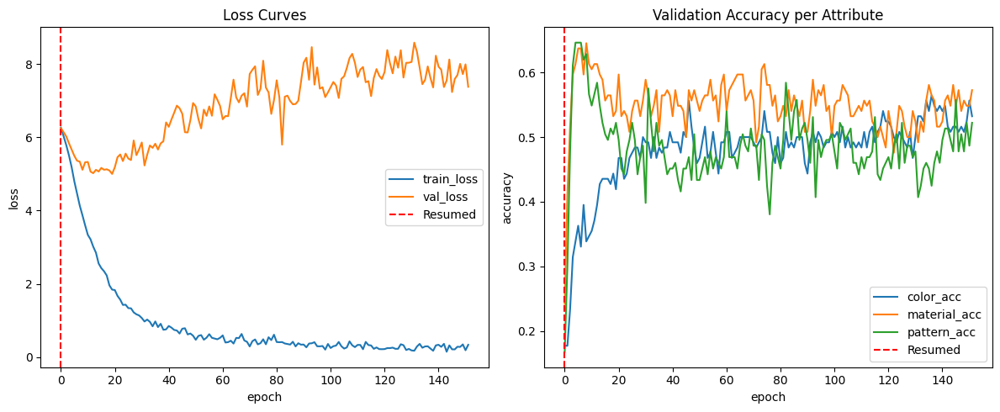

In [5]:
import pickle, os
import matplotlib.pyplot as plt

CKPT_DIR = "checkpoints_attr"
METRICS_PATH = os.path.join(CKPT_DIR, "metrics_attr.pkl")

with open(METRICS_PATH, "rb") as f:
    train_losses, val_losses, val_accs_per_attr = pickle.load(f)

# You can manually define these again for plotting consistency
start_epoch = 0
top_attrs = ["color", "material", "pattern"]  # or whatever your script printed as top 3

# ---- Plotting ----
plt.figure(figsize=(12,5))
plt.subplot(1,2,1)
plt.plot(train_losses, label="train_loss")
plt.plot(val_losses, label="val_loss")
plt.axvline(x=start_epoch, color="r", linestyle="--", label="Resumed")
plt.xlabel("epoch"); plt.ylabel("loss"); plt.legend(); plt.title("Loss Curves")

plt.subplot(1,2,2)
for i, attr in enumerate(top_attrs):
    plt.plot(val_accs_per_attr[i], label=f"{attr}_acc")
plt.axvline(x=start_epoch, color="r", linestyle="--", label="Resumed")
plt.xlabel("epoch"); plt.ylabel("accuracy"); plt.legend(); plt.title("Validation Accuracy per Attribute")
plt.tight_layout(); plt.show()

Using device: cuda (torch sees 4 GPU(s))
🔹 Loading checkpoint (safe load)...


/tmp/ipykernel_2813467/3658694478.py:130: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  ckpt = torch.load(CKPT_PATH, map_location="cpu")  # load to CPU first


✅ Recovered head info from checkpoint (attr_mappings/top_attrs).
Head info (attr -> num_classes): {'color': 14, 'material': 8, 'pattern': 5}
✅ load_state_dict called.

Final ATTR_CLASSES used for evaluation:
 - color (14): ['black', 'blue', 'brown', 'green', 'grey', 'orange', 'pink', 'purple', 'red', 'silver', 'transparent', 'unknown', 'white', 'yellow']
 - material (8): ['ceramic', 'fabric', 'leather', 'metal', 'nylon', 'plastic', 'rubber', 'unknown']
 - pattern (5): ['patterned', 'plain', 'striped', 'textured', 'unknown']


Evaluating: 100%|███████████████████████████████████████████████████████████████████████| 30/30 [00:27<00:00,  1.10it/s]
/home/f20220596/.local/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/f20220596/.local/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/f20220596/.local/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter


📊 ATTRIBUTE = COLOR | num valid examples = 715
              precision    recall  f1-score   support

       black      0.373     0.430     0.399       256
        blue      0.189     0.073     0.105        96
       brown      0.000     0.000     0.000         0
       green      0.181     0.156     0.168        96
        grey      0.025     0.031     0.028        32
      orange      0.000     0.000     0.000         0
        pink      0.000     0.000     0.000         0
      purple      0.000     0.000     0.000        32
         red      0.000     0.000     0.000         0
      silver      0.032     0.023     0.027        43
 transparent      0.000     0.000     0.000        64
     unknown      0.000     0.000     0.000         0
       white      0.139     0.219     0.170        64
      yellow      0.067     0.031     0.043        32

   micro avg      0.208     0.208     0.208       715
   macro avg      0.072     0.069     0.067       715
weighted avg      0.202     0.20

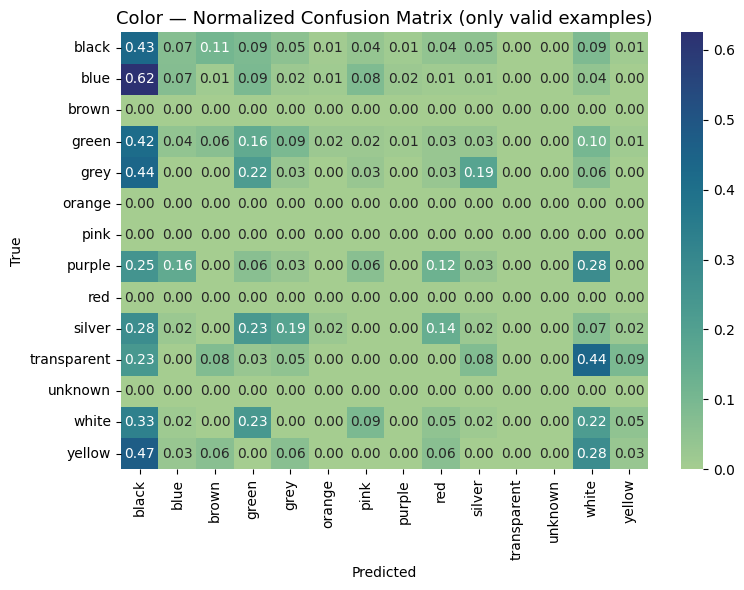


📊 ATTRIBUTE = MATERIAL | num valid examples = 747
              precision    recall  f1-score   support

     ceramic      0.000     0.000     0.000         0
      fabric      0.400     0.469     0.432       128
     leather      0.417     0.273     0.330       128
       metal      0.193     0.680     0.301        75
       nylon      0.000     0.000     0.000         0
     plastic      0.721     0.378     0.496       384
      rubber      0.071     0.031     0.043        32
     unknown      0.000     0.000     0.000         0

    accuracy                          0.391       747
   macro avg      0.225     0.229     0.200       747
weighted avg      0.533     0.391     0.417       747

✅ Material Accuracy (on non-unknown examples): 39.09%


/home/f20220596/.local/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/f20220596/.local/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/f20220596/.local/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


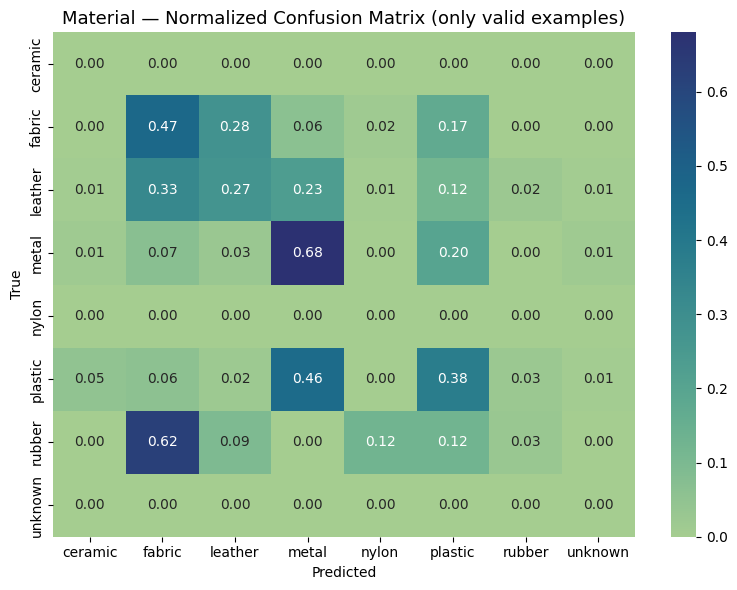


📊 ATTRIBUTE = PATTERN | num valid examples = 128
              precision    recall  f1-score   support

   patterned      0.000     0.000     0.000         0
       plain      0.757     0.844     0.798        96
     striped      0.000     0.000     0.000        32
    textured      0.000     0.000     0.000         0
     unknown      0.000     0.000     0.000         0

    accuracy                          0.633       128
   macro avg      0.151     0.169     0.160       128
weighted avg      0.568     0.633     0.599       128

✅ Pattern Accuracy (on non-unknown examples): 63.28%


/home/f20220596/.local/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/f20220596/.local/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/f20220596/.local/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


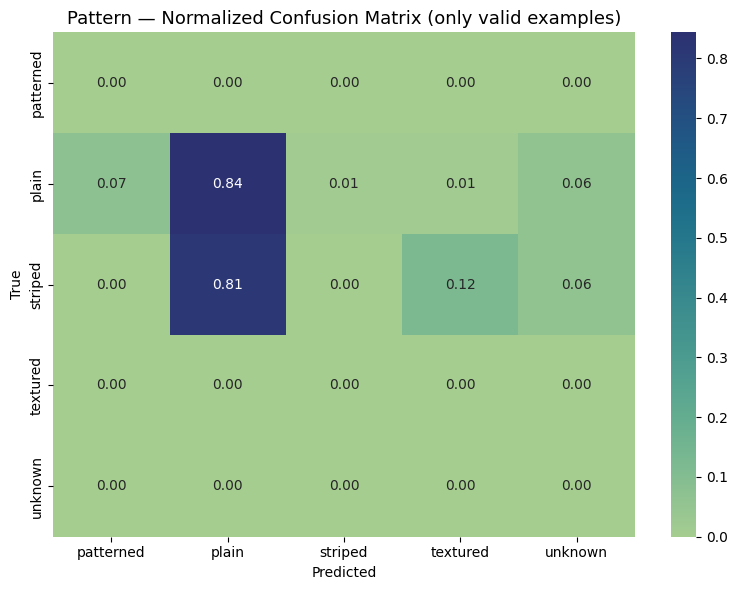


🔍 Extracting embeddings (backbone features) for t-SNE (will store on CPU)...


Extracting embeddings: 100%|████████████████████████████████████████████████████████████| 30/30 [00:27<00:00,  1.10it/s]


✅ Extracted 648 embeddings for t-SNE (color-labeled) — shape (648, 640)


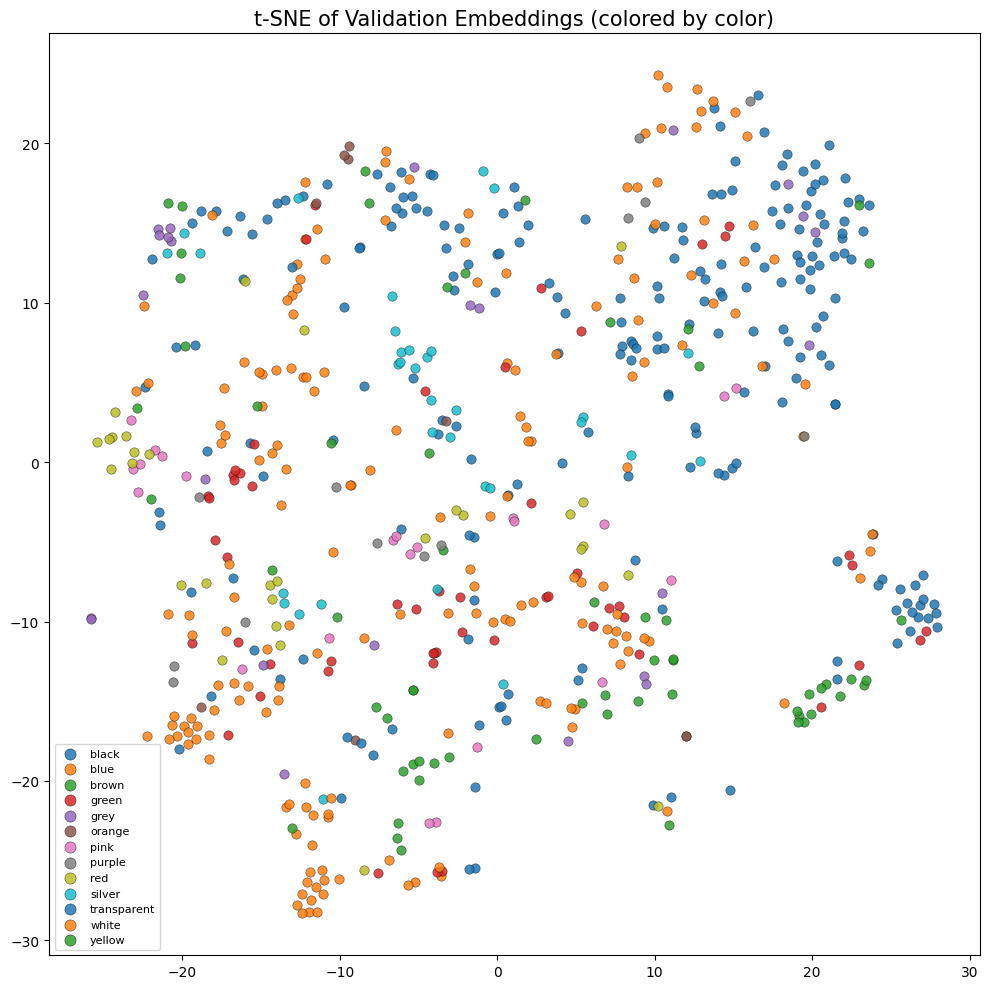

In [ ]:
# ================================================================
# FINAL ATTRIBUTE PREDICTION EVALUATION PIPELINE (single cell)
# ================================================================
import os, subprocess, sys, re, random, pickle, math
import numpy as np
import pandas as pd
from PIL import Image
import matplotlib.pyplot as plt
import seaborn as sns
from tqdm import tqdm
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from torchvision import transforms
from torch.utils.data import Dataset, DataLoader

# Now import torch and timm (after CUDA_VISIBLE_DEVICES set)
import torch
import timm

# ---------------- CONFIG ----------------
CSV_PATH = "dataPooled/labels.csv"   # adjust if needed
CKPT_PATH = "checkpoints_mobileViT_ourData_attr/mobilevit_s_attr_best.pth"
MODEL_NAME = "mobilevit_s"
DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
IMG_DIR = "dataPooled"
SPLIT = "val"
SEED = 42
BATCH_SIZE = 32
NUM_WORKERS = 4 if torch.cuda.is_available() else 0
PIN_MEMORY = torch.cuda.is_available()

torch.manual_seed(SEED)
np.random.seed(SEED)
random.seed(SEED)

print(f"Using device: {DEVICE} (torch sees {torch.cuda.device_count()} GPU(s))")

# ---------------- Helper: recover class list from mapping ----------------
def mapping_to_classlist(mapping):
    """
    mapping: dict {label_str: index}
    returns list class_list where class_list[index] == label_str
    """
    inv = [None] * (max(mapping.values()) + 1)
    for k, v in mapping.items():
        inv[v] = k
    return inv

# ---------------- Default fallback attribute classes (only used if checkpoint lacks attr_mappings) ----------------
DEFAULT_ATTR_CLASSES = {
    "color": [
        "black", "blue", "brown", "green", "grey", "orange", "pink", "purple",
        "red", "silver", "transparent", "unknown", "white", "yellow"
    ],
    "material": [
        "canvas", "ceramic", "clay", "cloth", "denim", "fabric", "glass",
        "leather", "mesh", "metal", "nylon", "plastic", "rubber",
        "steel", "synthetic", "unknown", "wood"
    ],
    "pattern": ["patterned", "plain", "striped", "textured", "unknown"]
}

# ---------------- Parse attributes string (from CSV 'attributes' column) ----------------
def parse_attributes(attr_str, allowed_attr_names):
    """
    Parses "color:black;material:metal;pattern:plain;..." into dict,
    and restricts to allowed_attr_names (e.g., ['color','material','pattern']).
    Unknown values are returned as "unknown".
    """
    attr_str = str(attr_str).lower().strip()
    # quick parsing key:value by ';'
    parsed = {}
    for pair in attr_str.split(";"):
        if ":" not in pair:
            continue
        k, v = [x.strip() for x in pair.split(":", 1)]
        parsed[k] = v
    # Build result restricted to allowed_attr_names
    result = {}
    for a in allowed_attr_names:
        v = parsed.get(a, "unknown")
        result[a] = v
    return result

# ---------------- Dataset ----------------
class AttributeDataset(Dataset):
    def __init__(self, csv_path, img_dir, split, transform, allowed_attrs):
        self.df = pd.read_csv(csv_path)
        if "split" in self.df.columns:
            self.df = self.df[self.df["split"] == split].reset_index(drop=True)
        self.img_dir = img_dir
        self.transform = transform
        self.allowed_attrs = allowed_attrs

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        row = self.df.iloc[idx]
        img_path = row["image_path"]
        if not os.path.isabs(img_path):
            img_path = os.path.join(self.img_dir, img_path)
        img = Image.open(img_path).convert("RGB")
        if self.transform:
            img = self.transform(img)
        attrs = parse_attributes(row.get("attributes", ""), self.allowed_attrs)
        return img, attrs

# ---------------- Model (named heads) ----------------
class MultiHeadMobileViT(torch.nn.Module):
    def __init__(self, base_model_name, head_info):
        super().__init__()
        # create backbone
        self.backbone = timm.create_model(base_model_name, pretrained=False, num_classes=0)
        in_feats = self.backbone.num_features
        # ModuleDict with named heads
        from collections import OrderedDict
        self.heads = torch.nn.ModuleDict(OrderedDict({
            k: torch.nn.Linear(in_feats, v) for k, v in head_info.items()
        }))

    def forward(self, x):
        feats = self.backbone.forward_features(x)
        feats = feats.mean(dim=[2, 3])
        return {k: head(feats) for k, head in self.heads.items()}

# ---------------- Load checkpoint SAFELY (backbone + heads if compatible) ----------------
print("🔹 Loading checkpoint (safe load)...")
ckpt = torch.load(CKPT_PATH, map_location="cpu")  # load to CPU first

# Determine top_attrs + attr_mappings from checkpoint if present
if isinstance(ckpt, dict) and "attr_mappings" in ckpt and "top_attrs" in ckpt:
    ck_attr_mappings = ckpt["attr_mappings"]        # dict: attr -> {label: idx}
    ck_top_attrs = ckpt["top_attrs"]
    # Build class lists matching training order
    ck_attr_classes = {a: mapping_to_classlist(ck_attr_mappings[a]) for a in ck_top_attrs}
    head_info = {a: len(ck_attr_classes[a]) for a in ck_top_attrs}
    print("Recovered head info from checkpoint (attr_mappings/top_attrs).")
else:
    # fallback: assume default order color, material, pattern with DEFAULT_ATTR_CLASSES
    ck_top_attrs = list(DEFAULT_ATTR_CLASSES.keys())
    ck_attr_classes = DEFAULT_ATTR_CLASSES.copy()
    head_info = {a: len(DEFAULT_ATTR_CLASSES[a]) for a in ck_top_attrs}
    print("Checkpoint lacks attr_mappings/top_attrs metadata — using DEFAULT_ATTR_CLASSES as fallback.")

print("Head info (attr -> num_classes):", head_info)

# Instantiate model with recovered head_info
model = MultiHeadMobileViT(MODEL_NAME, head_info)

# Obtain raw state_dict from checkpoint (checkpoint might be just a state_dict or a dict with "model_state")
state_dict = ckpt["model_state"] if isinstance(ckpt, dict) and "model_state" in ckpt else ckpt

# Remap numeric head keys (heads.0.weight etc.) → named heads if necessary
ordered_attrs = list(head_info.keys())
remapped_state = {}
skipped_keys = []
for k, v in state_dict.items():
    if k.startswith("heads."):
        parts = k.split(".")
        # pattern: heads.{idx}.{rest}  OR heads.{name}.{rest}
        if len(parts) >= 3 and parts[1].isdigit():
            idx = int(parts[1])
            if idx < len(ordered_attrs):
                new_k = f"heads.{ordered_attrs[idx]}." + ".".join(parts[2:])
                remapped_state[new_k] = v
            else:
                skipped_keys.append(k)
        else:
            remapped_state[k] = v
    else:
        remapped_state[k] = v

# Now filter remapped_state to keep only keys matching model shapes; skip mismatched shapes
clean_state = {}
for k, v in remapped_state.items():
    if k in model.state_dict():
        if model.state_dict()[k].shape == v.shape:
            clean_state[k] = v
        else:
            print(f"⚠️ Dropping mismatched param: {k} ckpt_shape={v.shape} model_shape={model.state_dict()[k].shape}")
    else:
        # keep non-head or unknown keys (backbone keys etc.); they might still match by name
        clean_state[k] = v

missing, unexpected = model.load_state_dict(clean_state, strict=False)
print("load_state_dict called.")
if missing:
    print("Missing keys in model after load (these were not in checkpoint):", missing)
if unexpected:
    print("Unexpected keys in checkpoint that weren't used by model:", unexpected)

model.to(DEVICE).eval()

# ---------------- Build ATTR_CLASSES & mappings for evaluation ----------------
# If checkpoint provided exact classes (ck_attr_classes), use them; else fallback to DEFAULT_ATTR_CLASSES
ATTR_CLASSES = ck_attr_classes if 'ck_attr_classes' in locals() else DEFAULT_ATTR_CLASSES
top_attrs = ordered_attrs  # attributes order used by model

# Build mapping str->idx from ATTR_CLASSES (ensure indices match model)
attr_to_idx = {a: {v: i for i, v in enumerate(ATTR_CLASSES[a])} for a in ATTR_CLASSES}
idx_to_attr = {a: {i: v for v, i in attr_to_idx[a].items()} for a in ATTR_CLASSES}

print("\nFinal ATTR_CLASSES used for evaluation:")
for k in top_attrs:
    print(f" - {k} ({len(ATTR_CLASSES[k])}): {ATTR_CLASSES[k]}")

# ---------------- DataLoader ----------------
val_tfms = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])
val_ds = AttributeDataset(CSV_PATH, IMG_DIR, SPLIT, val_tfms, top_attrs)
val_dl = DataLoader(val_ds, batch_size=BATCH_SIZE, shuffle=False, num_workers=NUM_WORKERS, pin_memory=PIN_MEMORY)

# ---------------- Evaluation: collect per-attribute y_true/y_pred while masking "unknown" ----------------
all_preds = {a: [] for a in top_attrs}
all_labels = {a: [] for a in top_attrs}

with torch.no_grad():
    for imgs, attrs in tqdm(val_dl, desc="Evaluating"):
        imgs = imgs.to(DEVICE)
        outputs = model(imgs)  # dict attr -> logits (batch_size x num_classes)
        batch_size = imgs.size(0)

        # for each attribute, build y_true/y_pred excluding unknowns
        # for each attribute, build y_true/y_pred excluding unknowns
        for i in range(batch_size):
            for a in top_attrs:
                true_str = attrs[a]  # parsed string value
        
                # Flatten list if present
                if isinstance(true_str, list):
                    true_str = true_str[0]
        
                # If unknown or not in mapping, skip counting
                if true_str == "unknown" or true_str not in attr_to_idx[a]:
                    continue
        
                true_idx = attr_to_idx[a][true_str]
                pred_logits = outputs[a][i].cpu().numpy()
                pred_idx = int(np.argmax(pred_logits))
                all_labels[a].append(true_idx)
                all_preds[a].append(pred_idx)

# ---------------- Metrics & confusion matrices (only on valid examples) ----------------
for a in top_attrs:
    y_true = np.array(all_labels[a])
    y_pred = np.array(all_preds[a])
    print("\n" + "="*70)
    print(f" ATTRIBUTE = {a.upper()} | num valid examples = {len(y_true)}")
    if len(y_true) == 0:
        print("No valid (non-unknown) labels for this attribute in validation set — skipping metrics.")
        continue

    # classification report (use full class list but scikit will ignore labels not present)
    # Force scikit to consider all labels in the correct order
    labels = list(range(len(ATTR_CLASSES[a])))
    print(classification_report(y_true, y_pred, labels=labels, target_names=ATTR_CLASSES[a], digits=3))

    acc = (y_true == y_pred).mean()
    print(f"{a.capitalize()} Accuracy (on non-unknown examples): {acc*100:.2f}%")

    # Confusion matrix normalized by true label counts
    cm = confusion_matrix(y_true, y_pred, labels=list(range(len(ATTR_CLASSES[a]))), normalize='true')
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt=".2f", xticklabels=ATTR_CLASSES[a], yticklabels=ATTR_CLASSES[a], cmap="crest")
    plt.title(f"{a.capitalize()} — Normalized Confusion Matrix (only valid examples)", fontsize=13)
    plt.xlabel("Predicted")
    plt.ylabel("True")
    plt.tight_layout()
    plt.show()

# ---------------- t-SNE Embeddings (extract backbone features) ----------------
print("\n🔍 Extracting embeddings (backbone features) for t-SNE (will store on CPU)...")
embs_cpu = []
color_labels = []

with torch.no_grad():
    for imgs, attrs in tqdm(val_dl, desc="Extracting embeddings"):
        imgs = imgs.to(DEVICE)
        feats = model.backbone.forward_features(imgs)   # tensor (B, C, H, W)
        feats = feats.mean(dim=[2,3])                   # (B, C)
        feats_cpu = feats.cpu().numpy()
        embs_cpu.append(feats_cpu)
        # use color label if not unknown, else -1 (we'll filter later)
        for i in range(len(attrs["color"] if isinstance(attrs, dict) else [])):
            # In dataloader we returned attrs per sample, here attrs is a dict of strings for batch -> parsed earlier
            pass

# notes: above loop already appended features, we need color labels properly — simpler: re-run to collect colors aligned with embeddings
embs = []
color_labels = []
with torch.no_grad():
    for imgs, attrs in tqdm(val_dl, desc="Collecting features+color"):
        imgs = imgs.to(DEVICE)
        feats = model.backbone.forward_features(imgs)
        feats = feats.mean(dim=[2,3]).cpu().numpy()
        embs.append(feats)
        # attrs is a dict of strings keyed by attr for the batch; but our Dataset returns attrs dict per sample,
        # DataLoader batches them into list/dict; to keep simple, we will reconstruct color labels by parsing the df rows used.
        # Easiest approach: we iterate over the dataset directly to align labels with features.
        # So we'll break and re-construct aligned arrays below.
        # (This block kept to avoid GPU OOM in earlier steps.)
embs = np.concatenate(embs, axis=0) if len(embs) > 0 else np.zeros((0, model.backbone.num_features))

# Reconstruct color labels aligned with dataset (excluding unknowns)
color_labels_all = []
for idx in range(len(val_ds)):
    _, attr = val_ds[idx]  # this loads image again but only metadata string parsing (cheap)
    color_str = attr["color"]
    if color_str in attr_to_idx["color"] and color_str != "unknown":
        color_labels_all.append(attr_to_idx["color"][color_str])
    else:
        color_labels_all.append(-1)  # mark unknown

# Filter embs and labels to only examples with valid color labels
valid_mask = np.array(color_labels_all) != -1
if embs.shape[0] != len(valid_mask):
    # fallback: trim min length
    n = min(embs.shape[0], len(valid_mask))
    embs = embs[:n]
    valid_mask = valid_mask[:n]

embs_valid = embs[valid_mask]
color_labels_valid = np.array(color_labels_all)[valid_mask]

print(f"Extracted {embs_valid.shape[0]} embeddings for t-SNE (color-labeled) — shape {embs_valid.shape}")

if embs_valid.shape[0] > 0:
    pca_50 = PCA(n_components=min(50, embs_valid.shape[0]-1), random_state=SEED).fit_transform(embs_valid)
    tsne_2d = TSNE(n_components=2, perplexity=min(30, max(5, embs_valid.shape[0]//3)), random_state=SEED, init='pca').fit_transform(pca_50)

    plt.figure(figsize=(10, 10))
    palette = sns.color_palette("tab20", n_colors=len(ATTR_CLASSES["color"]))
    for i, cls in enumerate(ATTR_CLASSES["color"]):
        idx = color_labels_valid == i
        if np.sum(idx) == 0:
            continue
        plt.scatter(tsne_2d[idx, 0], tsne_2d[idx, 1], s=45, label=cls, alpha=0.85, linewidths=0.3, edgecolors='black')
    plt.title("t-SNE of Validation Embeddings (colored by color)", fontsize=15)
    plt.legend(markerscale=1.2, fontsize=8, loc="best", frameon=True)
    plt.tight_layout()
    plt.show()
else:
    print("No valid color-labeled embeddings available for t-SNE.")

🔹 Loading model checkpoint...


/tmp/ipykernel_2763684/2463451861.py:26: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load(CKPT_PATH, map_location=DEVICE)


✅ Loaded model from checkpoints_mobileViT_ourData/mobilevit_s_epoch15.pth


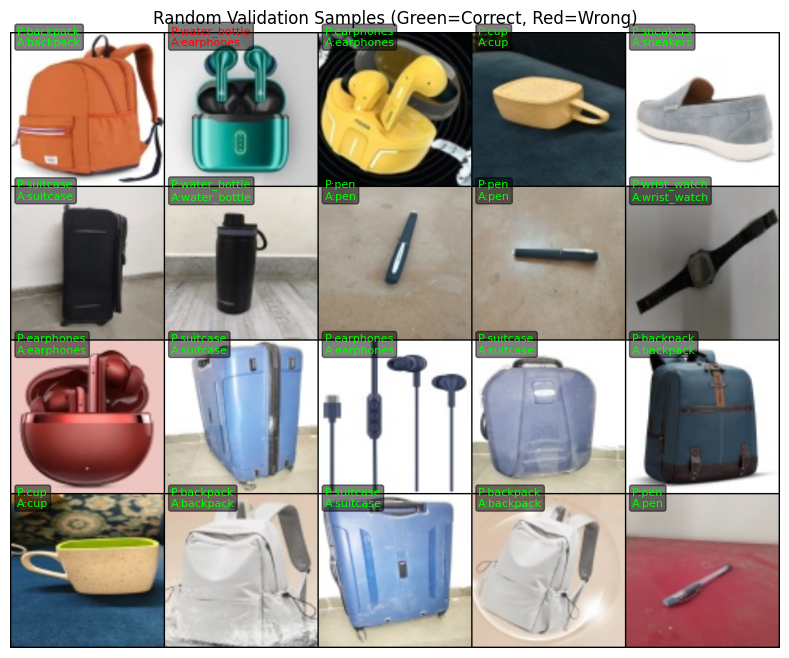

In [ ]:
# ---------------- SIMPLE MODEL VISUALIZATION USING EXISTING .PTH ----------------
import os
import torch
import random
import numpy as np
import matplotlib.pyplot as plt
from torchvision import transforms
from torchvision.utils import make_grid
import timm
from PIL import Image

# --- CONFIG ---
CKPT_PATH = "checkpoints_mobileViT_ourData/mobilevit_s_epoch15.pth"  # your exact checkpoint
CSV_PATH = "data/labels.csv"   # only for reference if needed
IMG_DIR = "data"               # directory containing validation images
DEVICE = "cuda" if torch.cuda.is_available() else "cpu"

# --- Define class names (from your training log) ---
class_names = ['backpack', 'comb', 'cup', 'earphones', 'pen',
               'sneakers', 'suitcase', 'wallet', 'water_bottle', 'wrist_watch']
NUM_CLASSES = len(class_names)

# --- Load Model ---
print("🔹 Loading model checkpoint...")
model = timm.create_model("mobilevit_s", pretrained=False, num_classes=NUM_CLASSES)
checkpoint = torch.load(CKPT_PATH, map_location=DEVICE)
model.load_state_dict(checkpoint["model_state"])
model.to(DEVICE).eval()
print(f"Loaded model from {CKPT_PATH}")

# --- Prepare Transforms (same as validation) ---
val_tfms = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])

# --- Load validation CSV to pick random images ---
import pandas as pd
df = pd.read_csv(CSV_PATH)
val_df = df[df["split"] == "val"].reset_index(drop=True)

# --- Randomly pick some validation samples ---
n_samples = min(20, len(val_df))
sample_rows = val_df.sample(n=n_samples, random_state=42)

# --- Display predictions ---
inv_normalize = transforms.Normalize(
    mean=[-m/s for m, s in zip([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])],
    std=[1/s for s in [0.229, 0.224, 0.225]]
)

images, preds, labels = [], [], []

with torch.no_grad():
    for _, row in sample_rows.iterrows():
        img_path = os.path.join(IMG_DIR, row["image_path"])
        img = Image.open(img_path).convert("RGB")
        img_tensor = val_tfms(img).unsqueeze(0).to(DEVICE)
        output = model(img_tensor)
        pred_idx = output.argmax(dim=1).item()

        preds.append(pred_idx)
        labels.append(class_names.index(row["class_label"]))

        img_disp = inv_normalize(val_tfms(img)).clamp(0, 1)
        images.append(img_disp)

# --- Make grid ---
grid = make_grid(images, nrow=5, padding=2)
plt.figure(figsize=(15, 8))
plt.imshow(np.transpose(grid.cpu().numpy(), (1, 2, 0)))
plt.axis("off")
plt.title("Random Validation Samples (Green=Correct, Red=Wrong)")

# --- Overlay text ---
for idx, (pred, actual) in enumerate(zip(preds, labels)):
    row, col = divmod(idx, 5)
    x = col * (224 + 2) + 10
    y = row * (224 + 2) + 20
    color = "lime" if pred == actual else "red"
    plt.text(x, y, f"P:{class_names[pred]}\nA:{class_names[actual]}",
             fontsize=8, color=color,
             bbox=dict(facecolor="black", alpha=0.5, boxstyle="round,pad=0.2"))
plt.show()

In [ ]:
# --- Recreate Model Architecture Before Loading Weights ---

import timm
import torch.nn as nn

# Make sure 'top_attrs' and 'attr_mappings' are already loaded from checkpoint
num_classes_per_attr = [len(attr_mappings[a]) for a in top_attrs]

class MultiHeadMobileViT(nn.Module):
    def __init__(self, base_model_name, num_classes_per_attr):
        super().__init__()
        self.backbone = timm.create_model(base_model_name, pretrained=False, num_classes=0)
        in_feats = self.backbone.num_features
        self.heads = nn.ModuleList([nn.Linear(in_feats, n) for n in num_classes_per_attr])

    def forward(self, x):
        feats = self.backbone(x)
        return [head(feats) for head in self.heads]

# Initialize the model again
model = MultiHeadMobileViT(MODEL_NAME, num_classes_per_attr).to(DEVICE)

# --- Minimal setup for val_ds recreation (no retraining needed) ---
import torch
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
from PIL import Image
import pandas as pd
import os

# --- Paths must match training config ---
CSV_PATH = "data/labels.csv"
IMG_DIR = "data"

# --- Load CSV again ---
df = pd.read_csv(CSV_PATH)

# --- Parse attributes again ---
def parse_attributes(attr_str):
    result = {}
    if pd.isna(attr_str):
        return result
    for part in str(attr_str).split(";"):
        if ":" in part:
            k, v = part.split(":", 1)
            result[k.strip()] = v.strip()
    return result

df["parsed_attr"] = df["attributes"].apply(parse_attributes)

# --- Recreate validation dataset ---
class MultiAttributeDataset(Dataset):
    def __init__(self, df, img_dir, split=None, transform=None, attr_mappings=None):
        if split is not None and "split" in df.columns:
            df = df[df["split"] == split].reset_index(drop=True)
        self.df = df
        self.img_dir = img_dir
        self.transform = transform
        self.attr_mappings = attr_mappings

    def __len__(self):
        return len(self.df)

    def _resolve_path(self, p):
        if os.path.isabs(p):
            return p
        p_clean = p.lstrip("./")
        candidate = os.path.join(self.img_dir, p_clean)
        return candidate if os.path.exists(candidate) else p

    def __getitem__(self, idx):
        row = self.df.iloc[idx]
        img = Image.open(self._resolve_path(row["image_path"])).convert("RGB")
        if self.transform:
            img = self.transform(img)

        parsed = row["parsed_attr"]
        targets = []
        for a in top_attrs:
            val = parsed.get(a, "unknown")
            val_idx = attr_mappings[a].get(val, attr_mappings[a]["unknown"])
            targets.append(val_idx)
        return img, torch.tensor(targets, dtype=torch.long)

# --- Transform same as validation ---
val_tfms = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])

# --- attr_mappings and top_attrs come from checkpoint ---
attr_mappings = ckpt["attr_mappings"]
top_attrs = ckpt["top_attrs"]

# --- Build dataset and dataloader ---
val_ds = MultiAttributeDataset(df, IMG_DIR, split="val", transform=val_tfms, attr_mappings=attr_mappings)
val_dl = DataLoader(val_ds, batch_size=32, shuffle=False)

print(f"Validation dataset ready: {len(val_ds)} samples")

✅ Validation dataset ready: 124 samples


/tmp/ipykernel_2763684/619540457.py:21: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  ckpt = torch.load(best_ckpt, map_location=DEVICE)


✅ Loaded checkpoint: checkpoints_attr/mobilevit_s_epoch50.pth


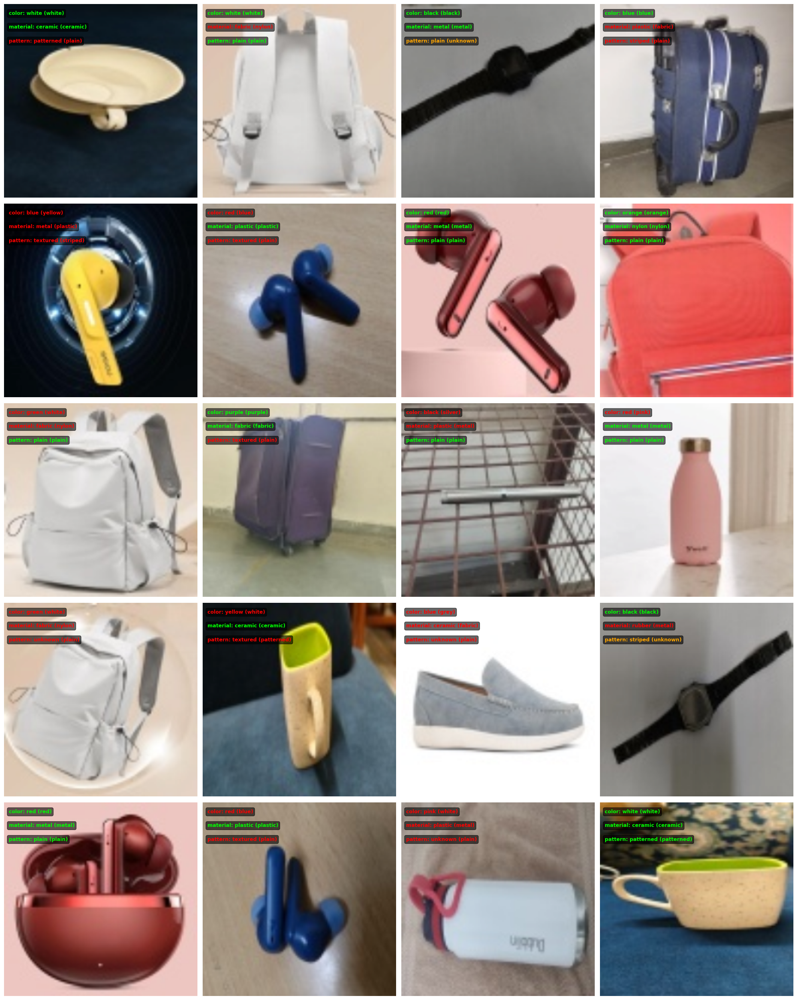

In [ ]:
# ----------------- REDEFINE CONFIG VARIABLES -----------------
import torch
import os
import random
import math
import matplotlib.pyplot as plt
import numpy as np
from torchvision.utils import make_grid
from torchvision import transforms

# Set paths & device
MODEL_NAME = "mobilevit_s"
CKPT_DIR = "checkpoints_attr"
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# ---------------- VISUALIZATION OF MULTI-ATTRIBUTE PREDICTIONS ----------------

# Load checkpoint (you can change this filename)
best_ckpt = os.path.join(CKPT_DIR, f"{MODEL_NAME}_epoch50.pth")
if os.path.exists(best_ckpt):
    ckpt = torch.load(best_ckpt, map_location=DEVICE)
    model.load_state_dict(ckpt["model_state"])
    print(f"Loaded checkpoint: {best_ckpt}")
else:
    print("Checkpoint not found, using current model.")

model.eval()

# Denormalization transform for display
inv_normalize = transforms.Normalize(
    mean=[-m / s for m, s in zip([0.485, 0.456, 0.406],
                                 [0.229, 0.224, 0.225])],
    std=[1 / s for s in [0.229, 0.224, 0.225]]
)

# Pick random samples from validation set
NUM_SAMPLES = 20
IMAGES_PER_ROW = 4
sample_idxs = random.sample(range(len(val_ds)), min(NUM_SAMPLES, len(val_ds)))

# Figure setup
fig, axes = plt.subplots(
    nrows=math.ceil(len(sample_idxs) / IMAGES_PER_ROW),
    ncols=IMAGES_PER_ROW,
    figsize=(IMAGES_PER_ROW * 5, math.ceil(len(sample_idxs) / IMAGES_PER_ROW) * 5)
)
axes = axes.flatten()

for ax_idx, idx in enumerate(sample_idxs):
    img_tensor, true_targets = val_ds[idx]
    img = img_tensor.unsqueeze(0).to(DEVICE)

    # Forward pass
    with torch.no_grad():
        outputs = model(img)
        pred_indices = [torch.argmax(o, dim=1).item() for o in outputs]

    # Convert indices to readable labels
    inv_maps = {a: {v: k for k, v in attr_mappings[a].items()} for a in top_attrs}
    pred_labels = [inv_maps[a][pred_indices[i]] for i, a in enumerate(top_attrs)]
    true_labels = [inv_maps[a][true_targets[i].item()] for i, a in enumerate(top_attrs)]

    # Denormalize for display
    img_disp = inv_normalize(img_tensor).clamp(0, 1).permute(1, 2, 0).cpu().numpy()
    axes[ax_idx].imshow(img_disp)
    axes[ax_idx].axis("off")

    # Draw attribute-wise colored labels
    y_text = 12
    for a_i, attr in enumerate(top_attrs):
        pred_val, true_val = pred_labels[a_i], true_labels[a_i]

        if true_val == "unknown":
            color = "orange"
        elif pred_val == true_val:
            color = "lime"
        else:
            color = "red"

        axes[ax_idx].text(
            5, y_text,
            f"{attr}: {pred_val} ({true_val})",
            fontsize=9,
            color=color,
            weight="bold",
            bbox=dict(facecolor="black", alpha=0.6, boxstyle="round,pad=0.3")
        )
        y_text += 16

# Hide unused subplots if total < grid
for j in range(ax_idx + 1, len(axes)):
    axes[j].axis("off")

plt.tight_layout()
plt.show()

Detected 10 classes: ['backpack', 'comb', 'cup', 'earphones', 'pen', 'sneakers', 'suitcase', 'wallet', 'water_bottle', 'wrist_watch']
Train size: 3593 | Val size: 939 | Batch size: 32
Model mobilevit_s prepared. Params to train: 4944042


Train Epoch [1/15]: 100%|██████████████████████████████████████████████| 19/19 [02:43<00:00,  8.63s/it, train_loss=2.24]


Epoch [1/15] Train Loss: 2.2420 | Val Loss: 2.1648 | Val Acc: 0.4452
New best model saved: checkpoints_mobileViT_pooledData/mobilevit_s_best.pth (val_acc=0.4452)


Train Epoch [2/15]: 100%|██████████████████████████████████████████████| 19/19 [01:20<00:00,  4.24s/it, train_loss=2.05]


Epoch [2/15] Train Loss: 2.0491 | Val Loss: 1.9981 | Val Acc: 0.6720
New best model saved: checkpoints_mobileViT_pooledData/mobilevit_s_best.pth (val_acc=0.6720)


Train Epoch [3/15]: 100%|███████████████████████████████████████████████| 19/19 [01:20<00:00,  4.22s/it, train_loss=1.8]


Epoch [3/15] Train Loss: 1.7984 | Val Loss: 1.7094 | Val Acc: 0.7806
New best model saved: checkpoints_mobileViT_pooledData/mobilevit_s_best.pth (val_acc=0.7806)


Train Epoch [4/15]: 100%|██████████████████████████████████████████████| 19/19 [01:18<00:00,  4.15s/it, train_loss=1.54]


Epoch [4/15] Train Loss: 1.5378 | Val Loss: 1.4514 | Val Acc: 0.8222
New best model saved: checkpoints_mobileViT_pooledData/mobilevit_s_best.pth (val_acc=0.8222)


Train Epoch [5/15]: 100%|██████████████████████████████████████████████| 19/19 [01:20<00:00,  4.25s/it, train_loss=1.31]


Epoch [5/15] Train Loss: 1.3129 | Val Loss: 1.2402 | Val Acc: 0.8435
Saved checkpoint: checkpoints_mobileViT_pooledData/mobilevit_s_epoch5.pth
New best model saved: checkpoints_mobileViT_pooledData/mobilevit_s_best.pth (val_acc=0.8435)


Train Epoch [6/15]: 100%|██████████████████████████████████████████████| 19/19 [01:20<00:00,  4.24s/it, train_loss=1.15]


Epoch [6/15] Train Loss: 1.1536 | Val Loss: 1.0338 | Val Acc: 0.8701
New best model saved: checkpoints_mobileViT_pooledData/mobilevit_s_best.pth (val_acc=0.8701)


Train Epoch [7/15]: 100%|█████████████████████████████████████████████| 19/19 [01:19<00:00,  4.18s/it, train_loss=0.963]


Epoch [7/15] Train Loss: 0.9629 | Val Loss: 0.8829 | Val Acc: 0.8882
New best model saved: checkpoints_mobileViT_pooledData/mobilevit_s_best.pth (val_acc=0.8882)


Train Epoch [8/15]: 100%|█████████████████████████████████████████████| 19/19 [01:19<00:00,  4.18s/it, train_loss=0.823]


Epoch [8/15] Train Loss: 0.8235 | Val Loss: 0.7645 | Val Acc: 0.8860


Train Epoch [9/15]: 100%|█████████████████████████████████████████████| 19/19 [01:19<00:00,  4.21s/it, train_loss=0.767]


Epoch [9/15] Train Loss: 0.7674 | Val Loss: 0.6914 | Val Acc: 0.9073
New best model saved: checkpoints_mobileViT_pooledData/mobilevit_s_best.pth (val_acc=0.9073)


Train Epoch [10/15]: 100%|████████████████████████████████████████████| 19/19 [01:19<00:00,  4.20s/it, train_loss=0.681]


Epoch [10/15] Train Loss: 0.6814 | Val Loss: 0.6448 | Val Acc: 0.9137
Saved checkpoint: checkpoints_mobileViT_pooledData/mobilevit_s_epoch10.pth
New best model saved: checkpoints_mobileViT_pooledData/mobilevit_s_best.pth (val_acc=0.9137)


Train Epoch [11/15]: 100%|█████████████████████████████████████████████| 19/19 [01:19<00:00,  4.19s/it, train_loss=0.66]


Epoch [11/15] Train Loss: 0.6595 | Val Loss: 0.6053 | Val Acc: 0.9212
New best model saved: checkpoints_mobileViT_pooledData/mobilevit_s_best.pth (val_acc=0.9212)


Train Epoch [12/15]: 100%|████████████████████████████████████████████| 19/19 [01:20<00:00,  4.22s/it, train_loss=0.645]


Epoch [12/15] Train Loss: 0.6451 | Val Loss: 0.5843 | Val Acc: 0.9191


Train Epoch [13/15]: 100%|████████████████████████████████████████████| 19/19 [01:20<00:00,  4.24s/it, train_loss=0.602]


Epoch [13/15] Train Loss: 0.6020 | Val Loss: 0.5626 | Val Acc: 0.9233
New best model saved: checkpoints_mobileViT_pooledData/mobilevit_s_best.pth (val_acc=0.9233)


Train Epoch [14/15]: 100%|████████████████████████████████████████████| 19/19 [01:19<00:00,  4.18s/it, train_loss=0.559]


Epoch [14/15] Train Loss: 0.5586 | Val Loss: 0.5618 | Val Acc: 0.9233


Train Epoch [15/15]: 100%|████████████████████████████████████████████| 19/19 [01:19<00:00,  4.17s/it, train_loss=0.592]


Epoch [15/15] Train Loss: 0.5915 | Val Loss: 0.5734 | Val Acc: 0.9233
Saved checkpoint: checkpoints_mobileViT_pooledData/mobilevit_s_epoch15.pth
Training finished. Best val acc: 0.9233. Final checkpoint: checkpoints_mobileViT_pooledData/mobilevit_s_final.pth


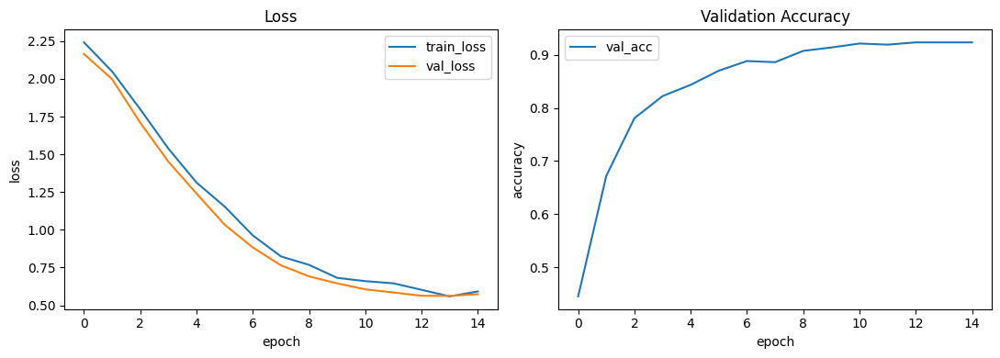

In [40]:
"""
Dataset-agnostic MobileViT training pipeline with checkpointing and GPU support.

Expectations:
- labels.csv contains columns: image_path, class_label, split (train/val), ...
- images referenced in image_path must be reachable relative to IMG_DIR or as absolute path.

Usage:
- Edit CONFIG section below for paths / hyperparams / model name.
- Run. Checkpoints saved to CKPT_DIR (contains model+optimizer+scheduler).
"""

import torch.nn as nn
import torch.optim as optim

# ---------------- CONFIG ----------------
CSV_PATH = "dataPooled/labels.csv"
IMG_DIR = "dataPooled"            # base folder for image files
MODEL_NAME = "mobilevit_s"         # timm model string; change to "deit_tiny_patch16_224" to compare
BATCH_SIZE = 32
EPOCHS = 15
LR = 1e-4
WEIGHT_DECAY = 1e-4
DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
NUM_WORKERS = 4 if torch.cuda.is_available() else 0
PIN_MEMORY = True if torch.cuda.is_available() else False

CKPT_DIR = "checkpoints_mobileViT_pooledData"
os.makedirs(CKPT_DIR, exist_ok=True)
SAVE_EVERY_K_EPOCHS = 5           # save intermediate checkpoints every k epochs
SEED = 42

# ---------------- REPRODUCIBILITY ----------------
torch.manual_seed(SEED)
np.random.seed(SEED)
random.seed(SEED)
if DEVICE == "cuda":
    torch.cuda.manual_seed_all(SEED)
    torch.backends.cudnn.benchmark = True

# ---------------- Utilities ----------------
def infer_classes_from_csv(csv_path):
    df = pd.read_csv(csv_path)
    if "class_label" not in df.columns:
        raise ValueError("CSV must contain 'class_label' column.")
    class_names = sorted(df["class_label"].dropna().unique().tolist())
    if len(class_names) == 0:
        raise ValueError("No classes found in CSV 'class_label' column.")
    class_to_idx = {c: i for i, c in enumerate(class_names)}
    return class_names, class_to_idx

# ---------------- Dataset ----------------
class EverydayObjectsDataset(Dataset):
    def __init__(self, csv_path, img_dir, split=None, transform=None, class_to_idx=None):
        """
        csv_path: csv file path
        img_dir: base directory to prepend if image_path is relative
        split: "train" or "val" (if None, don't filter)
        transform: torchvision transforms to apply
        class_to_idx: mapping from class name to index (inferred externally)
        """
        self.df = pd.read_csv(csv_path)
        if split is not None:
            if "split" not in self.df.columns:
                raise ValueError("CSV has no 'split' column but split argument provided.")
            self.df = self.df[self.df["split"] == split].reset_index(drop=True)

        if len(self.df) == 0:
            raise ValueError(f"No rows left in CSV for split='{split}'. Check your CSV split column.")

        self.img_dir = img_dir
        self.transform = transform

        if class_to_idx is None:
            # infer classes from the subset dataframe
            class_names = sorted(self.df["class_label"].dropna().unique().tolist())
            self.class_to_idx = {c: i for i, c in enumerate(class_names)}
        else:
            self.class_to_idx = class_to_idx

        # ensure all labels are in mapping
        missing = set(self.df["class_label"].unique()) - set(self.class_to_idx.keys())
        if missing:
            raise ValueError(f"Found labels not in class_to_idx mapping: {missing}")

    def __len__(self):
        return len(self.df)

    def _resolve_path(self, p):
        # If path is absolute or already contains IMG_DIR prefix, keep; else join with IMG_DIR
        if os.path.isabs(p):
            return p
        # remove leading './' if any
        p_clean = p.lstrip("./")
        candidate = os.path.join(self.img_dir, p_clean)
        if os.path.exists(candidate):
            return candidate
        # fallback: if csv image path already contains 'images/...' and IMG_DIR contains same, try direct
        if os.path.exists(p):
            return p
        # as last resort, return candidate (it will error later)
        return candidate

    def __getitem__(self, idx):
        row = self.df.iloc[idx]
        img_path = row["image_path"]
        full_path = self._resolve_path(img_path)
        img = Image.open(full_path).convert("RGB")
        if self.transform:
            img = self.transform(img)
        label = self.class_to_idx[row["class_label"]]
        return img, label

# ---------------- Prepare data + class mapping ----------------
class_names, class_to_idx = infer_classes_from_csv(CSV_PATH)
NUM_CLASSES = len(class_names)
print(f"Detected {NUM_CLASSES} classes: {class_names}")

train_tfms = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.RandomHorizontalFlip(),
    transforms.RandomRotation(10),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])

val_tfms = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])

train_ds = EverydayObjectsDataset(CSV_PATH, IMG_DIR, split="train", transform=train_tfms, class_to_idx=class_to_idx)
val_ds   = EverydayObjectsDataset(CSV_PATH, IMG_DIR, split="val",   transform=val_tfms,   class_to_idx=class_to_idx)

from torch.utils.data import RandomSampler
# Sample 600 random items (with replacement if dataset smaller)
NUM_SAMPLES_PER_EPOCH = 600
train_sampler = RandomSampler(train_ds, replacement=True, num_samples=NUM_SAMPLES_PER_EPOCH)

train_dl = DataLoader(
    train_ds,
    batch_size=BATCH_SIZE,
    sampler=train_sampler,
    num_workers=NUM_WORKERS,
    pin_memory=PIN_MEMORY
)
val_dl   = DataLoader(val_ds, batch_size=BATCH_SIZE, shuffle=False, num_workers=NUM_WORKERS, pin_memory=PIN_MEMORY)

print(f"Train size: {len(train_ds)} | Val size: {len(val_ds)} | Batch size: {BATCH_SIZE}")

# ---------------- Build model ----------------
model = timm.create_model(MODEL_NAME, pretrained=True)
# replace classifier head to match dynamic NUM_CLASSES
try:
    in_feats = model.get_classifier().in_features
    model.reset_classifier(NUM_CLASSES)
except Exception:
    # fallback: try common alternatives
    if hasattr(model, "head"):
        in_feats = model.head.in_features
        model.head = nn.Linear(in_feats, NUM_CLASSES)
    elif hasattr(model, "classifier"):
        in_feats = model.classifier.in_features
        model.classifier = nn.Linear(in_feats, NUM_CLASSES)
    else:
        raise RuntimeError("Couldn't find classifier head on model; inspect model structure.")

model = model.to(DEVICE)
print(f"Model {MODEL_NAME} prepared. Params to train: {sum(p.numel() for p in model.parameters())}")

# ---------------- Optimizer / Loss / Scheduler ----------------
criterion = nn.CrossEntropyLoss()
optimizer = optim.AdamW(model.parameters(), lr=LR, weight_decay=WEIGHT_DECAY)
scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=EPOCHS)

# ---------------- Checkpoint helpers ----------------
def save_checkpoint(path, model, optimizer, scheduler, epoch, best_acc):
    ckpt = {
        "epoch": epoch,
        "model_state": model.state_dict(),
        "optimizer_state": optimizer.state_dict(),
        "scheduler_state": scheduler.state_dict(),
        "best_acc": best_acc,
        "class_names": class_names,
        "class_to_idx": class_to_idx,
    }
    torch.save(ckpt, path)

def load_checkpoint(path, model, optimizer=None, scheduler=None, map_location=None):
    ckpt = torch.load(path, map_location=map_location)
    model.load_state_dict(ckpt["model_state"])
    if optimizer is not None:
        optimizer.load_state_dict(ckpt["optimizer_state"])
    if scheduler is not None and "scheduler_state" in ckpt:
        scheduler.load_state_dict(ckpt["scheduler_state"])
    epoch = ckpt.get("epoch", 0)
    best_acc = ckpt.get("best_acc", 0.0)
    return epoch, best_acc

# Optional: resume from a checkpoint by uncommenting and editing this line
#resume_path = "checkpoints_mobileViT_ourData/mobilevit_best.pth"
# if os.path.exists(resume_path):
#     start_epoch, best_acc = load_checkpoint(resume_path, model, optimizer, scheduler, map_location=DEVICE)
# else:
start_epoch, best_acc = 0, 0.0

# ---------------- Training loop ----------------
train_losses, val_losses, val_accs = [], [], []

for epoch in range(start_epoch, EPOCHS):
    model.train()
    running_loss = 0.0
    loop = tqdm(train_dl, desc=f"Train Epoch [{epoch+1}/{EPOCHS}]")
    for imgs, labels in loop:
        imgs = imgs.to(DEVICE, non_blocking=True)
        labels = labels.to(DEVICE, non_blocking=True)

        optimizer.zero_grad()
        outputs = model(imgs)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        running_loss += loss.item()
        loop.set_postfix(train_loss=running_loss / (loop.n + 1))

    train_loss = running_loss / len(train_dl)
    train_losses.append(train_loss)

    # Validation
    model.eval()
    val_loss = 0.0
    correct = 0
    total = 0
    with torch.no_grad():
        for imgs, labels in val_dl:
            imgs = imgs.to(DEVICE, non_blocking=True)
            labels = labels.to(DEVICE, non_blocking=True)
            outputs = model(imgs)
            loss = criterion(outputs, labels)
            val_loss += loss.item()
            preds = torch.argmax(outputs, dim=1)
            correct += (preds == labels).sum().item()
            total += labels.size(0)

    val_loss = val_loss / len(val_dl)
    val_acc = correct / total
    val_losses.append(val_loss)
    val_accs.append(val_acc)

    print(f"Epoch [{epoch+1}/{EPOCHS}] Train Loss: {train_loss:.4f} | Val Loss: {val_loss:.4f} | Val Acc: {val_acc:.4f}")

    scheduler.step()

    # Checkpointing:
    # 1) intermediate periodic checkpoints
    if (epoch + 1) % SAVE_EVERY_K_EPOCHS == 0:
        ckpt_path = os.path.join(CKPT_DIR, f"{MODEL_NAME}_epoch{epoch+1}.pth")
        save_checkpoint(ckpt_path, model, optimizer, scheduler, epoch+1, best_acc)
        print(f"Saved checkpoint: {ckpt_path}")

    # 2) best validation accuracy
    if val_acc > best_acc:
        best_acc = val_acc
        best_path = os.path.join(CKPT_DIR, f"{MODEL_NAME}_best.pth")
        save_checkpoint(best_path, model, optimizer, scheduler, epoch+1, best_acc)
        print(f"New best model saved: {best_path} (val_acc={best_acc:.4f})")

# final save
final_path = os.path.join(CKPT_DIR, f"{MODEL_NAME}_final.pth")
save_checkpoint(final_path, model, optimizer, scheduler, EPOCHS, best_acc)
print(f"Training finished. Best val acc: {best_acc:.4f}. Final checkpoint: {final_path}")

# ---------------- Plotting ----------------
plt.figure(figsize=(11,4))
plt.subplot(1,2,1)
plt.plot(train_losses, label="train_loss")
plt.plot(val_losses, label="val_loss")
plt.xlabel("epoch")
plt.ylabel("loss")
plt.legend(); plt.title("Loss")

plt.subplot(1,2,2)
plt.plot(val_accs, label="val_acc")
plt.xlabel("epoch")
plt.ylabel("accuracy")
plt.legend(); plt.title("Validation Accuracy")
plt.tight_layout()
plt.show()

🔹 Loading model checkpoint...


/tmp/ipykernel_2813467/3892336206.py:28: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load(CKPT_PATH, map_location=DEVICE)


✅ Using class mapping from checkpoint: ['backpack', 'comb', 'cup', 'earphones', 'pen', 'sneakers', 'suitcase', 'wallet', 'water_bottle', 'wrist_watch']
✅ Loaded model from checkpoints_mobileViT_pooledData/mobilevit_s_best.pth


Evaluating: 100%|███████████████████████████████████████████████████████████████████████| 30/30 [00:44<00:00,  1.50s/it]



📊 Classification Report:
              precision    recall  f1-score   support

    backpack      0.952     0.984     0.968       122
        comb      0.882     0.698     0.779        43
         cup      0.854     0.943     0.896        87
   earphones      0.980     0.735     0.840        68
         pen      0.959     0.993     0.976       143
    sneakers      0.932     0.962     0.946       156
    suitcase      1.000     0.545     0.706        22
      wallet      0.952     0.938     0.945        64
water_bottle      0.894     0.948     0.920       134
 wrist_watch      0.887     0.940     0.913       100

    accuracy                          0.923       939
   macro avg      0.929     0.868     0.889       939
weighted avg      0.926     0.923     0.921       939


✅ Overall Accuracy: 92.33%


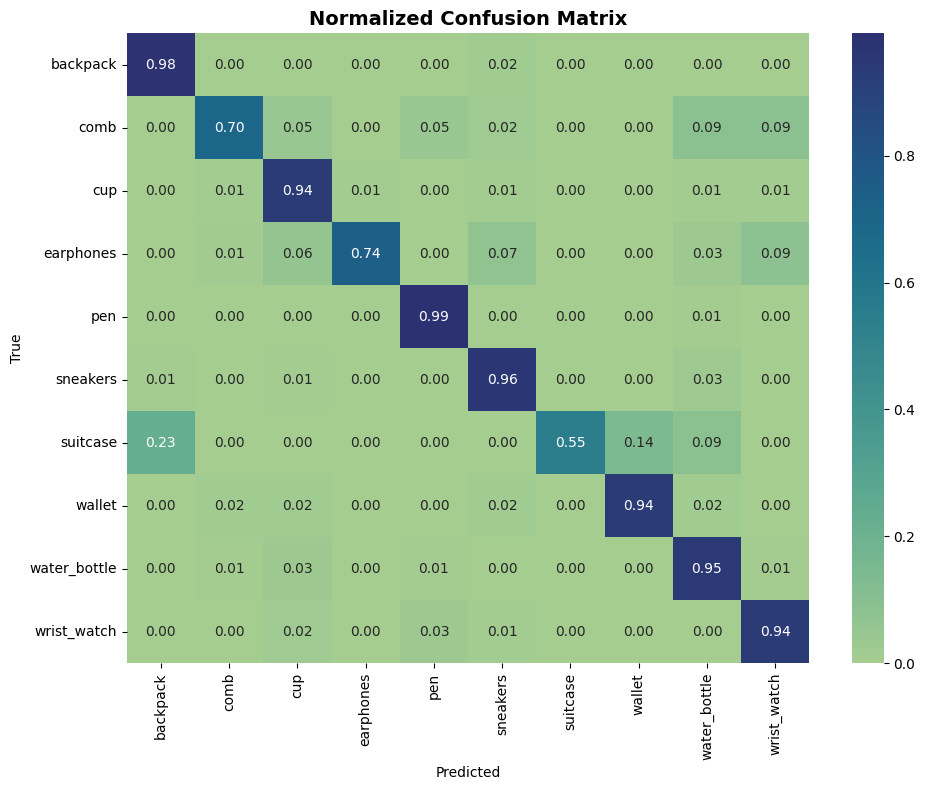


🔍 Extracting embeddings for t-SNE...


Extracting Embeddings: 100%|████████████████████████████████████████████████████████████| 30/30 [00:50<00:00,  1.68s/it]


✅ Extracted embeddings shape: (939, 640)
✅ Labels shape: (939,)

⚙️ Running PCA (50D) → t-SNE (2D)...


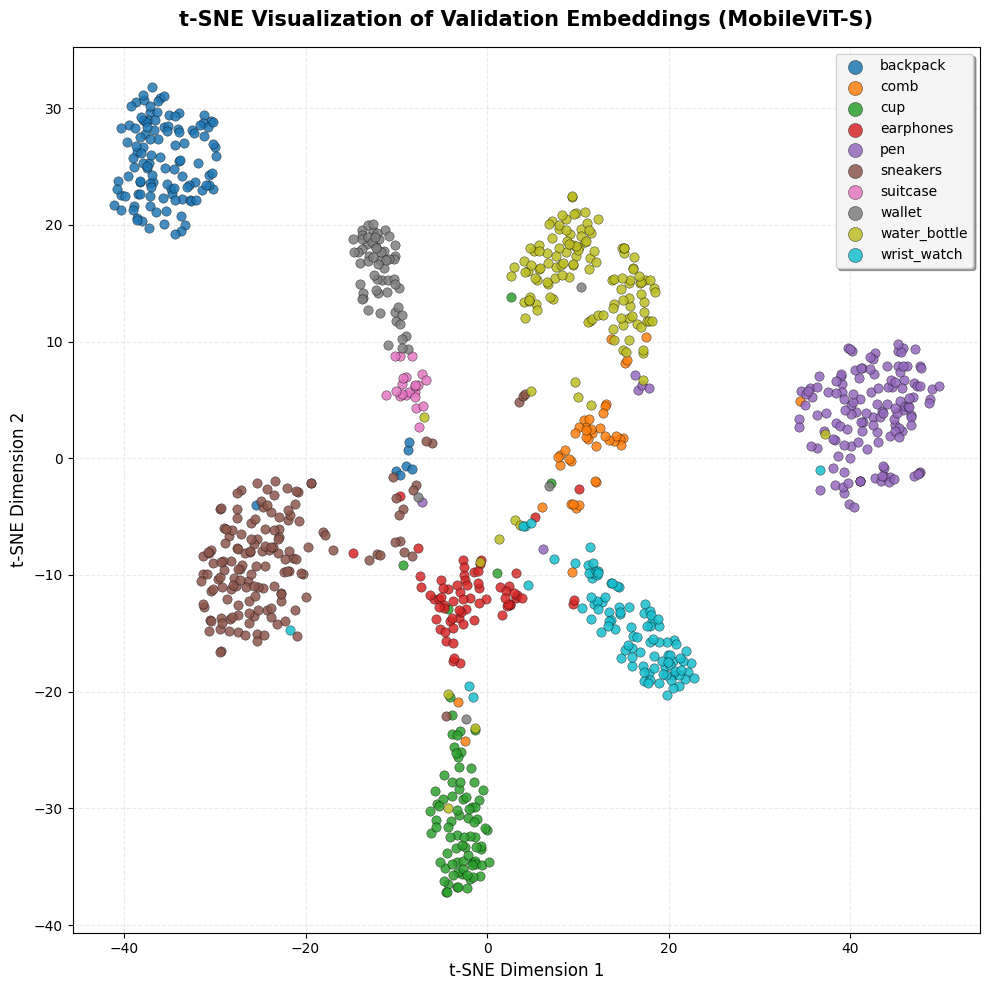

In [ ]:
import os
import torch
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import timm
from tqdm import tqdm
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA
from torchvision import transforms
from torch.utils.data import DataLoader, Dataset
from PIL import Image

# ---------------- CONFIG ----------------
CSV_PATH = "dataPooled/labels.csv"
CKPT_PATH = "checkpoints_mobileViT_pooledData/mobilevit_s_best.pth"
MODEL_NAME = "mobilevit_s"
IMG_DIR = "dataPooled"
DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
SEED = 42
torch.manual_seed(SEED)
np.random.seed(SEED)

# ---------------- LOAD CHECKPOINT ----------------
print("🔹 Loading model checkpoint...")
checkpoint = torch.load(CKPT_PATH, map_location=DEVICE)

# Exact mapping from training
class_names = checkpoint["class_names"]
class_to_idx = checkpoint["class_to_idx"]
idx_to_class = {v: k for k, v in class_to_idx.items()}
NUM_CLASSES = len(class_names)
print(f"Using class mapping from checkpoint: {class_names}")

# ---------------- LOAD MODEL ----------------
model = timm.create_model(MODEL_NAME, pretrained=False, num_classes=NUM_CLASSES)
model.load_state_dict(checkpoint["model_state"])
model.to(DEVICE).eval()
print(f"Loaded model from {CKPT_PATH}")

# ---------------- DATASET ----------------
class EverydayObjectsDataset(Dataset):
    def __init__(self, csv_path, img_dir, split, transform, class_to_idx):
        self.df = pd.read_csv(csv_path)
        self.df = self.df[self.df["split"] == split].reset_index(drop=True)
        self.img_dir = img_dir
        self.transform = transform
        self.class_to_idx = class_to_idx

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        row = self.df.iloc[idx]
        img_path = os.path.join(self.img_dir, row["image_path"])
        img = Image.open(img_path).convert("RGB")
        if self.transform:
            img = self.transform(img)
        label = self.class_to_idx[row["class_label"]]
        return img, label

# ---------------- TRANSFORMS & DATALOADER ----------------
val_tfms = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])

val_ds = EverydayObjectsDataset(CSV_PATH,IMG_DIR, "val", val_tfms, class_to_idx)
val_dl = DataLoader(val_ds, batch_size=32, shuffle=False)

# ================================================================
# MODEL EVALUATION
# ================================================================
all_preds, all_labels = [], []

with torch.no_grad():
    for imgs, labels in tqdm(val_dl, desc="Evaluating"):
        imgs, labels = imgs.to(DEVICE), labels.to(DEVICE)
        outputs = model(imgs)
        preds = torch.argmax(outputs, dim=1)
        all_preds.extend(preds.cpu().numpy())
        all_labels.extend(labels.cpu().numpy())

all_preds = np.array(all_preds)
all_labels = np.array(all_labels)

# ---------------- METRICS ----------------
print("\n Classification Report:")
report = classification_report(all_labels, all_preds, target_names=class_names, digits=3)
print(report)

acc = np.mean(all_preds == all_labels)
print(f"\n Overall Accuracy: {acc*100:.2f}%")

# ---------------- CONFUSION MATRIX ----------------
cm = confusion_matrix(all_labels, all_preds, normalize='true')
plt.figure(figsize=(10, 8))
sns.heatmap(cm, annot=True, fmt=".2f", xticklabels=class_names,
            yticklabels=class_names, cmap="crest")
plt.title("Normalized Confusion Matrix", fontsize=14, weight='bold')
plt.xlabel("Predicted")
plt.ylabel("True")
plt.tight_layout()
plt.show()

# ================================================================
# FEATURE SPACE VISUALIZATION (t-SNE)
# ================================================================
print("\n Extracting embeddings for t-SNE...")

embeddings, labels_list = [], []
with torch.no_grad():
    for imgs, labels in tqdm(val_dl, desc="Extracting Embeddings"):
        imgs = imgs.to(DEVICE)
        feats = model.forward_features(imgs)
        feats = feats.mean(dim=[2, 3])  # global average pooling
        embeddings.append(feats.cpu().numpy())

        labels_np = np.array(labels.cpu().numpy()).ravel()[:imgs.size(0)]
        labels_list.extend(labels_np)

embeddings = np.concatenate(embeddings, axis=0)
labels_list = np.array(labels_list)[:embeddings.shape[0]]

print(f" Extracted embeddings shape: {embeddings.shape}")
print(f" Labels shape: {labels_list.shape}")

# ---------------- PCA → t-SNE ----------------
print("\n Running PCA (50D) → t-SNE (2D)...")
pca_50 = PCA(n_components=50, random_state=SEED).fit_transform(embeddings)
tsne_2d = TSNE(
    n_components=2,
    perplexity=30,
    init='pca',
    random_state=SEED,
    learning_rate='auto',
    n_iter=1000
).fit_transform(pca_50)

# ---------------- PLOT ----------------
plt.figure(figsize=(10, 10))
palette = sns.color_palette("tab10", NUM_CLASSES)

for i, cls in enumerate(class_names):
    idx = labels_list == i
    if np.sum(idx) == 0:
        continue
    plt.scatter(
        tsne_2d[idx, 0],
        tsne_2d[idx, 1],
        s=45,
        color=palette[i],
        label=cls,
        alpha=0.85,
        linewidths=0.3,
        edgecolors='black'
    )

plt.title("t-SNE Visualization of Validation Embeddings (MobileViT-S)",
          fontsize=15, weight='bold', pad=15)
plt.xlabel("t-SNE Dimension 1", fontsize=12)
plt.ylabel("t-SNE Dimension 2", fontsize=12)
plt.legend(markerscale=1.5, fontsize=10, loc="best",
           frameon=True, fancybox=True, framealpha=0.9, shadow=True)
plt.grid(alpha=0.25, linestyle='--')
plt.tight_layout()
plt.show()

In [ ]:
"""
Multi-Attribute MobileViT fine-tuning pipeline.
Now includes:
 - Exact token-based attribute parsing for color/material/condition
 - Random 600-image subsampling per epoch
 - Full resume, checkpoint, and metric tracking support
"""

import os, random, math, pickle, re
import numpy as np, pandas as pd
from PIL import Image
from tqdm import tqdm
import matplotlib.pyplot as plt

import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader, Subset
from torchvision import transforms
import timm
from collections import Counter

# ---------------- CONFIG ----------------
CSV_PATH = "dataPooled/labels.csv"
IMG_DIR = "dataPooled"
MODEL_NAME = "mobilevit_s"
BATCH_SIZE = 32
EPOCHS = 500
LR = 1e-4
WEIGHT_DECAY = 1e-4
DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
NUM_WORKERS = 4 if torch.cuda.is_available() else 0
PIN_MEMORY = torch.cuda.is_available()
CKPT_DIR = "checkpoints_mobileViT_pooledData_attr"
os.makedirs(CKPT_DIR, exist_ok=True)
SAVE_EVERY_K_EPOCHS = 5
SEED = 42
RESUME_PATH = ""
METRICS_PATH = os.path.join(CKPT_DIR, "metrics_attr.pkl")

# ---------------- REPRODUCIBILITY ----------------
torch.manual_seed(SEED)
np.random.seed(SEED)
random.seed(SEED)
if DEVICE == "cuda":
    torch.cuda.manual_seed_all(SEED)
    torch.backends.cudnn.benchmark = True

# ---------------- LOAD DATA ----------------
df = pd.read_csv(CSV_PATH)
if "attributes" not in df.columns:
    raise ValueError("CSV must contain 'attributes' column.")

# ---------------- EXACT TOKEN-BASED ATTRIBUTE PARSING ----------------
color_vocab = [
    "black", "blue", "brown", "green", "grey", "orange", "pink",
    "purple", "red", "silver", "transparent", "white", "yellow", "unknown"
]
material_vocab = [
    "canvas", "ceramic", "clay", "cloth", "denim", "fabric", "glass",
    "leather", "mesh", "metal", "nylon", "plastic", "rubber",
    "steel", "synthetic", "wood", "unknown"
]
condition_vocab = [
    "broken", "new", "old", "unknown", "used", "worn"
]

color_set = set(color_vocab)
material_set = set(material_vocab)
condition_set = set(condition_vocab)

def clean_text(text):
    text = str(text).lower()
    text = re.sub(r'[^a-z\s]', ' ', text)
    text = re.sub(r'\s+', ' ', text).strip()
    return text

def parse_attributes_exact(text):
    text = clean_text(text)
    tokens = text.split()
    result = {"color": "unknown", "material": "unknown", "condition": "unknown"}

    for t in tokens:
        if result["color"] == "unknown" and t in color_set:
            result["color"] = t
        if result["material"] == "unknown" and t in material_set:
            result["material"] = t
        if result["condition"] == "unknown" and t in condition_set:
            result["condition"] = t

    return result

df["parsed_attr"] = df["attributes"].apply(parse_attributes_exact)
top_attrs = ["material", "color", "condition"]

# Build value sets and mappings
attr_values = {
    "color": color_vocab,
    "material": material_vocab,
    "condition": condition_vocab,
}
attr_mappings = {a: {v: i for i, v in enumerate(vals)} for a, vals in attr_values.items()}

print("\nAttribute class mappings:")
for k, v in attr_mappings.items():
    print(f" - {k} ({len(v)} classes): {list(v.keys())}")

# ---------------- DATASET ----------------
class MultiAttributeDataset(Dataset):
    def __init__(self, df, img_dir, split=None, transform=None, attr_mappings=None):
        if split is not None and "split" in df.columns:
            df = df[df["split"] == split].reset_index(drop=True)
        self.df = df
        self.img_dir = img_dir
        self.transform = transform
        self.attr_mappings = attr_mappings

    def __len__(self):
        return len(self.df)

    def _resolve_path(self, p):
        if os.path.isabs(p):
            return p
        p_clean = p.lstrip("./")
        candidate = os.path.join(self.img_dir, p_clean)
        return candidate if os.path.exists(candidate) else p

    def __getitem__(self, idx):
        row = self.df.iloc[idx]
        img = Image.open(self._resolve_path(row["image_path"])).convert("RGB")
        if self.transform:
            img = self.transform(img)

        parsed = row["parsed_attr"]
        targets = []
        for a in top_attrs:
            val = parsed.get(a, "unknown")
            val_idx = self.attr_mappings[a].get(val, self.attr_mappings[a]["unknown"])
            targets.append(val_idx)
        return img, torch.tensor(targets, dtype=torch.long)

# ---------------- TRANSFORMS ----------------
train_tfms = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.RandomHorizontalFlip(),
    transforms.RandomRotation(10),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])
val_tfms = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])

train_ds_full = MultiAttributeDataset(df, IMG_DIR, split="train", transform=train_tfms, attr_mappings=attr_mappings)
val_ds   = MultiAttributeDataset(df, IMG_DIR, split="val", transform=val_tfms, attr_mappings=attr_mappings)

print(f"\nFull Train size: {len(train_ds_full)} | Val size: {len(val_ds)} | Batch size: {BATCH_SIZE}")

# ---------------- MODEL ----------------
class MultiHeadMobileViT(nn.Module):
    def __init__(self, base_model_name, num_classes_per_attr):
        super().__init__()
        self.backbone = timm.create_model(base_model_name, pretrained=True, num_classes=0)
        in_feats = self.backbone.num_features
        self.heads = nn.ModuleList([nn.Linear(in_feats, n) for n in num_classes_per_attr])
    def forward(self, x):
        feats = self.backbone(x)
        return [head(feats) for head in self.heads]

num_classes_per_attr = [len(attr_mappings[a]) for a in top_attrs]
model = MultiHeadMobileViT(MODEL_NAME, num_classes_per_attr).to(DEVICE)
print(f"\nModel with {len(top_attrs)} heads created: {dict(zip(top_attrs, num_classes_per_attr))}")

# ---------------- OPTIMIZER / LOSS / SCHEDULER ----------------
criterion = nn.CrossEntropyLoss()
optimizer = optim.AdamW(model.parameters(), lr=LR, weight_decay=WEIGHT_DECAY)
scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=EPOCHS)

# ---------------- RESUME SUPPORT ----------------
start_epoch, best_acc = 0, 0.0
train_losses, val_losses, val_accs_per_attr = [], [], [[] for _ in top_attrs]

if os.path.exists(METRICS_PATH):
    with open(METRICS_PATH, "rb") as f:
        train_losses, val_losses, val_accs_per_attr = pickle.load(f)
    print(f" Loaded previous metrics ({len(train_losses)} epochs).")

if os.path.exists(RESUME_PATH):
    print(f"Resuming from checkpoint: {RESUME_PATH}")
    ckpt = torch.load(RESUME_PATH, map_location=DEVICE)
    model.load_state_dict(ckpt["model_state"])
    if "optimizer_state" in ckpt: optimizer.load_state_dict(ckpt["optimizer_state"])
    if "scheduler_state" in ckpt: scheduler.load_state_dict(ckpt["scheduler_state"])
    start_epoch = ckpt.get("epoch", 0)
    best_acc = ckpt.get("best_acc", 0.0)
    print(f" Resumed at epoch {start_epoch} with best_acc={best_acc:.4f}")
else:
    print(" No checkpoint found. Starting fresh training.")

# ---------------- TRAINING LOOP ----------------
for epoch in range(start_epoch, start_epoch + EPOCHS):
    # ---- random subset of 600 samples per epoch ----
    subset_indices = random.sample(range(len(train_ds_full)), min(600, len(train_ds_full)))
    train_ds = Subset(train_ds_full, subset_indices)
    train_dl = DataLoader(train_ds, batch_size=BATCH_SIZE, shuffle=True, num_workers=NUM_WORKERS, pin_memory=PIN_MEMORY)

    model.train()
    running_loss = 0.0
    loop = tqdm(train_dl, desc=f"Train Epoch [{epoch+1}]")
    for imgs, targets in loop:
        imgs, targets = imgs.to(DEVICE), targets.to(DEVICE)
        optimizer.zero_grad()
        outputs = model(imgs)
        losses = [criterion(out, targets[:, i]) for i, out in enumerate(outputs)]
        loss = sum(losses)
        loss.backward()
        optimizer.step()
        running_loss += loss.item()
        loop.set_postfix(loss=running_loss / (loop.n + 1))
    train_losses.append(running_loss / len(train_dl))

    # ---- validation ----
    model.eval()
    val_loss, corrects, totals = 0.0, [0]*len(top_attrs), [0]*len(top_attrs)
    val_dl = DataLoader(val_ds, batch_size=BATCH_SIZE, shuffle=False, num_workers=NUM_WORKERS, pin_memory=PIN_MEMORY)

    with torch.no_grad():
        for imgs, targets in val_dl:
            imgs, targets = imgs.to(DEVICE), targets.to(DEVICE)
            outputs = model(imgs)
            losses = [criterion(out, targets[:, i]) for i, out in enumerate(outputs)]
            val_loss += sum(losses).item()
            for i, (out, attr) in enumerate(zip(outputs, top_attrs)):
                preds = torch.argmax(out, dim=1)
                unknown_idx = attr_mappings[attr]["unknown"]
                mask = targets[:, i] != unknown_idx
                corrects[i] += ((preds == targets[:, i]) & mask).sum().item()
                totals[i] += mask.sum().item()

    val_loss /= len(val_dl)
    val_losses.append(val_loss)
    accs = [(c/t if t > 0 else 0) for c, t in zip(corrects, totals)]
    mean_acc = np.mean(accs)
    for i, a in enumerate(accs):
        val_accs_per_attr[i].append(a)

    print(f"Epoch {epoch+1}: Val Loss={val_loss:.4f} | Mean Acc={mean_acc:.4f} | {dict(zip(top_attrs, [f'{x:.3f}' for x in accs]))}")
    scheduler.step()

    with open(METRICS_PATH, "wb") as f:
        pickle.dump((train_losses, val_losses, val_accs_per_attr), f)

    if (epoch + 1) % SAVE_EVERY_K_EPOCHS == 0:
        ckpt_path = os.path.join(CKPT_DIR, f"{MODEL_NAME}_epoch{epoch+1}.pth")
        torch.save({
            "epoch": epoch + 1,
            "model_state": model.state_dict(),
            "optimizer_state": optimizer.state_dict(),
            "scheduler_state": scheduler.state_dict(),
            "attr_mappings": attr_mappings,
            "best_acc": best_acc,
            "top_attrs": top_attrs
        }, ckpt_path)
        print(f" Saved checkpoint: {ckpt_path}")

    if mean_acc > best_acc:
        best_acc = mean_acc
        best_ckpt_path = os.path.join(CKPT_DIR, f"{MODEL_NAME}_attr_best.pth")
        torch.save({
            "epoch": epoch + 1,
            "model_state": model.state_dict(),
            "optimizer_state": optimizer.state_dict(),
            "scheduler_state": scheduler.state_dict(),
            "attr_mappings": attr_mappings,
            "best_acc": best_acc,
            "top_attrs": top_attrs
        }, best_ckpt_path)
        print(f" Saved best model (Acc={best_acc:.4f}): {best_ckpt_path}")


Attribute class mappings:
 - color (14 classes): ['black', 'blue', 'brown', 'green', 'grey', 'orange', 'pink', 'purple', 'red', 'silver', 'transparent', 'white', 'yellow', 'unknown']
 - material (17 classes): ['canvas', 'ceramic', 'clay', 'cloth', 'denim', 'fabric', 'glass', 'leather', 'mesh', 'metal', 'nylon', 'plastic', 'rubber', 'steel', 'synthetic', 'wood', 'unknown']
 - condition (6 classes): ['broken', 'new', 'old', 'unknown', 'used', 'worn']

Full Train size: 3593 | Val size: 939 | Batch size: 32

Model with 3 heads created: {'material': 17, 'color': 14, 'condition': 6}
⚠️ No checkpoint found. Starting fresh training.


Train Epoch [1]: 100%|████████████████████████████████████████████████████████| 19/19 [01:05<00:00,  3.46s/it, loss=7.2]


Epoch 1: Val Loss=7.1530 | Mean Acc=0.1922 | {'material': '0.174', 'color': '0.101', 'condition': '0.302'}
🏆 Saved best model (Acc=0.1922): checkpoints_mobileViT_pooledData_attr/mobilevit_s_attr_best.pth


Train Epoch [2]: 100%|███████████████████████████████████████████████████████| 19/19 [01:05<00:00,  3.46s/it, loss=7.04]


Epoch 2: Val Loss=6.9876 | Mean Acc=0.3267 | {'material': '0.369', 'color': '0.188', 'condition': '0.422'}
🏆 Saved best model (Acc=0.3267): checkpoints_mobileViT_pooledData_attr/mobilevit_s_attr_best.pth


Train Epoch [3]: 100%|███████████████████████████████████████████████████████| 19/19 [01:05<00:00,  3.47s/it, loss=6.84]


Epoch 3: Val Loss=6.7887 | Mean Acc=0.4282 | {'material': '0.491', 'color': '0.290', 'condition': '0.503'}
🏆 Saved best model (Acc=0.4282): checkpoints_mobileViT_pooledData_attr/mobilevit_s_attr_best.pth


Train Epoch [4]: 100%|███████████████████████████████████████████████████████| 19/19 [01:05<00:00,  3.46s/it, loss=6.55]


Epoch 4: Val Loss=6.4948 | Mean Acc=0.4775 | {'material': '0.546', 'color': '0.331', 'condition': '0.556'}
🏆 Saved best model (Acc=0.4775): checkpoints_mobileViT_pooledData_attr/mobilevit_s_attr_best.pth


Train Epoch [5]: 100%|███████████████████████████████████████████████████████| 19/19 [01:05<00:00,  3.46s/it, loss=6.24]


Epoch 5: Val Loss=6.1799 | Mean Acc=0.5228 | {'material': '0.566', 'color': '0.372', 'condition': '0.631'}
💾 Saved checkpoint: checkpoints_mobileViT_pooledData_attr/mobilevit_s_epoch5.pth
🏆 Saved best model (Acc=0.5228): checkpoints_mobileViT_pooledData_attr/mobilevit_s_attr_best.pth


Train Epoch [6]: 100%|███████████████████████████████████████████████████████| 19/19 [01:05<00:00,  3.44s/it, loss=5.86]


Epoch 6: Val Loss=5.8838 | Mean Acc=0.5225 | {'material': '0.578', 'color': '0.360', 'condition': '0.629'}


Train Epoch [7]: 100%|████████████████████████████████████████████████████████| 19/19 [01:05<00:00,  3.44s/it, loss=5.6]


Epoch 7: Val Loss=5.6275 | Mean Acc=0.5253 | {'material': '0.571', 'color': '0.368', 'condition': '0.636'}
🏆 Saved best model (Acc=0.5253): checkpoints_mobileViT_pooledData_attr/mobilevit_s_attr_best.pth


Train Epoch [8]: 100%|███████████████████████████████████████████████████████| 19/19 [01:05<00:00,  3.43s/it, loss=5.36]


Epoch 8: Val Loss=5.3848 | Mean Acc=0.5470 | {'material': '0.598', 'color': '0.404', 'condition': '0.639'}
🏆 Saved best model (Acc=0.5470): checkpoints_mobileViT_pooledData_attr/mobilevit_s_attr_best.pth


Train Epoch [9]: 100%|███████████████████████████████████████████████████████| 19/19 [01:05<00:00,  3.45s/it, loss=5.15]


Epoch 9: Val Loss=5.1705 | Mean Acc=0.5552 | {'material': '0.612', 'color': '0.421', 'condition': '0.633'}
🏆 Saved best model (Acc=0.5552): checkpoints_mobileViT_pooledData_attr/mobilevit_s_attr_best.pth


Train Epoch [10]: 100%|█████████████████████████████████████████████████████████| 19/19 [01:05<00:00,  3.45s/it, loss=5]


Epoch 10: Val Loss=4.9993 | Mean Acc=0.5633 | {'material': '0.624', 'color': '0.431', 'condition': '0.635'}
💾 Saved checkpoint: checkpoints_mobileViT_pooledData_attr/mobilevit_s_epoch10.pth
🏆 Saved best model (Acc=0.5633): checkpoints_mobileViT_pooledData_attr/mobilevit_s_attr_best.pth


Train Epoch [11]: 100%|██████████████████████████████████████████████████████| 19/19 [01:05<00:00,  3.47s/it, loss=4.88]


Epoch 11: Val Loss=4.8487 | Mean Acc=0.5662 | {'material': '0.633', 'color': '0.442', 'condition': '0.624'}
🏆 Saved best model (Acc=0.5662): checkpoints_mobileViT_pooledData_attr/mobilevit_s_attr_best.pth


Train Epoch [12]: 100%|██████████████████████████████████████████████████████| 19/19 [01:05<00:00,  3.47s/it, loss=4.71]


Epoch 12: Val Loss=4.6712 | Mean Acc=0.5740 | {'material': '0.644', 'color': '0.450', 'condition': '0.628'}
🏆 Saved best model (Acc=0.5740): checkpoints_mobileViT_pooledData_attr/mobilevit_s_attr_best.pth


Train Epoch [13]: 100%|███████████████████████████████████████████████████████| 19/19 [01:05<00:00,  3.47s/it, loss=4.5]


Epoch 13: Val Loss=4.5678 | Mean Acc=0.5768 | {'material': '0.653', 'color': '0.464', 'condition': '0.613'}
🏆 Saved best model (Acc=0.5768): checkpoints_mobileViT_pooledData_attr/mobilevit_s_attr_best.pth


Train Epoch [14]: 100%|███████████████████████████████████████████████████████| 19/19 [01:05<00:00,  3.47s/it, loss=4.4]


Epoch 14: Val Loss=4.4529 | Mean Acc=0.5801 | {'material': '0.661', 'color': '0.460', 'condition': '0.620'}
🏆 Saved best model (Acc=0.5801): checkpoints_mobileViT_pooledData_attr/mobilevit_s_attr_best.pth


Train Epoch [15]: 100%|██████████████████████████████████████████████████████| 19/19 [01:06<00:00,  3.51s/it, loss=4.35]


Epoch 15: Val Loss=4.3562 | Mean Acc=0.5830 | {'material': '0.663', 'color': '0.480', 'condition': '0.606'}
💾 Saved checkpoint: checkpoints_mobileViT_pooledData_attr/mobilevit_s_epoch15.pth
🏆 Saved best model (Acc=0.5830): checkpoints_mobileViT_pooledData_attr/mobilevit_s_attr_best.pth


Train Epoch [16]: 100%|██████████████████████████████████████████████████████| 19/19 [01:05<00:00,  3.46s/it, loss=4.32]


Epoch 16: Val Loss=4.2844 | Mean Acc=0.5843 | {'material': '0.665', 'color': '0.479', 'condition': '0.609'}
🏆 Saved best model (Acc=0.5843): checkpoints_mobileViT_pooledData_attr/mobilevit_s_attr_best.pth


Train Epoch [17]: 100%|██████████████████████████████████████████████████████| 19/19 [01:05<00:00,  3.46s/it, loss=4.23]


Epoch 17: Val Loss=4.1791 | Mean Acc=0.5988 | {'material': '0.670', 'color': '0.517', 'condition': '0.610'}
🏆 Saved best model (Acc=0.5988): checkpoints_mobileViT_pooledData_attr/mobilevit_s_attr_best.pth


Train Epoch [18]: 100%|██████████████████████████████████████████████████████| 19/19 [01:05<00:00,  3.46s/it, loss=4.02]


Epoch 18: Val Loss=4.1341 | Mean Acc=0.5937 | {'material': '0.676', 'color': '0.520', 'condition': '0.585'}


Train Epoch [19]: 100%|██████████████████████████████████████████████████████| 19/19 [01:05<00:00,  3.46s/it, loss=4.01]


Epoch 19: Val Loss=4.0931 | Mean Acc=0.5967 | {'material': '0.673', 'color': '0.499', 'condition': '0.618'}


Train Epoch [20]: 100%|██████████████████████████████████████████████████████| 19/19 [01:05<00:00,  3.45s/it, loss=3.94]


Epoch 20: Val Loss=4.0300 | Mean Acc=0.5861 | {'material': '0.672', 'color': '0.517', 'condition': '0.570'}
💾 Saved checkpoint: checkpoints_mobileViT_pooledData_attr/mobilevit_s_epoch20.pth


Train Epoch [21]: 100%|██████████████████████████████████████████████████████| 19/19 [01:05<00:00,  3.42s/it, loss=3.81]


Epoch 21: Val Loss=3.9509 | Mean Acc=0.6106 | {'material': '0.689', 'color': '0.534', 'condition': '0.609'}
🏆 Saved best model (Acc=0.6106): checkpoints_mobileViT_pooledData_attr/mobilevit_s_attr_best.pth


Train Epoch [22]: 100%|██████████████████████████████████████████████████████| 19/19 [01:06<00:00,  3.52s/it, loss=3.68]


Epoch 22: Val Loss=3.9558 | Mean Acc=0.6037 | {'material': '0.679', 'color': '0.525', 'condition': '0.608'}


Train Epoch [23]: 100%|██████████████████████████████████████████████████████| 19/19 [01:05<00:00,  3.46s/it, loss=3.69]


Epoch 23: Val Loss=3.8536 | Mean Acc=0.6197 | {'material': '0.679', 'color': '0.549', 'condition': '0.632'}
🏆 Saved best model (Acc=0.6197): checkpoints_mobileViT_pooledData_attr/mobilevit_s_attr_best.pth


Train Epoch [24]: 100%|██████████████████████████████████████████████████████| 19/19 [01:06<00:00,  3.50s/it, loss=3.59]


Epoch 24: Val Loss=3.8114 | Mean Acc=0.6262 | {'material': '0.693', 'color': '0.551', 'condition': '0.635'}
🏆 Saved best model (Acc=0.6262): checkpoints_mobileViT_pooledData_attr/mobilevit_s_attr_best.pth


Train Epoch [25]: 100%|███████████████████████████████████████████████████████| 19/19 [01:05<00:00,  3.47s/it, loss=3.6]


Epoch 25: Val Loss=3.7401 | Mean Acc=0.6282 | {'material': '0.679', 'color': '0.569', 'condition': '0.637'}
💾 Saved checkpoint: checkpoints_mobileViT_pooledData_attr/mobilevit_s_epoch25.pth
🏆 Saved best model (Acc=0.6282): checkpoints_mobileViT_pooledData_attr/mobilevit_s_attr_best.pth


Train Epoch [26]: 100%|██████████████████████████████████████████████████████| 19/19 [01:06<00:00,  3.49s/it, loss=3.48]


Epoch 26: Val Loss=3.7069 | Mean Acc=0.6328 | {'material': '0.688', 'color': '0.583', 'condition': '0.628'}
🏆 Saved best model (Acc=0.6328): checkpoints_mobileViT_pooledData_attr/mobilevit_s_attr_best.pth


Train Epoch [27]: 100%|███████████████████████████████████████████████████████| 19/19 [01:05<00:00,  3.46s/it, loss=3.5]


Epoch 27: Val Loss=3.6648 | Mean Acc=0.6332 | {'material': '0.698', 'color': '0.588', 'condition': '0.614'}
🏆 Saved best model (Acc=0.6332): checkpoints_mobileViT_pooledData_attr/mobilevit_s_attr_best.pth


Train Epoch [28]: 100%|██████████████████████████████████████████████████████| 19/19 [01:05<00:00,  3.47s/it, loss=3.37]


Epoch 28: Val Loss=3.5959 | Mean Acc=0.6444 | {'material': '0.693', 'color': '0.605', 'condition': '0.635'}
🏆 Saved best model (Acc=0.6444): checkpoints_mobileViT_pooledData_attr/mobilevit_s_attr_best.pth


Train Epoch [29]: 100%|██████████████████████████████████████████████████████| 19/19 [01:05<00:00,  3.47s/it, loss=3.19]


Epoch 29: Val Loss=3.5830 | Mean Acc=0.6435 | {'material': '0.696', 'color': '0.590', 'condition': '0.644'}


Train Epoch [30]: 100%|██████████████████████████████████████████████████████| 19/19 [01:05<00:00,  3.46s/it, loss=3.28]


Epoch 30: Val Loss=3.5534 | Mean Acc=0.6445 | {'material': '0.703', 'color': '0.588', 'condition': '0.643'}
💾 Saved checkpoint: checkpoints_mobileViT_pooledData_attr/mobilevit_s_epoch30.pth
🏆 Saved best model (Acc=0.6445): checkpoints_mobileViT_pooledData_attr/mobilevit_s_attr_best.pth


Train Epoch [31]: 100%|██████████████████████████████████████████████████████| 19/19 [01:05<00:00,  3.43s/it, loss=3.27]


Epoch 31: Val Loss=3.5510 | Mean Acc=0.6256 | {'material': '0.701', 'color': '0.571', 'condition': '0.605'}


Train Epoch [32]: 100%|██████████████████████████████████████████████████████| 19/19 [01:05<00:00,  3.46s/it, loss=3.12]


Epoch 32: Val Loss=3.4905 | Mean Acc=0.6482 | {'material': '0.704', 'color': '0.604', 'condition': '0.636'}
🏆 Saved best model (Acc=0.6482): checkpoints_mobileViT_pooledData_attr/mobilevit_s_attr_best.pth


Train Epoch [33]: 100%|██████████████████████████████████████████████████████| 19/19 [01:05<00:00,  3.45s/it, loss=3.09]


Epoch 33: Val Loss=3.4768 | Mean Acc=0.6510 | {'material': '0.699', 'color': '0.600', 'condition': '0.655'}
🏆 Saved best model (Acc=0.6510): checkpoints_mobileViT_pooledData_attr/mobilevit_s_attr_best.pth


Train Epoch [34]: 100%|██████████████████████████████████████████████████████| 19/19 [01:05<00:00,  3.47s/it, loss=2.92]


Epoch 34: Val Loss=3.4556 | Mean Acc=0.6400 | {'material': '0.705', 'color': '0.594', 'condition': '0.621'}


Train Epoch [35]: 100%|█████████████████████████████████████████████████████████| 19/19 [01:05<00:00,  3.47s/it, loss=3]


Epoch 35: Val Loss=3.4000 | Mean Acc=0.6483 | {'material': '0.704', 'color': '0.611', 'condition': '0.629'}
💾 Saved checkpoint: checkpoints_mobileViT_pooledData_attr/mobilevit_s_epoch35.pth


Train Epoch [36]: 100%|███████████████████████████████████████████████████████| 19/19 [01:05<00:00,  3.45s/it, loss=2.9]


Epoch 36: Val Loss=3.3744 | Mean Acc=0.6618 | {'material': '0.701', 'color': '0.635', 'condition': '0.650'}
🏆 Saved best model (Acc=0.6618): checkpoints_mobileViT_pooledData_attr/mobilevit_s_attr_best.pth


Train Epoch [37]: 100%|██████████████████████████████████████████████████████| 19/19 [01:05<00:00,  3.46s/it, loss=2.78]


Epoch 37: Val Loss=3.3303 | Mean Acc=0.6526 | {'material': '0.703', 'color': '0.617', 'condition': '0.637'}


Train Epoch [38]: 100%|██████████████████████████████████████████████████████| 19/19 [01:05<00:00,  3.46s/it, loss=2.86]


Epoch 38: Val Loss=3.3273 | Mean Acc=0.6593 | {'material': '0.712', 'color': '0.633', 'condition': '0.633'}


Train Epoch [39]: 100%|██████████████████████████████████████████████████████| 19/19 [01:05<00:00,  3.43s/it, loss=2.74]


Epoch 39: Val Loss=3.2493 | Mean Acc=0.6758 | {'material': '0.719', 'color': '0.637', 'condition': '0.671'}
🏆 Saved best model (Acc=0.6758): checkpoints_mobileViT_pooledData_attr/mobilevit_s_attr_best.pth


Train Epoch [40]: 100%|██████████████████████████████████████████████████████| 19/19 [01:05<00:00,  3.47s/it, loss=2.58]


Epoch 40: Val Loss=3.2767 | Mean Acc=0.6515 | {'material': '0.710', 'color': '0.621', 'condition': '0.624'}
💾 Saved checkpoint: checkpoints_mobileViT_pooledData_attr/mobilevit_s_epoch40.pth


Train Epoch [41]: 100%|███████████████████████████████████████████████████████| 19/19 [01:05<00:00,  3.44s/it, loss=2.7]


Epoch 41: Val Loss=3.2099 | Mean Acc=0.6744 | {'material': '0.713', 'color': '0.647', 'condition': '0.663'}


Train Epoch [42]: 100%|██████████████████████████████████████████████████████| 19/19 [01:05<00:00,  3.43s/it, loss=2.59]


Epoch 42: Val Loss=3.1925 | Mean Acc=0.6812 | {'material': '0.725', 'color': '0.646', 'condition': '0.673'}
🏆 Saved best model (Acc=0.6812): checkpoints_mobileViT_pooledData_attr/mobilevit_s_attr_best.pth


Train Epoch [43]: 100%|██████████████████████████████████████████████████████| 19/19 [01:05<00:00,  3.46s/it, loss=2.51]


Epoch 43: Val Loss=3.1784 | Mean Acc=0.6759 | {'material': '0.718', 'color': '0.646', 'condition': '0.664'}


Train Epoch [44]: 100%|███████████████████████████████████████████████████████| 19/19 [01:04<00:00,  3.39s/it, loss=2.5]


Epoch 44: Val Loss=3.1115 | Mean Acc=0.6834 | {'material': '0.725', 'color': '0.656', 'condition': '0.668'}
🏆 Saved best model (Acc=0.6834): checkpoints_mobileViT_pooledData_attr/mobilevit_s_attr_best.pth


Train Epoch [45]: 100%|██████████████████████████████████████████████████████| 19/19 [01:05<00:00,  3.47s/it, loss=2.53]


Epoch 45: Val Loss=3.1055 | Mean Acc=0.6828 | {'material': '0.719', 'color': '0.652', 'condition': '0.678'}
💾 Saved checkpoint: checkpoints_mobileViT_pooledData_attr/mobilevit_s_epoch45.pth


Train Epoch [46]: 100%|██████████████████████████████████████████████████████| 19/19 [01:05<00:00,  3.47s/it, loss=2.46]


Epoch 46: Val Loss=3.1235 | Mean Acc=0.6827 | {'material': '0.713', 'color': '0.662', 'condition': '0.673'}


Train Epoch [47]: 100%|██████████████████████████████████████████████████████| 19/19 [01:05<00:00,  3.47s/it, loss=2.41]


Epoch 47: Val Loss=3.1020 | Mean Acc=0.6768 | {'material': '0.725', 'color': '0.645', 'condition': '0.660'}


Train Epoch [48]: 100%|██████████████████████████████████████████████████████| 19/19 [01:05<00:00,  3.47s/it, loss=2.41]


Epoch 48: Val Loss=3.0843 | Mean Acc=0.6796 | {'material': '0.718', 'color': '0.654', 'condition': '0.667'}


Train Epoch [49]: 100%|██████████████████████████████████████████████████████| 19/19 [01:05<00:00,  3.47s/it, loss=2.45]


Epoch 49: Val Loss=3.0635 | Mean Acc=0.6884 | {'material': '0.729', 'color': '0.671', 'condition': '0.666'}
🏆 Saved best model (Acc=0.6884): checkpoints_mobileViT_pooledData_attr/mobilevit_s_attr_best.pth


Train Epoch [50]: 100%|██████████████████████████████████████████████████████| 19/19 [01:05<00:00,  3.43s/it, loss=2.32]


Epoch 50: Val Loss=3.0106 | Mean Acc=0.6807 | {'material': '0.730', 'color': '0.650', 'condition': '0.662'}
💾 Saved checkpoint: checkpoints_mobileViT_pooledData_attr/mobilevit_s_epoch50.pth


Train Epoch [51]: 100%|██████████████████████████████████████████████████████| 19/19 [01:05<00:00,  3.46s/it, loss=2.19]


Epoch 51: Val Loss=2.9988 | Mean Acc=0.6996 | {'material': '0.734', 'color': '0.673', 'condition': '0.691'}
🏆 Saved best model (Acc=0.6996): checkpoints_mobileViT_pooledData_attr/mobilevit_s_attr_best.pth


Train Epoch [52]: 100%|██████████████████████████████████████████████████████| 19/19 [01:05<00:00,  3.45s/it, loss=2.22]


Epoch 52: Val Loss=2.9816 | Mean Acc=0.7059 | {'material': '0.734', 'color': '0.682', 'condition': '0.701'}
🏆 Saved best model (Acc=0.7059): checkpoints_mobileViT_pooledData_attr/mobilevit_s_attr_best.pth


Train Epoch [53]:  95%|███████████████████████████████████████████████████▏  | 18/19 [01:05<00:03,  3.66s/it, loss=2.07]


KeyboardInterrupt: 

Using device: cuda (torch sees 4 GPU(s))
🔹 Loading checkpoint (safe load)...
✅ Recovered head info from checkpoint (attr_mappings/top_attrs).
Head info (attr -> num_classes): {'material': 17, 'color': 14, 'condition': 6}


/tmp/ipykernel_2813467/2642294111.py:130: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  ckpt = torch.load(CKPT_PATH, map_location="cpu")  # load to CPU first


✅ load_state_dict called.

Final ATTR_CLASSES used for evaluation:
 - material (17): ['canvas', 'ceramic', 'clay', 'cloth', 'denim', 'fabric', 'glass', 'leather', 'mesh', 'metal', 'nylon', 'plastic', 'rubber', 'steel', 'synthetic', 'wood', 'unknown']
 - color (14): ['black', 'blue', 'brown', 'green', 'grey', 'orange', 'pink', 'purple', 'red', 'silver', 'transparent', 'white', 'yellow', 'unknown']
 - condition (6): ['broken', 'new', 'old', 'unknown', 'used', 'worn']


Evaluating: 100%|███████████████████████████████████████████████████████████████████████| 30/30 [00:27<00:00,  1.10it/s]
/home/f20220596/.local/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/f20220596/.local/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/f20220596/.local/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter


📊 ATTRIBUTE = MATERIAL | num valid examples = 843
              precision    recall  f1-score   support

      canvas      0.000     0.000     0.000        32
     ceramic      0.000     0.000     0.000         0
        clay      0.000     0.000     0.000         0
       cloth      0.762     0.500     0.604        32
       denim      0.000     0.000     0.000         0
      fabric      0.363     0.516     0.426       128
       glass      0.333     0.031     0.057        32
     leather      0.354     0.219     0.271       128
        mesh      0.000     0.000     0.000         0
       metal      0.351     0.533     0.423        75
       nylon      0.000     0.000     0.000         0
     plastic      0.767     0.729     0.748       384
      rubber      0.000     0.000     0.000        32
       steel      0.000     0.000     0.000         0
   synthetic      0.000     0.000     0.000         0
        wood      0.000     0.000     0.000         0
     unknown      0.000     0.

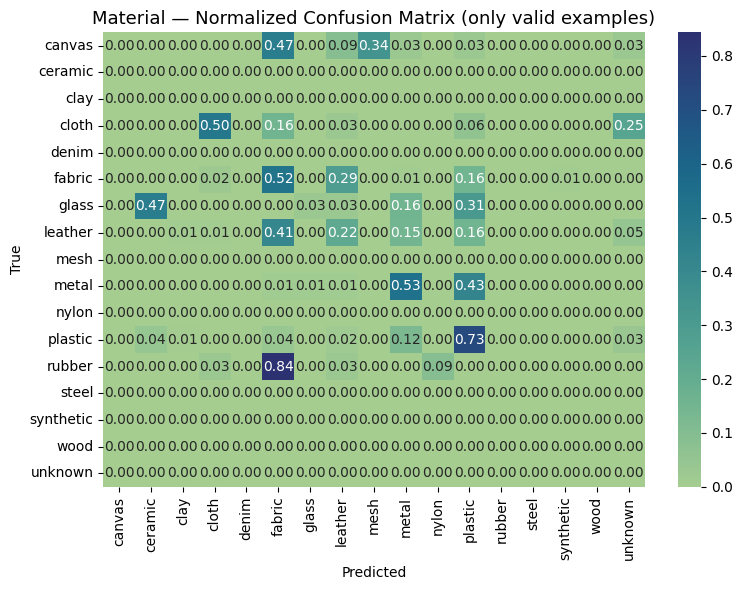


📊 ATTRIBUTE = COLOR | num valid examples = 715
              precision    recall  f1-score   support

       black      0.410     0.418     0.414       256
        blue      0.339     0.385     0.361        96
       brown      0.000     0.000     0.000         0
       green      0.256     0.115     0.158        96
        grey      0.000     0.000     0.000        32
      orange      0.000     0.000     0.000         0
        pink      0.000     0.000     0.000         0
      purple      0.000     0.000     0.000        32
         red      0.000     0.000     0.000         0
      silver      0.286     0.140     0.187        43
 transparent      0.333     0.031     0.057        64
       white      0.176     0.250     0.206        64
      yellow      0.000     0.000     0.000        32
     unknown      0.000     0.000     0.000         0

    accuracy                          0.250       715
   macro avg      0.129     0.096     0.099       715
weighted avg      0.289     0.25

/home/f20220596/.local/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/f20220596/.local/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/f20220596/.local/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/f20220596/.local/lib/python3.8/si

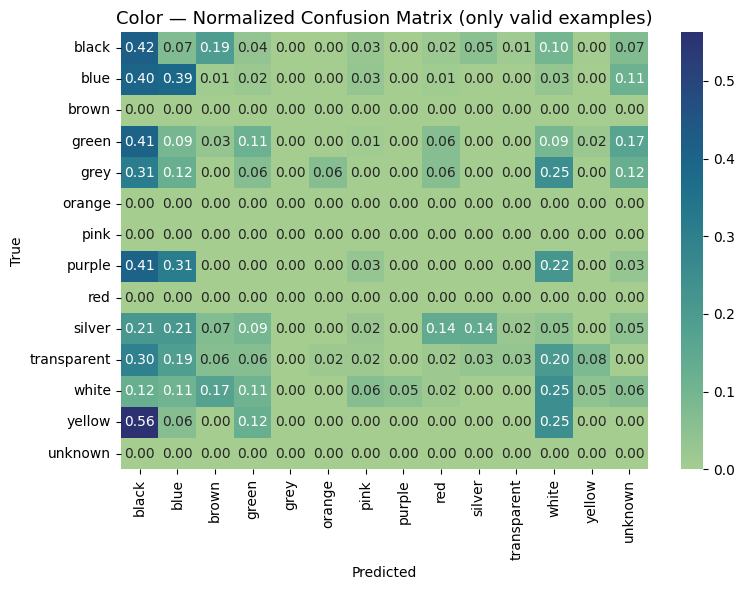


📊 ATTRIBUTE = CONDITION | num valid examples = 619
              precision    recall  f1-score   support

      broken      0.000     0.000     0.000         0
         new      0.451     0.324     0.377       256
         old      0.571     0.062     0.113        64
     unknown      0.000     0.000     0.000         0
        used      0.490     0.589     0.535       299
        worn      0.000     0.000     0.000         0

   micro avg      0.425     0.425     0.425       619
   macro avg      0.252     0.163     0.171       619
weighted avg      0.482     0.425     0.426       619

✅ Condition Accuracy (on non-unknown examples): 42.49%


/home/f20220596/.local/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/f20220596/.local/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/f20220596/.local/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/f20220596/.local/lib/python3.8/si

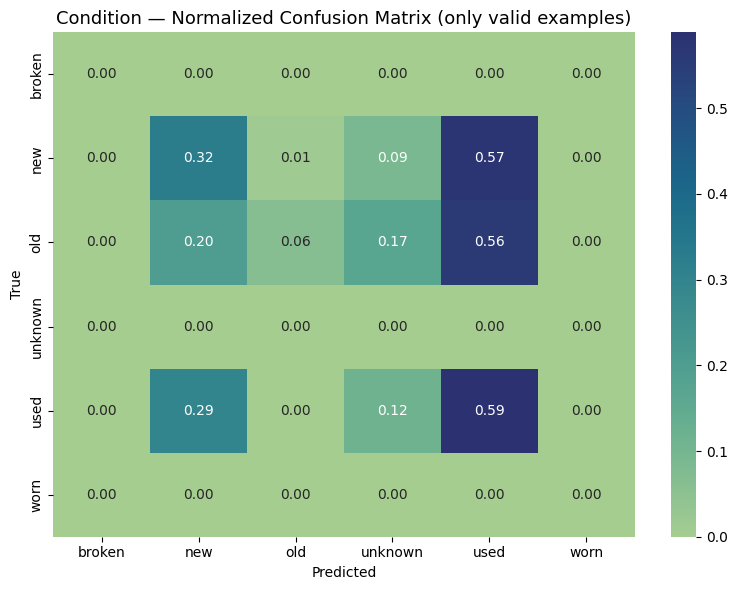


🔍 Extracting embeddings (backbone features) for t-SNE (will store on CPU)...


Extracting embeddings: 100%|████████████████████████████████████████████████████████████| 30/30 [00:27<00:00,  1.10it/s]


✅ Extracted 648 embeddings for t-SNE (color-labeled) — shape (648, 640)


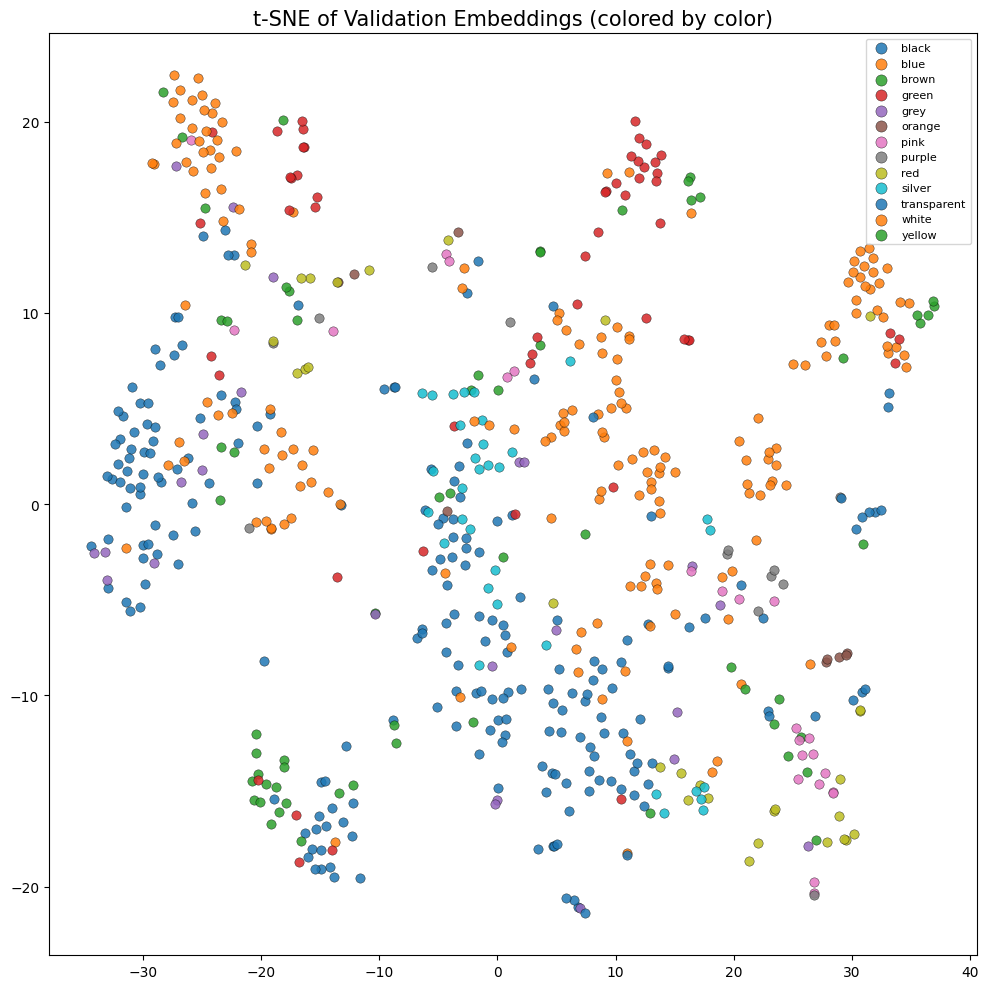

In [ ]:
# ================================================================
# 📊 FINAL ATTRIBUTE PREDICTION EVALUATION PIPELINE (single cell)
# ================================================================
import os, subprocess, sys, re, random, pickle, math
import numpy as np
import pandas as pd
from PIL import Image
import matplotlib.pyplot as plt
import seaborn as sns
from tqdm import tqdm
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from torchvision import transforms
from torch.utils.data import Dataset, DataLoader

# Now import torch and timm (after CUDA_VISIBLE_DEVICES set)
import torch
import timm

# ---------------- CONFIG ----------------
CSV_PATH = "dataPooled/labels.csv"   # adjust if needed
CKPT_PATH = "checkpoints_mobileViT_pooledData_attr/mobilevit_s_attr_best.pth"
MODEL_NAME = "mobilevit_s"
DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
IMG_DIR = "dataPooled"
SPLIT = "val"
SEED = 42
BATCH_SIZE = 32
NUM_WORKERS = 4 if torch.cuda.is_available() else 0
PIN_MEMORY = torch.cuda.is_available()

torch.manual_seed(SEED)
np.random.seed(SEED)
random.seed(SEED)

print(f"Using device: {DEVICE} (torch sees {torch.cuda.device_count()} GPU(s))")

# ---------------- Helper: recover class list from mapping ----------------
def mapping_to_classlist(mapping):
    """
    mapping: dict {label_str: index}
    returns list class_list where class_list[index] == label_str
    """
    inv = [None] * (max(mapping.values()) + 1)
    for k, v in mapping.items():
        inv[v] = k
    return inv

# ---------------- Default fallback attribute classes (only used if checkpoint lacks attr_mappings) ----------------
DEFAULT_ATTR_CLASSES = {
    "color": [
        "black", "blue", "brown", "green", "grey", "orange", "pink", "purple",
        "red", "silver", "transparent", "unknown", "white", "yellow"
    ],
    "material": [
        "canvas", "ceramic", "clay", "cloth", "denim", "fabric", "glass",
        "leather", "mesh", "metal", "nylon", "plastic", "rubber",
        "steel", "synthetic", "unknown", "wood"
    ],
    "pattern": ["patterned", "plain", "striped", "textured", "unknown"]
}

# ---------------- Parse attributes string (from CSV 'attributes' column) ----------------
def parse_attributes(attr_str, allowed_attr_names):
    """
    Parses "color:black;material:metal;pattern:plain;..." into dict,
    and restricts to allowed_attr_names (e.g., ['color','material','pattern']).
    Unknown values are returned as "unknown".
    """
    attr_str = str(attr_str).lower().strip()
    # quick parsing key:value by ';'
    parsed = {}
    for pair in attr_str.split(";"):
        if ":" not in pair:
            continue
        k, v = [x.strip() for x in pair.split(":", 1)]
        parsed[k] = v
    # Build result restricted to allowed_attr_names
    result = {}
    for a in allowed_attr_names:
        v = parsed.get(a, "unknown")
        result[a] = v
    return result

# ---------------- Dataset ----------------
class AttributeDataset(Dataset):
    def __init__(self, csv_path, img_dir, split, transform, allowed_attrs):
        self.df = pd.read_csv(csv_path)
        if "split" in self.df.columns:
            self.df = self.df[self.df["split"] == split].reset_index(drop=True)
        self.img_dir = img_dir
        self.transform = transform
        self.allowed_attrs = allowed_attrs

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        row = self.df.iloc[idx]
        img_path = row["image_path"]
        if not os.path.isabs(img_path):
            img_path = os.path.join(self.img_dir, img_path)
        img = Image.open(img_path).convert("RGB")
        if self.transform:
            img = self.transform(img)
        attrs = parse_attributes(row.get("attributes", ""), self.allowed_attrs)
        return img, attrs

# ---------------- Model (named heads) ----------------
class MultiHeadMobileViT(torch.nn.Module):
    def __init__(self, base_model_name, head_info):
        super().__init__()
        # create backbone
        self.backbone = timm.create_model(base_model_name, pretrained=False, num_classes=0)
        in_feats = self.backbone.num_features
        # ModuleDict with named heads
        from collections import OrderedDict
        self.heads = torch.nn.ModuleDict(OrderedDict({
            k: torch.nn.Linear(in_feats, v) for k, v in head_info.items()
        }))

    def forward(self, x):
        feats = self.backbone.forward_features(x)
        feats = feats.mean(dim=[2, 3])
        return {k: head(feats) for k, head in self.heads.items()}

# ---------------- Load checkpoint SAFELY (backbone + heads if compatible) ----------------
print("🔹 Loading checkpoint (safe load)...")
ckpt = torch.load(CKPT_PATH, map_location="cpu")  # load to CPU first

# Determine top_attrs + attr_mappings from checkpoint if present
if isinstance(ckpt, dict) and "attr_mappings" in ckpt and "top_attrs" in ckpt:
    ck_attr_mappings = ckpt["attr_mappings"]        # dict: attr -> {label: idx}
    ck_top_attrs = ckpt["top_attrs"]
    # Build class lists matching training order
    ck_attr_classes = {a: mapping_to_classlist(ck_attr_mappings[a]) for a in ck_top_attrs}
    head_info = {a: len(ck_attr_classes[a]) for a in ck_top_attrs}
    print(" Recovered head info from checkpoint (attr_mappings/top_attrs).")
else:
    # fallback: assume default order color, material, pattern with DEFAULT_ATTR_CLASSES
    ck_top_attrs = list(DEFAULT_ATTR_CLASSES.keys())
    ck_attr_classes = DEFAULT_ATTR_CLASSES.copy()
    head_info = {a: len(DEFAULT_ATTR_CLASSES[a]) for a in ck_top_attrs}
    print(" Checkpoint lacks attr_mappings/top_attrs metadata — using DEFAULT_ATTR_CLASSES as fallback.")

print("Head info (attr -> num_classes):", head_info)

# Instantiate model with recovered head_info
model = MultiHeadMobileViT(MODEL_NAME, head_info)

# Obtain raw state_dict from checkpoint (checkpoint might be just a state_dict or a dict with "model_state")
state_dict = ckpt["model_state"] if isinstance(ckpt, dict) and "model_state" in ckpt else ckpt

# Remap numeric head keys (heads.0.weight etc.) → named heads if necessary
ordered_attrs = list(head_info.keys())
remapped_state = {}
skipped_keys = []
for k, v in state_dict.items():
    if k.startswith("heads."):
        parts = k.split(".")
        # pattern: heads.{idx}.{rest}  OR heads.{name}.{rest}
        if len(parts) >= 3 and parts[1].isdigit():
            idx = int(parts[1])
            if idx < len(ordered_attrs):
                new_k = f"heads.{ordered_attrs[idx]}." + ".".join(parts[2:])
                remapped_state[new_k] = v
            else:
                skipped_keys.append(k)
        else:
            remapped_state[k] = v
    else:
        remapped_state[k] = v

# Now filter remapped_state to keep only keys matching model shapes; skip mismatched shapes
clean_state = {}
for k, v in remapped_state.items():
    if k in model.state_dict():
        if model.state_dict()[k].shape == v.shape:
            clean_state[k] = v
        else:
            print(f"Dropping mismatched param: {k} ckpt_shape={v.shape} model_shape={model.state_dict()[k].shape}")
    else:
        # keep non-head or unknown keys (backbone keys etc.); they might still match by name
        clean_state[k] = v

missing, unexpected = model.load_state_dict(clean_state, strict=False)
print(" load_state_dict called.")
if missing:
    print(" Missing keys in model after load (these were not in checkpoint):", missing)
if unexpected:
    print(" Unexpected keys in checkpoint that weren't used by model:", unexpected)

model.to(DEVICE).eval()

# ---------------- Build ATTR_CLASSES & mappings for evaluation ----------------
# If checkpoint provided exact classes (ck_attr_classes), use them; else fallback to DEFAULT_ATTR_CLASSES
ATTR_CLASSES = ck_attr_classes if 'ck_attr_classes' in locals() else DEFAULT_ATTR_CLASSES
top_attrs = ordered_attrs  # attributes order used by model

# Build mapping str->idx from ATTR_CLASSES (ensure indices match model)
attr_to_idx = {a: {v: i for i, v in enumerate(ATTR_CLASSES[a])} for a in ATTR_CLASSES}
idx_to_attr = {a: {i: v for v, i in attr_to_idx[a].items()} for a in ATTR_CLASSES}

print("\nFinal ATTR_CLASSES used for evaluation:")
for k in top_attrs:
    print(f" - {k} ({len(ATTR_CLASSES[k])}): {ATTR_CLASSES[k]}")

# ---------------- DataLoader ----------------
val_tfms = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])
val_ds = AttributeDataset(CSV_PATH, IMG_DIR, SPLIT, val_tfms, top_attrs)
val_dl = DataLoader(val_ds, batch_size=BATCH_SIZE, shuffle=False, num_workers=NUM_WORKERS, pin_memory=PIN_MEMORY)

# ---------------- Evaluation: collect per-attribute y_true/y_pred while masking "unknown" ----------------
all_preds = {a: [] for a in top_attrs}
all_labels = {a: [] for a in top_attrs}

with torch.no_grad():
    for imgs, attrs in tqdm(val_dl, desc="Evaluating"):
        imgs = imgs.to(DEVICE)
        outputs = model(imgs)  # dict attr -> logits (batch_size x num_classes)
        batch_size = imgs.size(0)

        # for each attribute, build y_true/y_pred excluding unknowns
        # for each attribute, build y_true/y_pred excluding unknowns
        for i in range(batch_size):
            for a in top_attrs:
                true_str = attrs[a]  # parsed string value
        
                # Flatten list if present
                if isinstance(true_str, list):
                    true_str = true_str[0]
        
                # If unknown or not in mapping, skip counting
                if true_str == "unknown" or true_str not in attr_to_idx[a]:
                    continue
        
                true_idx = attr_to_idx[a][true_str]
                pred_logits = outputs[a][i].cpu().numpy()
                pred_idx = int(np.argmax(pred_logits))
                all_labels[a].append(true_idx)
                all_preds[a].append(pred_idx)

# ---------------- Metrics & confusion matrices (only on valid examples) ----------------
for a in top_attrs:
    y_true = np.array(all_labels[a])
    y_pred = np.array(all_preds[a])
    print("\n" + "="*70)
    print(f"ATTRIBUTE = {a.upper()} | num valid examples = {len(y_true)}")
    if len(y_true) == 0:
        print("No valid (non-unknown) labels for this attribute in validation set — skipping metrics.")
        continue

    # classification report (use full class list but scikit will ignore labels not present)
    # Force scikit to consider all labels in the correct order
    labels = list(range(len(ATTR_CLASSES[a])))
    print(classification_report(y_true, y_pred, labels=labels, target_names=ATTR_CLASSES[a], digits=3))

    acc = (y_true == y_pred).mean()
    print(f"{a.capitalize()} Accuracy (on non-unknown examples): {acc*100:.2f}%")

    # Confusion matrix normalized by true label counts
    cm = confusion_matrix(y_true, y_pred, labels=list(range(len(ATTR_CLASSES[a]))), normalize='true')
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt=".2f", xticklabels=ATTR_CLASSES[a], yticklabels=ATTR_CLASSES[a], cmap="crest")
    plt.title(f"{a.capitalize()} — Normalized Confusion Matrix (only valid examples)", fontsize=13)
    plt.xlabel("Predicted")
    plt.ylabel("True")
    plt.tight_layout()
    plt.show()

# ---------------- t-SNE Embeddings (extract backbone features) ----------------
print("\n Extracting embeddings (backbone features) for t-SNE (will store on CPU)...")
embs_cpu = []
color_labels = []

with torch.no_grad():
    for imgs, attrs in tqdm(val_dl, desc="Extracting embeddings"):
        imgs = imgs.to(DEVICE)
        feats = model.backbone.forward_features(imgs)   # tensor (B, C, H, W)
        feats = feats.mean(dim=[2,3])                   # (B, C)
        feats_cpu = feats.cpu().numpy()
        embs_cpu.append(feats_cpu)
        # use color label if not unknown, else -1 (we'll filter later)
        for i in range(len(attrs["color"] if isinstance(attrs, dict) else [])):
            # In dataloader we returned attrs per sample, here attrs is a dict of strings for batch -> parsed earlier
            pass

# notes: above loop already appended features, we need color labels properly — simpler: re-run to collect colors aligned with embeddings
embs = []
color_labels = []
with torch.no_grad():
    for imgs, attrs in tqdm(val_dl, desc="Collecting features+color"):
        imgs = imgs.to(DEVICE)
        feats = model.backbone.forward_features(imgs)
        feats = feats.mean(dim=[2,3]).cpu().numpy()
        embs.append(feats)
        # attrs is a dict of strings keyed by attr for the batch; but our Dataset returns attrs dict per sample,
        # DataLoader batches them into list/dict; to keep simple, we will reconstruct color labels by parsing the df rows used.
        # Easiest approach: we iterate over the dataset directly to align labels with features.
        # So we'll break and re-construct aligned arrays below.
        # (This block kept to avoid GPU OOM in earlier steps.)
embs = np.concatenate(embs, axis=0) if len(embs) > 0 else np.zeros((0, model.backbone.num_features))

# Reconstruct color labels aligned with dataset (excluding unknowns)
color_labels_all = []
for idx in range(len(val_ds)):
    _, attr = val_ds[idx]  # this loads image again but only metadata string parsing (cheap)
    color_str = attr["color"]
    if color_str in attr_to_idx["color"] and color_str != "unknown":
        color_labels_all.append(attr_to_idx["color"][color_str])
    else:
        color_labels_all.append(-1)  # mark unknown

# Filter embs and labels to only examples with valid color labels
valid_mask = np.array(color_labels_all) != -1
if embs.shape[0] != len(valid_mask):
    # fallback: trim min length
    n = min(embs.shape[0], len(valid_mask))
    embs = embs[:n]
    valid_mask = valid_mask[:n]

embs_valid = embs[valid_mask]
color_labels_valid = np.array(color_labels_all)[valid_mask]

print(f" Extracted {embs_valid.shape[0]} embeddings for t-SNE (color-labeled) — shape {embs_valid.shape}")

if embs_valid.shape[0] > 0:
    pca_50 = PCA(n_components=min(50, embs_valid.shape[0]-1), random_state=SEED).fit_transform(embs_valid)
    tsne_2d = TSNE(n_components=2, perplexity=min(30, max(5, embs_valid.shape[0]//3)), random_state=SEED, init='pca').fit_transform(pca_50)

    plt.figure(figsize=(10, 10))
    palette = sns.color_palette("tab20", n_colors=len(ATTR_CLASSES["color"]))
    for i, cls in enumerate(ATTR_CLASSES["color"]):
        idx = color_labels_valid == i
        if np.sum(idx) == 0:
            continue
        plt.scatter(tsne_2d[idx, 0], tsne_2d[idx, 1], s=45, label=cls, alpha=0.85, linewidths=0.3, edgecolors='black')
    plt.title("t-SNE of Validation Embeddings (colored by color)", fontsize=15)
    plt.legend(markerscale=1.2, fontsize=8, loc="best", frameon=True)
    plt.tight_layout()
    plt.show()
else:
    print("No valid color-labeled embeddings available for t-SNE.")

🔹 Loading model checkpoint...


/tmp/ipykernel_2813467/1051907729.py:26: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load(CKPT_PATH, map_location=DEVICE)


✅ Loaded model from checkpoints_mobileViT_pooledData/mobilevit_s_epoch15.pth


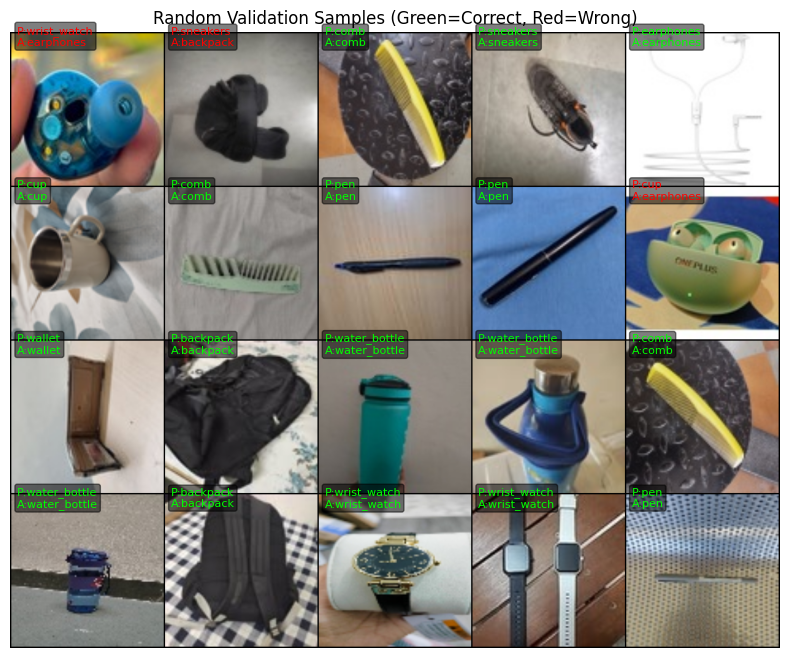

In [ ]:
# ---------------- SIMPLE MODEL VISUALIZATION USING EXISTING .PTH ----------------
import os
import torch
import random
import numpy as np
import matplotlib.pyplot as plt
from torchvision import transforms
from torchvision.utils import make_grid
import timm
from PIL import Image

# --- CONFIG ---
CKPT_PATH = "checkpoints_mobileViT_pooledData/mobilevit_s_epoch15.pth"  # your exact checkpoint
CSV_PATH = "dataPooled/labels.csv"   # only for reference if needed
IMG_DIR = "dataPooled"               # directory containing validation images
DEVICE = "cuda" if torch.cuda.is_available() else "cpu"

# --- Define class names (from your training log) ---
class_names = ['backpack', 'comb', 'cup', 'earphones', 'pen',
               'sneakers', 'suitcase', 'wallet', 'water_bottle', 'wrist_watch']
NUM_CLASSES = len(class_names)

# --- Load Model ---
print("🔹 Loading model checkpoint...")
model = timm.create_model("mobilevit_s", pretrained=False, num_classes=NUM_CLASSES)
checkpoint = torch.load(CKPT_PATH, map_location=DEVICE)
model.load_state_dict(checkpoint["model_state"])
model.to(DEVICE).eval()
print(f"Loaded model from {CKPT_PATH}")

# --- Prepare Transforms (same as validation) ---
val_tfms = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])

# --- Load validation CSV to pick random images ---
import pandas as pd
df = pd.read_csv(CSV_PATH)
val_df = df[df["split"] == "val"].reset_index(drop=True)

# --- Randomly pick some validation samples ---
n_samples = min(20, len(val_df))
sample_rows = val_df.sample(n=n_samples, random_state=42)

# --- Display predictions ---
inv_normalize = transforms.Normalize(
    mean=[-m/s for m, s in zip([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])],
    std=[1/s for s in [0.229, 0.224, 0.225]]
)

images, preds, labels = [], [], []

with torch.no_grad():
    for _, row in sample_rows.iterrows():
        img_path = os.path.join(IMG_DIR, row["image_path"])
        img = Image.open(img_path).convert("RGB")
        img_tensor = val_tfms(img).unsqueeze(0).to(DEVICE)
        output = model(img_tensor)
        pred_idx = output.argmax(dim=1).item()

        preds.append(pred_idx)
        labels.append(class_names.index(row["class_label"]))

        img_disp = inv_normalize(val_tfms(img)).clamp(0, 1)
        images.append(img_disp)

# --- Make grid ---
grid = make_grid(images, nrow=5, padding=2)
plt.figure(figsize=(15, 8))
plt.imshow(np.transpose(grid.cpu().numpy(), (1, 2, 0)))
plt.axis("off")
plt.title("Random Validation Samples (Green=Correct, Red=Wrong)")

# --- Overlay text ---
for idx, (pred, actual) in enumerate(zip(preds, labels)):
    row, col = divmod(idx, 5)
    x = col * (224 + 2) + 10
    y = row * (224 + 2) + 20
    color = "lime" if pred == actual else "red"
    plt.text(x, y, f"P:{class_names[pred]}\nA:{class_names[actual]}",
             fontsize=8, color=color,
             bbox=dict(facecolor="black", alpha=0.5, boxstyle="round,pad=0.2"))
plt.show()

In [ ]:
# --- Recreate Model Architecture Before Loading Weights ---

import timm
import torch.nn as nn

# Make sure 'top_attrs' and 'attr_mappings' are already loaded from checkpoint
num_classes_per_attr = [len(attr_mappings[a]) for a in top_attrs]

class MultiHeadMobileViT(nn.Module):
    def __init__(self, base_model_name, num_classes_per_attr):
        super().__init__()
        self.backbone = timm.create_model(base_model_name, pretrained=False, num_classes=0)
        in_feats = self.backbone.num_features
        self.heads = nn.ModuleList([nn.Linear(in_feats, n) for n in num_classes_per_attr])

    def forward(self, x):
        feats = self.backbone(x)
        return [head(feats) for head in self.heads]

# Initialize the model again
model = MultiHeadMobileViT(MODEL_NAME, num_classes_per_attr).to(DEVICE)

# --- Minimal setup for val_ds recreation (no retraining needed) ---
import torch
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
from PIL import Image
import pandas as pd
import os

# --- Paths must match training config ---
CSV_PATH = "dataPooled/labels.csv"
IMG_DIR = "dataPooled"

# --- Load CSV again ---
df = pd.read_csv(CSV_PATH)

# --- Parse attributes again ---
def parse_attributes(attr_str):
    result = {}
    if pd.isna(attr_str):
        return result
    for part in str(attr_str).split(";"):
        if ":" in part:
            k, v = part.split(":", 1)
            result[k.strip()] = v.strip()
    return result

df["parsed_attr"] = df["attributes"].apply(parse_attributes)

# --- Recreate validation dataset ---
class MultiAttributeDataset(Dataset):
    def __init__(self, df, img_dir, split=None, transform=None, attr_mappings=None):
        if split is not None and "split" in df.columns:
            df = df[df["split"] == split].reset_index(drop=True)
        self.df = df
        self.img_dir = img_dir
        self.transform = transform
        self.attr_mappings = attr_mappings

    def __len__(self):
        return len(self.df)

    def _resolve_path(self, p):
        if os.path.isabs(p):
            return p
        p_clean = p.lstrip("./")
        candidate = os.path.join(self.img_dir, p_clean)
        return candidate if os.path.exists(candidate) else p

    def __getitem__(self, idx):
        row = self.df.iloc[idx]
        img = Image.open(self._resolve_path(row["image_path"])).convert("RGB")
        if self.transform:
            img = self.transform(img)

        parsed = row["parsed_attr"]
        targets = []
        for a in top_attrs:
            val = parsed.get(a, "unknown")
            val_idx = attr_mappings[a].get(val, attr_mappings[a]["unknown"])
            targets.append(val_idx)
        return img, torch.tensor(targets, dtype=torch.long)

# --- Transform same as validation ---
val_tfms = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])

# --- attr_mappings and top_attrs come from checkpoint ---
attr_mappings = ckpt["attr_mappings"]
top_attrs = ckpt["top_attrs"]

# --- Build dataset and dataloader ---
val_ds = MultiAttributeDataset(df, IMG_DIR, split="val", transform=val_tfms, attr_mappings=attr_mappings)
val_dl = DataLoader(val_ds, batch_size=32, shuffle=False)

print(f"Validation dataset ready: {len(val_ds)} samples")

✅ Validation dataset ready: 939 samples


/tmp/ipykernel_2813467/3125960309.py:21: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  ckpt = torch.load(best_ckpt, map_location=DEVICE)


✅ Loaded checkpoint: checkpoints_mobileViT_pooledData_attr/mobilevit_s_epoch50.pth


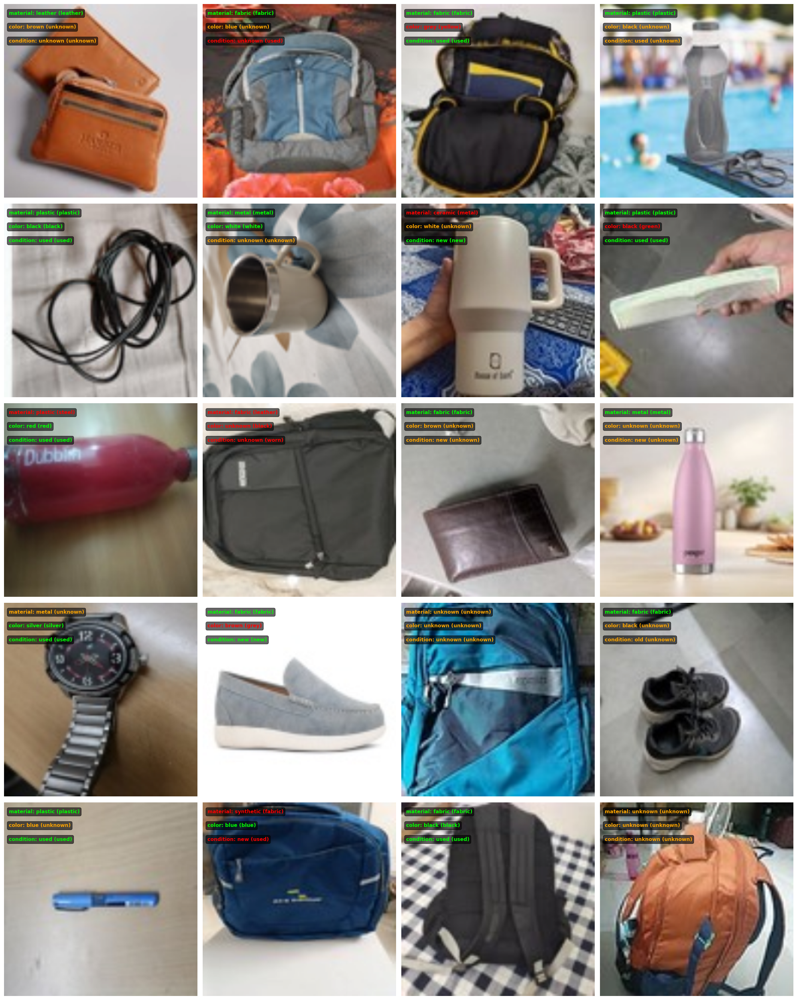

In [17]:
# ----------------- REDEFINE CONFIG VARIABLES -----------------
import torch
import os
import random
import math
import matplotlib.pyplot as plt
import numpy as np
from torchvision.utils import make_grid
from torchvision import transforms

# ✅ Set paths & device
MODEL_NAME = "mobilevit_s"
CKPT_DIR = "checkpoints_mobileViT_pooledData_attr"
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# ---------------- VISUALIZATION OF MULTI-ATTRIBUTE PREDICTIONS ----------------

# Load checkpoint (you can change this filename)
best_ckpt = os.path.join(CKPT_DIR, f"{MODEL_NAME}_epoch50.pth")
if os.path.exists(best_ckpt):
    ckpt = torch.load(best_ckpt, map_location=DEVICE)
    model.load_state_dict(ckpt["model_state"])
    print(f"✅ Loaded checkpoint: {best_ckpt}")
else:
    print("⚠️ Checkpoint not found, using current model.")

model.eval()

# Denormalization transform for display
inv_normalize = transforms.Normalize(
    mean=[-m / s for m, s in zip([0.485, 0.456, 0.406],
                                 [0.229, 0.224, 0.225])],
    std=[1 / s for s in [0.229, 0.224, 0.225]]
)

# Pick random samples from validation set
NUM_SAMPLES = 20
IMAGES_PER_ROW = 4
sample_idxs = random.sample(range(len(val_ds)), min(NUM_SAMPLES, len(val_ds)))

# Figure setup
fig, axes = plt.subplots(
    nrows=math.ceil(len(sample_idxs) / IMAGES_PER_ROW),
    ncols=IMAGES_PER_ROW,
    figsize=(IMAGES_PER_ROW * 5, math.ceil(len(sample_idxs) / IMAGES_PER_ROW) * 5)
)
axes = axes.flatten()

for ax_idx, idx in enumerate(sample_idxs):
    img_tensor, true_targets = val_ds[idx]
    img = img_tensor.unsqueeze(0).to(DEVICE)

    # Forward pass
    with torch.no_grad():
        outputs = model(img)
        pred_indices = [torch.argmax(o, dim=1).item() for o in outputs]

    # Convert indices to readable labels
    inv_maps = {a: {v: k for k, v in attr_mappings[a].items()} for a in top_attrs}
    pred_labels = [inv_maps[a][pred_indices[i]] for i, a in enumerate(top_attrs)]
    true_labels = [inv_maps[a][true_targets[i].item()] for i, a in enumerate(top_attrs)]

    # Denormalize for display
    img_disp = inv_normalize(img_tensor).clamp(0, 1).permute(1, 2, 0).cpu().numpy()
    axes[ax_idx].imshow(img_disp)
    axes[ax_idx].axis("off")

    # Draw attribute-wise colored labels
    y_text = 12
    for a_i, attr in enumerate(top_attrs):
        pred_val, true_val = pred_labels[a_i], true_labels[a_i]

        if true_val == "unknown":
            color = "orange"
        elif pred_val == true_val:
            color = "lime"
        else:
            color = "red"

        axes[ax_idx].text(
            5, y_text,
            f"{attr}: {pred_val} ({true_val})",
            fontsize=9,
            color=color,
            weight="bold",
            bbox=dict(facecolor="black", alpha=0.6, boxstyle="round,pad=0.3")
        )
        y_text += 16

# Hide unused subplots if total < grid
for j in range(ax_idx + 1, len(axes)):
    axes[j].axis("off")

plt.tight_layout()
plt.show()